<center>

# Diploma in Data Science, Machine Learning, and its Applications
    
## Project #3: Supervised and Unsupervised Learning

</center>

## **Analysis and Prediction of Air Quality in an Urban Area: Multisensor Data Exploration and Predictive Modeling**

Air quality is a major issue on the global environmental health agenda. According to the WHO (2018), air pollutants are responsible for 1 in every 9 deaths. However, many parts of the world lack basic air quality data.

This dataset contains readings from a gas multisensor device installed in a significantly polluted area in Italy. The goal is to examine how environmental factors and pollutant concentrations interact with each other. This will help to understand the level of pollution in the urban area and use data science to inform environmental health strategies and practical recommendations to improve air quality and protect the health of the people living there.

The data was taken from: [https://archive.ics.uci.edu/dataset/360/air+quality](https://archive.ics.uci.edu/dataset/360/air+quality)

#### If you need to download the dataset, access the following repository:

[https://github.com/PatriMiranda/Calidad-de-Aire/blob/main/AirQualityUCI.csv](https://github.com/PatriMiranda/Calidad-de-Aire/blob/main/AirQualityUCI.csv)


## Goal

In this third practical assignment on supervised and/or unsupervised learning, we will apply classification, regression, decision tree models, or more advanced Machine Learning models such as XGBoost, LightGBM, or any other model you consider appropriate, with the goal of extracting the most relevant and meaningful insights from the dataset.

The purpose is to evaluate and compare different models to determine which one provides the best accuracy and predictive power in relation to the questions initially posed. Through this analysis, we aim to propose effective actions to mitigate the impacts of air pollution on public health and the environment.



###**Dataset:**

It consists of 9,471 rows and 17 columns, recording hourly averages of responses and gas concentrations obtained by a certified analyzer using metal oxide chemical sensors (identified as PT08.S1, S2, S3, S4, and S5), covering a one-year period from March 2004 to April 2005. Missing data has been encoded as -200.

**Variables to analyze:**

1. **Date** (DD/MM/YYYY)

2. **Time** (HH.MM.SS)

3. **CO (GT)**: true hourly average concentration of CO in mg/m³ (reference analyzer)

4. **PT08.S1 (tin oxide)**: hourly average sensor response (nominally targeted at CO)

5. **NMHC (GT)**: true hourly average concentration of non-methane hydrocarbons in µg/m³ (reference analyzer)

6. **C6H6 (GT)**: true hourly average concentration of benzene in µg/m³ (reference analyzer)

7. **PT08.S2 (titania)**: hourly average sensor response (nominally targeted at NMHC)

8. **NOx (GT)**: true hourly average concentration of NOx in ppb (reference analyzer)

9. **PT08.S3 (tungsten oxide)**: hourly average sensor response (nominally targeted at NOx)

10. **NO2 (GT)**: true hourly average concentration of NO2 in µg/m³ (reference analyzer)

11. **PT08.S4 (tungsten oxide)**: hourly average sensor response (nominally targeted at NO2)

12. **PT08.S5 (indium oxide)**: hourly average sensor response (nominally targeted at O₃)

13. **T**: Temperature in °C

14. **RH**: Relative Humidity (%)

15. **AH**: Absolute Humidity


### Questions to answer in Project #3:

1. **Which predictive model provides the best fit for predicting pollutant concentrations based on environmental factors and/or sensor responses?**

You may apply various models, such as:

* **Regression models**: Multiple Linear Regression, Ridge, Lasso, Random Forest, Gradient Boosting, XGBoost, and LightGBM
* **Classification models**: PCA, clustering, neural networks

#### Other questions may arise depending on your group’s analysis. Only answer the one that fits your objective:

2. **Which factors most influence the concentration of pollutants (one or more of CO, NO₂, NOx) in the air?**

You can identify the variables with the greatest impact on pollutant concentration, such as **Temperature (T)**, **Relative Humidity (RH)**, or sensor responses.

Applicable models: Linear Regression, Random Forest.

3. **How can we predict the concentration of pollutants (one or more of CO, NO₂, NOx, C₆H₆) based on environmental and sensor variables?**

For example, identify a model that can predict NO₂ levels using **T** and **RH**.

Applicable models: Linear Regression, XGBoost, LightGBM.

4. **What environmental conditions precede high levels of CO, NO₂, NOx, or C₆H₆ (one or more)?**

Identify which environmental variables are most related to the pollutants.

Applicable models: Random Forest, Gradient Boosting.

5. **Can air quality be predicted based on pollutant concentrations and environmental conditions?**

It is necessary to calculate air quality and use classification models considering pollutant concentrations and environmental variables.

Applicable models: Classification models (neural networks, Random Forest, PCA) and regression models (Linear, XGBoost, LightGBM).


----

#Importing Libraries

In [ ]:
#Importar Librerias

#Librerias Basicas
import pandas as pd
import numpy as np
import matplotlib as mpl

#Librerias de Visualizacion
import seaborn as sns
import matplotlib.pyplot as plt
from prettytable import PrettyTable


#Paleta de colores
color_pal = sns.color_palette('viridis',10)
plt.style.use('seaborn')
#
#Librerias Para los Modelos

#Pre-proceso y Spliting
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

#Modelos
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.ensemble import RandomForestClassifier

#Evaluacion y Optimizacion
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

#from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV,cross_val_score, KFold
#from sklearn.feature_selection import RFECV

#Series de Tiempo ARIMA, SARIMA, VAR
from statsmodels.tsa.arima.model import ARIMA  # Para el modelo ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX  # Para el modelo SARIMA
from statsmodels.tsa.api import VAR

# Opcional: para evitar warnings
import warnings
warnings.filterwarnings("ignore")

#Loading Data

In [ ]:
# Cargar los datos obtenidos en el Practico 2
df = pd.read_csv('https://raw.githubusercontent.com/RobertBringer/diplodatos2024/main/CA_limpio.csv')
df.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime
0,0.211864,0.511845,0.185535,0.362097,0.111036,0.310885,0.335347,0.513040,0.454822,0.333333,0.499371,0.280066,2004-03-10 18:00:00
1,0.161017,0.463029,0.146226,0.312398,0.068382,0.360864,0.271903,0.453237,0.326238,0.326882,0.484277,0.264282,2004-03-10 19:00:00
2,0.177966,0.541996,0.139937,0.303659,0.087339,0.346463,0.338369,0.451439,0.370547,0.296774,0.563522,0.276352,2004-03-10 20:00:00
3,0.177966,0.523331,0.143082,0.308575,0.115098,0.326133,0.362538,0.464478,0.426586,0.277419,0.638994,0.294190,2004-03-10 21:00:00
4,0.127119,0.448672,0.100629,0.247406,0.087339,0.373994,0.344411,0.422212,0.386186,0.281720,0.633962,0.295216,2004-03-10 22:00:00


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8991 entries, 0 to 8990
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CO(GT)         8991 non-null   float64
 1   PT08.S1(CO)    8991 non-null   float64
 2   C6H6(GT)       8991 non-null   float64
 3   PT08.S2(NMHC)  8991 non-null   float64
 4   NOx(GT)        8991 non-null   float64
 5   PT08.S3(NOx)   8991 non-null   float64
 6   NO2(GT)        8991 non-null   float64
 7   PT08.S4(NO2)   8991 non-null   float64
 8   PT08.S5(O3)    8991 non-null   float64
 9   T              8991 non-null   float64
 10  RH             8991 non-null   float64
 11  AH             8991 non-null   float64
 12  DateTime       8625 non-null   object 
dtypes: float64(12), object(1)
memory usage: 913.3+ KB


Due to issues detected during the implementation of the models, a review of our "cleaned" data was carried out. During this review, it was discovered that in the previous practical assignment, null values were generated in the `DateTime` column when imputing values in the numerical variables.

To resolve this issue, it was decided to remove these missing data points.


#Data Correction

In [ ]:
df.isna().sum()

,0
CO(GT),0
PT08.S1(CO),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
PT08.S3(NOx),0
NO2(GT),0
PT08.S4(NO2),0
PT08.S5(O3),0
T,0


We changed the data type of the `DateTime` column.

In [ ]:
df['DateTime'] = pd.to_datetime(df['DateTime'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8991 entries, 0 to 8990
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   CO(GT)         8991 non-null   float64       
 1   PT08.S1(CO)    8991 non-null   float64       
 2   C6H6(GT)       8991 non-null   float64       
 3   PT08.S2(NMHC)  8991 non-null   float64       
 4   NOx(GT)        8991 non-null   float64       
 5   PT08.S3(NOx)   8991 non-null   float64       
 6   NO2(GT)        8991 non-null   float64       
 7   PT08.S4(NO2)   8991 non-null   float64       
 8   PT08.S5(O3)    8991 non-null   float64       
 9   T              8991 non-null   float64       
 10  RH             8991 non-null   float64       
 11  AH             8991 non-null   float64       
 12  DateTime       8625 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(12)
memory usage: 913.3 KB


In [ ]:
#Vemos que valores son NaN
df[df['DateTime'].isna()]

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime
524,0.271186,0.474515,0.256289,0.442381,0.109005,0.199492,0.314199,0.288669,0.419635,0.548387,0.230189,0.296437,NaT
525,0.347458,0.633166,0.331761,0.517750,0.141503,0.160102,0.392749,0.664119,0.511729,0.531183,0.288050,0.340468,NaT
526,0.457627,0.678392,0.391509,0.571273,0.179418,0.127912,0.489426,0.691547,0.618158,0.488172,0.345912,0.343596,NaT
701,0.135593,0.306533,0.099057,0.245221,0.067028,0.266413,0.220544,0.429856,0.329713,0.286022,0.762264,0.368617,NaT
702,0.076271,0.197416,0.055031,0.166029,0.038998,0.347310,0.156495,0.377248,0.262381,0.279570,0.755975,0.355813,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8111,0.313559,0.346016,0.132075,0.293282,0.222749,0.155443,0.504532,0.264388,0.417463,0.184946,0.627673,0.195524,NaT
8112,0.355932,0.390524,0.166667,0.339705,0.233582,0.133418,0.495468,0.302608,0.461772,0.167742,0.665409,0.193569,NaT
8113,0.398305,0.437186,0.179245,0.354451,0.329045,0.122829,0.564955,0.305306,0.499566,0.176344,0.644025,0.193715,NaT
8114,0.347458,0.376167,0.147799,0.315128,0.272173,0.151207,0.549849,0.256295,0.440052,0.159140,0.641509,0.176465,NaT


In [ ]:
df.dropna(inplace=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8625 entries, 0 to 8990
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   CO(GT)         8625 non-null   float64       
 1   PT08.S1(CO)    8625 non-null   float64       
 2   C6H6(GT)       8625 non-null   float64       
 3   PT08.S2(NMHC)  8625 non-null   float64       
 4   NOx(GT)        8625 non-null   float64       
 5   PT08.S3(NOx)   8625 non-null   float64       
 6   NO2(GT)        8625 non-null   float64       
 7   PT08.S4(NO2)   8625 non-null   float64       
 8   PT08.S5(O3)    8625 non-null   float64       
 9   T              8625 non-null   float64       
 10  RH             8625 non-null   float64       
 11  AH             8625 non-null   float64       
 12  DateTime       8625 non-null   datetime64[ns]
dtypes: datetime64[ns](1), float64(12)
memory usage: 943.4 KB


##**Standardization**

The prediction methods to be used were studied and analyzed, and it was found that for potentially better performance, the data should be transformed by standardizing them. Let us recall that `StandardScaler` is a transformation that standardizes the data by subtracting the mean and dividing by the standard deviation.

The formula is:
$$X_{scaled} = \frac{X - 𝜇}{𝜎}$$
Where 𝜇 is the mean and 𝜎 is the standard deviation.
As a result, the transformed data will have a mean of 0 and a standard deviation of 1.

Previously, we had a specific limited range using MinMaxScaler.


In [ ]:
scaler = StandardScaler()
df_scaled = df.copy()

columnas_numericas = df.select_dtypes(include=['int64', 'float64']).columns  # selecciona columnas numéricas
df_scaled[columnas_numericas] = scaler.fit_transform(df[columnas_numericas])  # escala solo columnas numéricas

df_scaled.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime
0,0.396575,1.208623,0.245478,0.403081,-0.304450,0.841239,0.134443,0.673910,0.633492,-0.553794,0.000276,-0.669466,2004-03-10 18:00:00
1,-0.031346,0.895190,-0.088681,0.063124,-0.621969,1.298453,-0.318299,0.290692,-0.114427,-0.587924,-0.069415,-0.749316,2004-03-10 19:00:00
2,0.111294,1.402214,-0.142147,0.003352,-0.480849,1.166714,0.156002,0.279167,0.143302,-0.747195,0.296464,-0.688254,2004-03-10 20:00:00
3,0.111294,1.282372,-0.115414,0.036974,-0.274210,0.980728,0.328475,0.362726,0.469253,-0.849584,0.644920,-0.598022,2004-03-10 21:00:00
4,-0.316627,0.803003,-0.476306,-0.381435,-0.480849,1.418569,0.199120,0.091880,0.234265,-0.826831,0.621690,-0.592831,2004-03-10 22:00:00


Note that the column containing time information is not transformed. To simplify the manipulation of the variables, let’s rename the columns.

In [ ]:
# Nuevos Nombres para las Columnas
columnas = {'CO(GT)':'CO', 'PT08.S1(CO)':'S1', 'C6H6(GT)':'C6H6','PT08.S2(NMHC)':'S2',
            'NOx(GT)':'NOx', 'PT08.S3(NOx)':'S3', 'NO2(GT)':'NO2', 'PT08.S4(NO2)':'S4',
            'PT08.S5(O3)':'S5','T':'Temp', 'RH':'HR', 'AH':'HA'}

df_scaled.rename(columns=columnas, inplace=True)
df_scaled.head()

,CO,S1,C6H6,S2,NOx,S3,NO2,S4,S5,Temp,HR,HA,DateTime
0,0.396575,1.208623,0.245478,0.403081,-0.304450,0.841239,0.134443,0.673910,0.633492,-0.553794,0.000276,-0.669466,2004-03-10 18:00:00
1,-0.031346,0.895190,-0.088681,0.063124,-0.621969,1.298453,-0.318299,0.290692,-0.114427,-0.587924,-0.069415,-0.749316,2004-03-10 19:00:00
2,0.111294,1.402214,-0.142147,0.003352,-0.480849,1.166714,0.156002,0.279167,0.143302,-0.747195,0.296464,-0.688254,2004-03-10 20:00:00
3,0.111294,1.282372,-0.115414,0.036974,-0.274210,0.980728,0.328475,0.362726,0.469253,-0.849584,0.644920,-0.598022,2004-03-10 21:00:00
4,-0.316627,0.803003,-0.476306,-0.381435,-0.480849,1.418569,0.199120,0.091880,0.234265,-0.826831,0.621690,-0.592831,2004-03-10 22:00:00


Since we are working with time series, we will add a couple of models and analyses that involve more information about temporal variables.

Therefore, let’s modify our dataset by adding the following variables and transformations.

In [ ]:
# Realizamos una copia para en ella agregar las nuevas variables
aire = df_scaled.copy()

# Nuevas Columnas Temporales
aire['year'] = aire['DateTime'].dt.year
aire['month'] = aire['DateTime'].dt.month
aire['day'] = aire['DateTime'].dt.day
aire['weekday'] = aire['DateTime'].dt.weekday
aire['hour'] = aire['DateTime'].dt.hour

# Transformaciones cíclicas
aire['weekday_sin'] = np.sin(2 * np.pi * aire['weekday'] / 7)
aire['weekday_cos'] = np.cos(2 * np.pi * aire['weekday'] / 7)
aire['hour_sin'] = np.sin(2 * np.pi * aire['hour'] / 24)
aire['hour_cos'] = np.cos(2 * np.pi * aire['hour'] / 24)

Finally, `aire` will be the dataset we will use in the following models.


#Prediction Models

In order to explore different modeling possibilities for predicting pollutant concentrations, we will develop various models using each pollutant as the target variable separately.

##Preliminary Preparation

##For the models using random Train/Test splits

We define the models to be used and a function for their evaluation.

In [ ]:
# Calculo de los Metricas
def evaluate_model(y_test, y_pred):
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    return mae,rmse,r2

In [ ]:
# Modelos Seleccionados como Baseline
lr = LinearRegression(fit_intercept=True)
ridge = Ridge(fit_intercept=True,alpha=1)
lasso = Lasso(fit_intercept=True,alpha=0.01)
rf = RandomForestRegressor()
gb = GradientBoostingRegressor()
xgb = XGBRegressor()
lgb = LGBMRegressor()

Note: In the following methods, sensor S2 will not be considered. This sensor is related to one of the pollutants previously removed: NMHC (GT).

##For the Models with Time Series Analysis, with different Train/Test.

To add a different perspective to the problem, we will define the test and train sets in a special way.

For this, we create a copy of the aire dataframe, where its index will be the DateTime column.

In [ ]:
aire_copy = aire.copy()
aire_copy = aire_copy.set_index('DateTime')
aire_copy.index = pd.to_datetime(aire_copy.index)
aire_copy.head()

,CO,S1,C6H6,S2,NOx,S3,NO2,S4,S5,Temp,...,HA,year,month,day,weekday,hour,weekday_sin,weekday_cos,hour_sin,hour_cos
DateTime,,,,,,,,,,,,,,,,,,,,,
2004-03-10 18:00:00,0.396575,1.208623,0.245478,0.403081,-0.304450,0.841239,0.134443,0.673910,0.633492,-0.553794,...,-0.669466,2004,3,10,2,18,0.974928,-0.222521,-1.000000,-1.836970e-16
2004-03-10 19:00:00,-0.031346,0.895190,-0.088681,0.063124,-0.621969,1.298453,-0.318299,0.290692,-0.114427,-0.587924,...,-0.749316,2004,3,10,2,19,0.974928,-0.222521,-0.965926,2.588190e-01
2004-03-10 20:00:00,0.111294,1.402214,-0.142147,0.003352,-0.480849,1.166714,0.156002,0.279167,0.143302,-0.747195,...,-0.688254,2004,3,10,2,20,0.974928,-0.222521,-0.866025,5.000000e-01
2004-03-10 21:00:00,0.111294,1.282372,-0.115414,0.036974,-0.274210,0.980728,0.328475,0.362726,0.469253,-0.849584,...,-0.598022,2004,3,10,2,21,0.974928,-0.222521,-0.707107,7.071068e-01
2004-03-10 22:00:00,-0.316627,0.803003,-0.476306,-0.381435,-0.480849,1.418569,0.199120,0.091880,0.234265,-0.826831,...,-0.592831,2004,3,10,2,22,0.974928,-0.222521,-0.500000,8.660254e-01


This way, it is easier to visualize the time series of each pollutant and sensor.

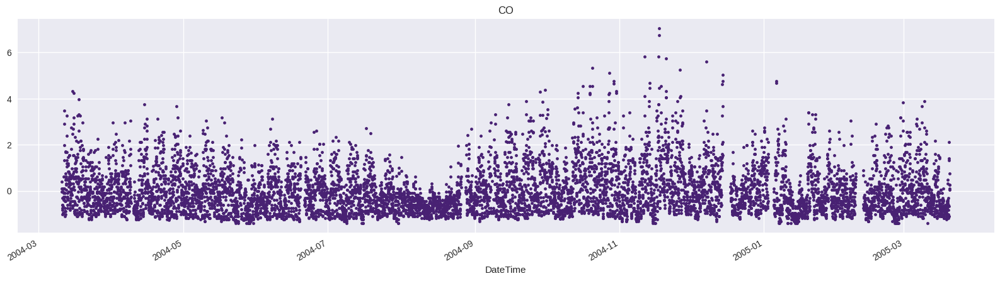

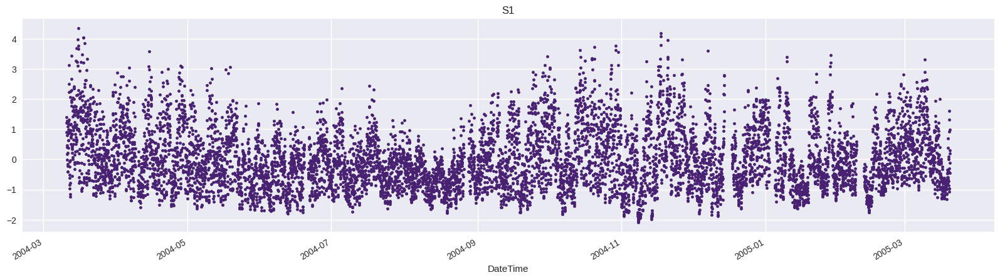

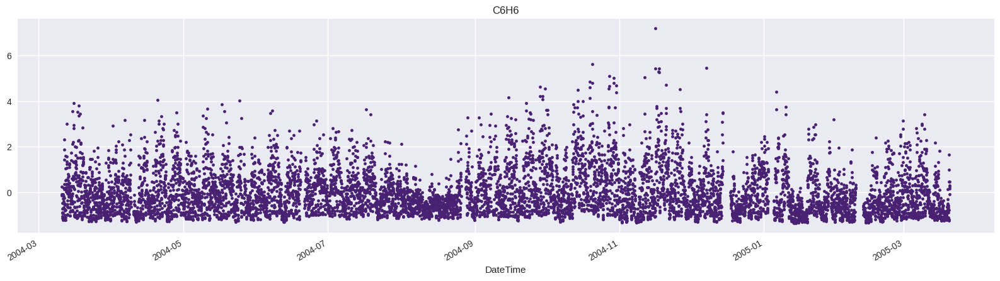

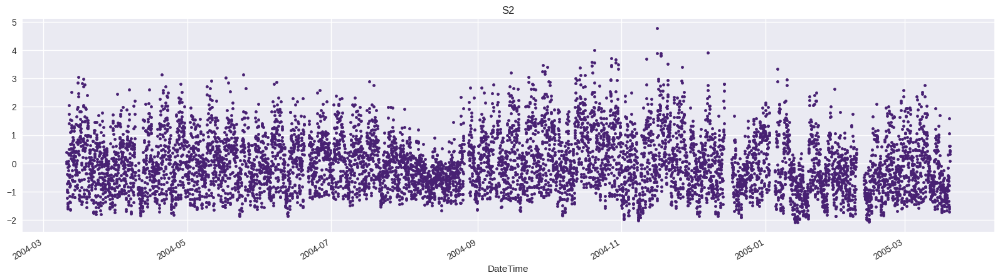

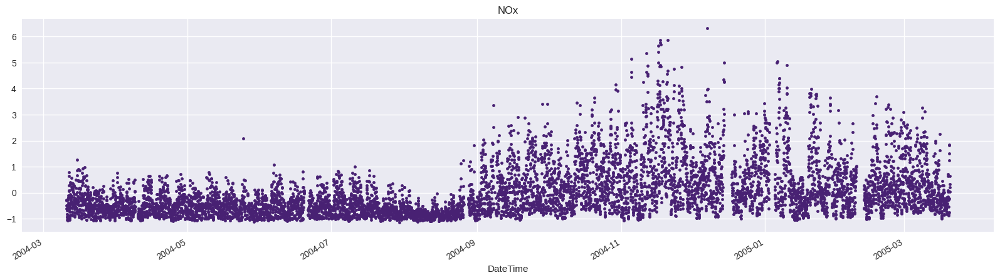

...

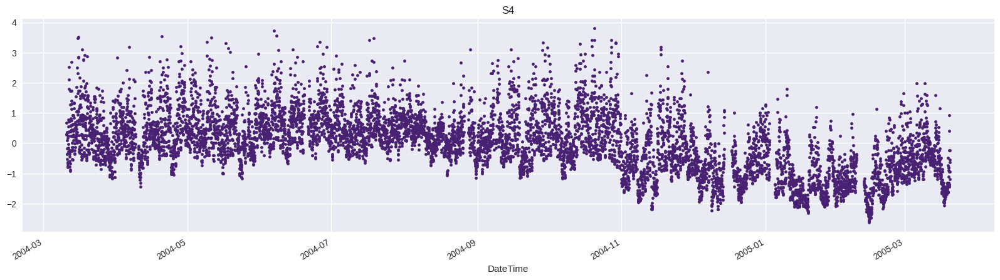

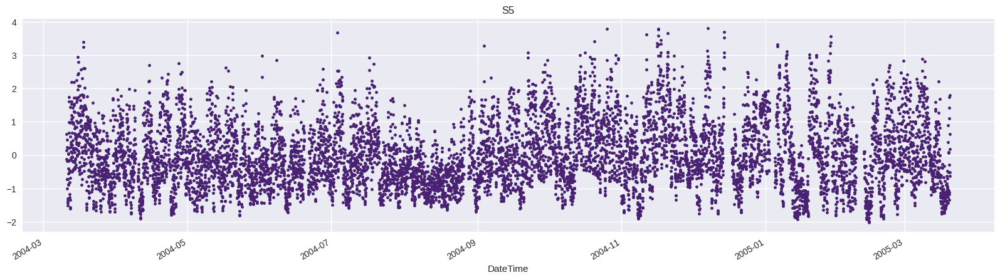

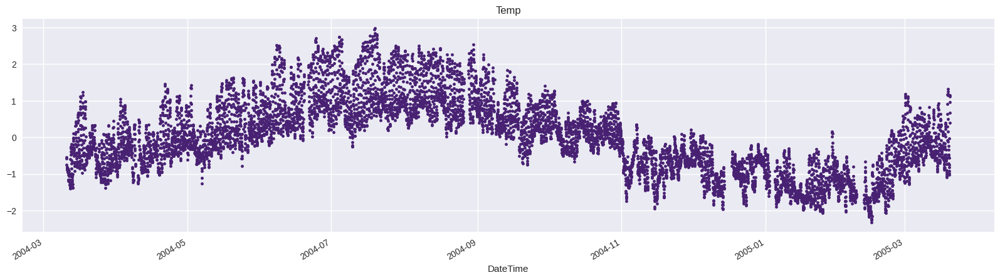

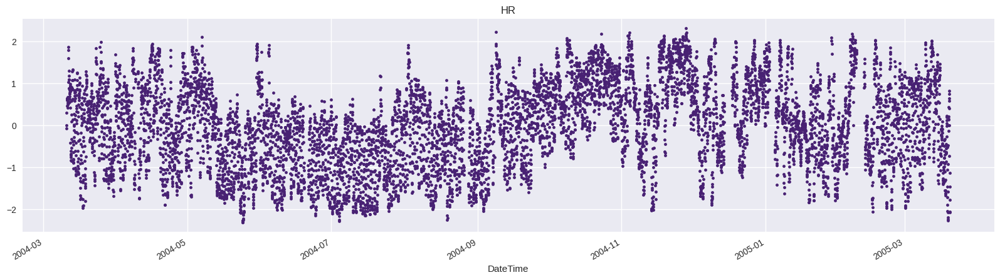

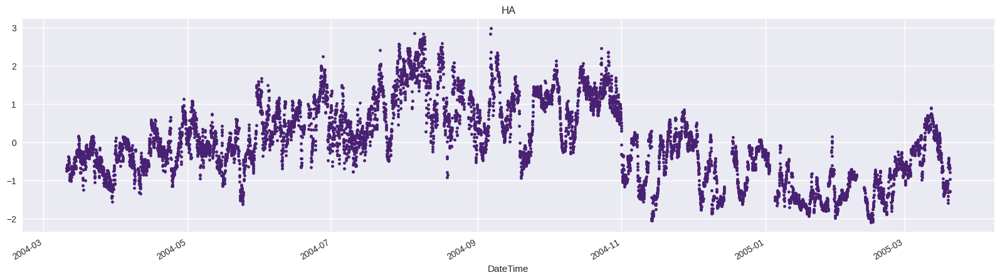

In [ ]:
features = ['CO', 'S1', 'C6H6', 'S2', 'NOx', 'S3', 'NO2', 'S4', 'S5', 'Temp', 'HR','HA']
for  feature in features:
  aire_copy[feature].plot(style='.',
          figsize=(20, 5),
          color=color_pal[0],
          title=feature)
  plt.show()

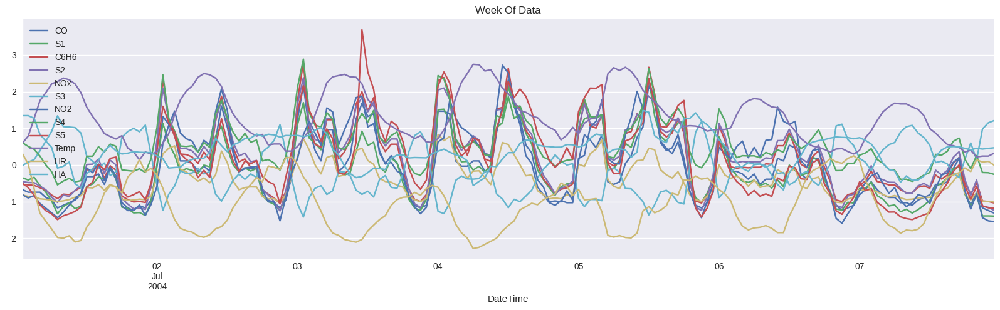

In [ ]:
aire_copy[features].loc[(aire_copy[features].index > '2004-07-01') & (aire_copy[features].index < '2004-07-08')] \
    .plot(figsize=(20, 5), title='Week Of Data')
plt.show()

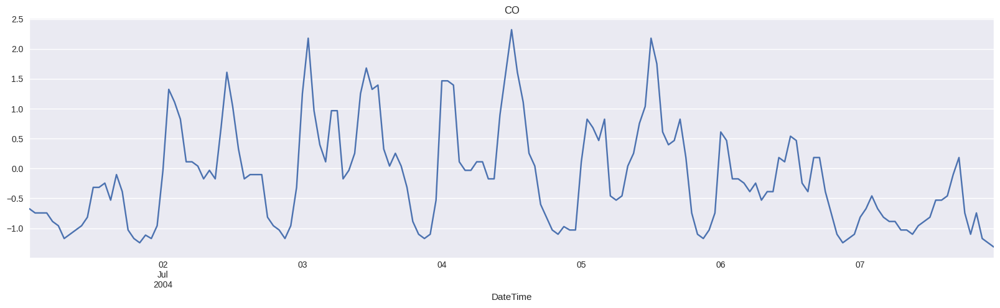

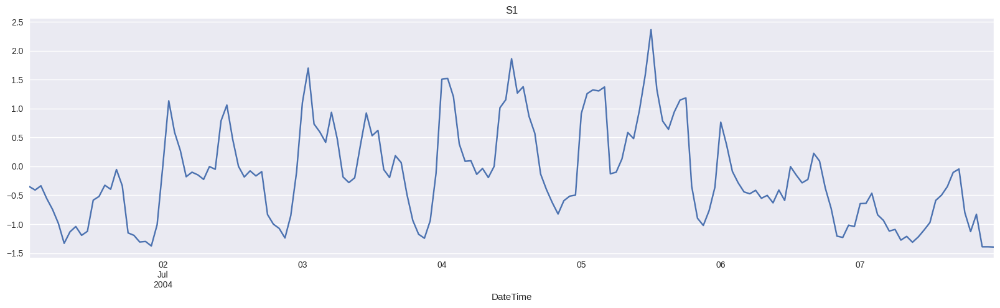

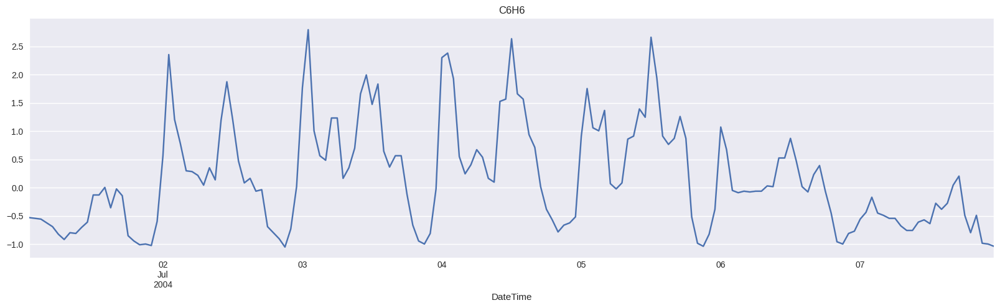

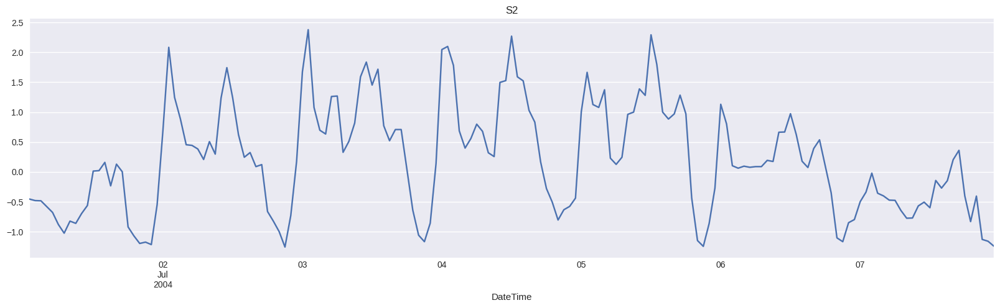

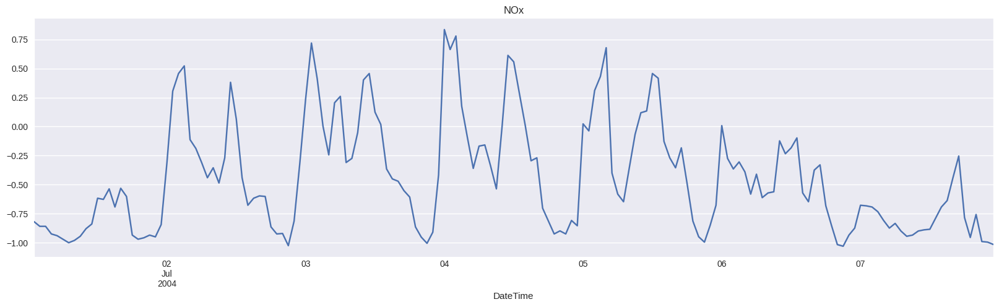

...

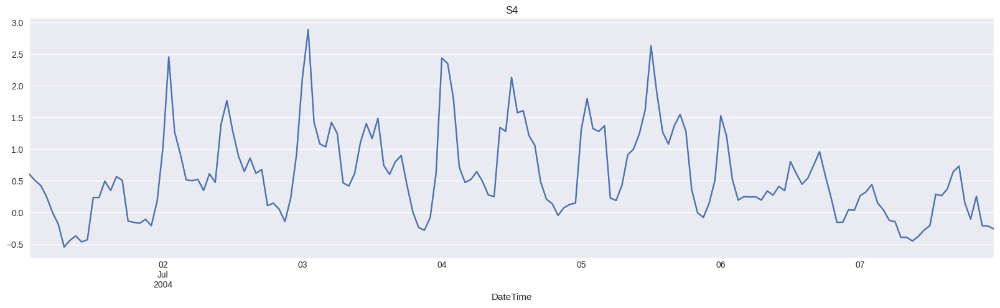

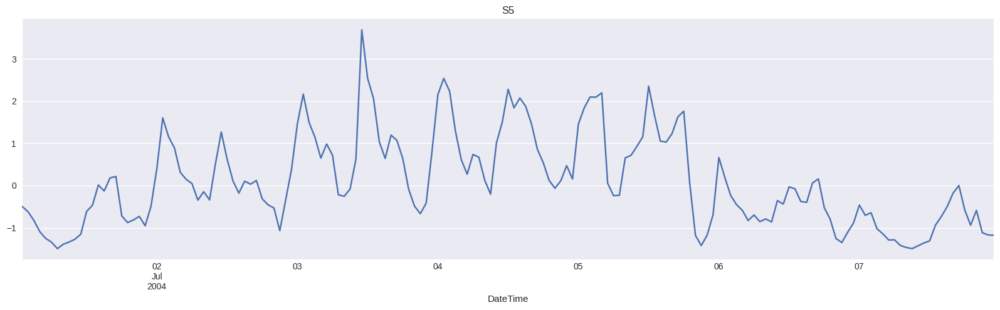

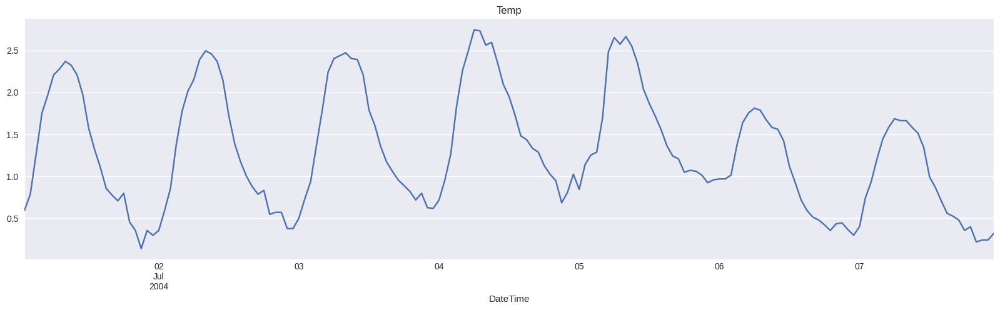

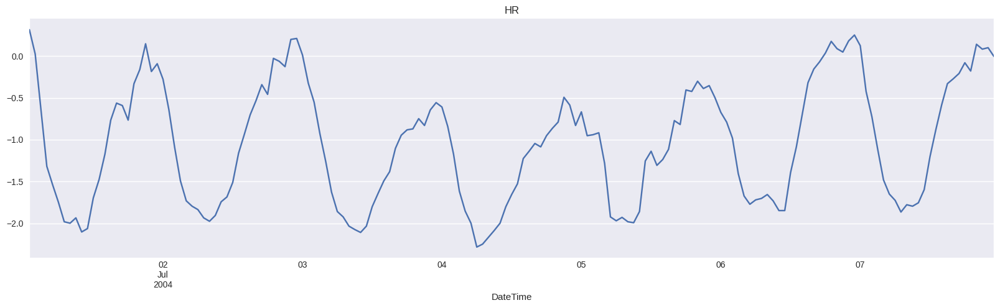

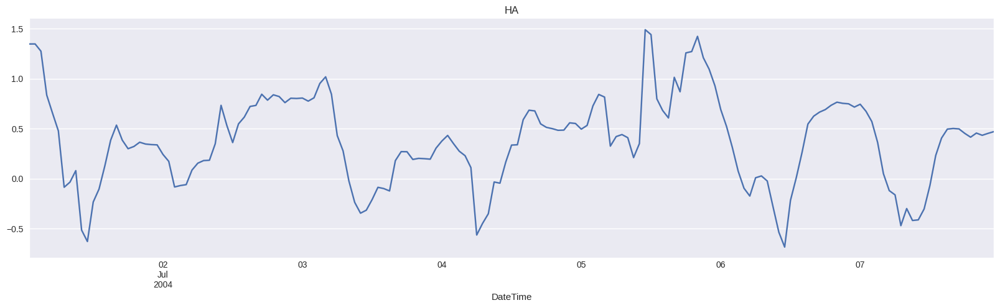

In [ ]:
for  feature in features:
  aire_copy[feature].loc[(aire_copy.index > '2004-07-01') & (aire_copy.index < '2004-07-08')] \
      .plot(figsize=(20, 5), title=feature)
  plt.show()

Finally, let’s perform the split of the Train and Test sets.

In [ ]:
#Llamemos de diferente manera a este dataframe para no confundirlo con `aire`
df_model = aire_copy

In [ ]:
#Train/Test
train = df_model.loc[df_model.index < '2004-12-31'] # se toma una fecha de corte
test = df_model.loc[df_model.index >= '2004-12-31']

Therefore, the Train and Test sets are displayed as follows.

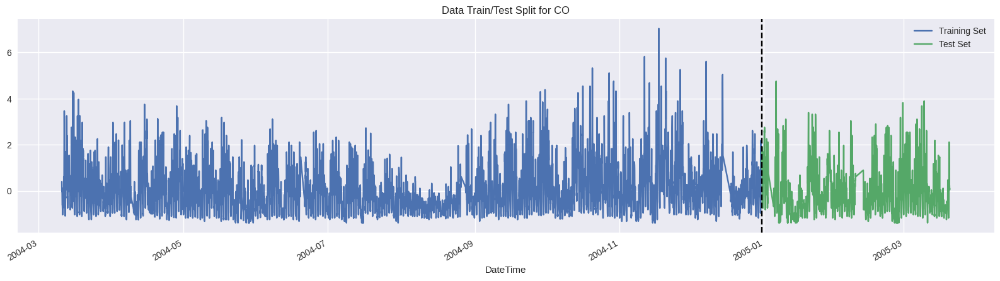

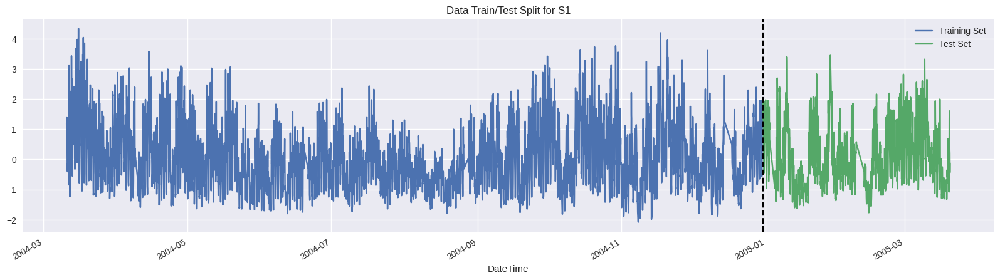

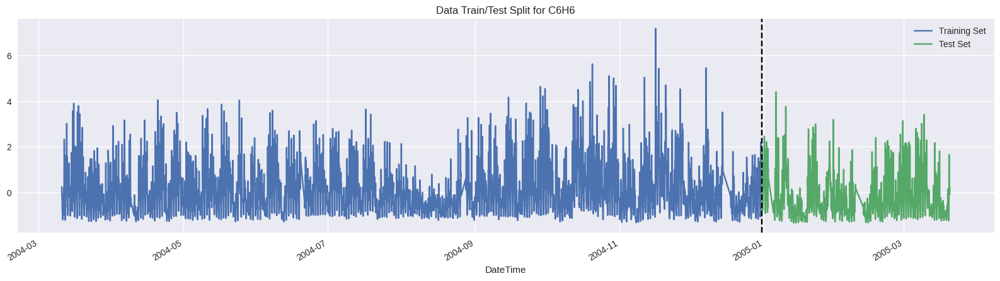

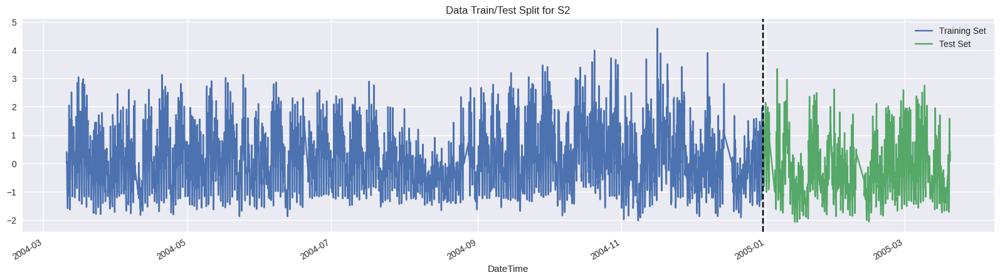

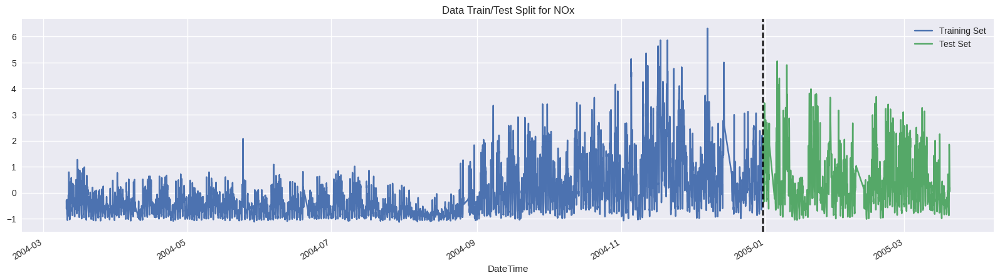

...

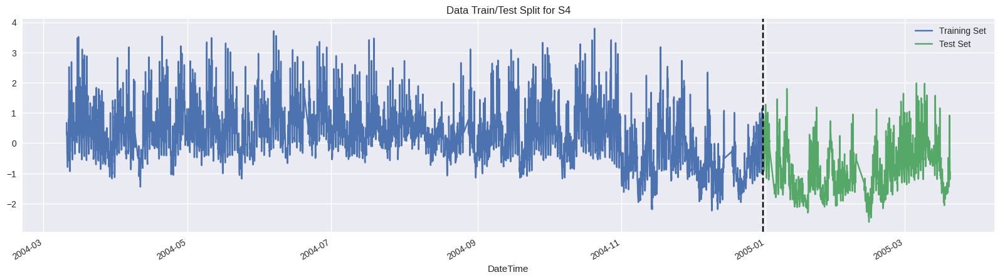

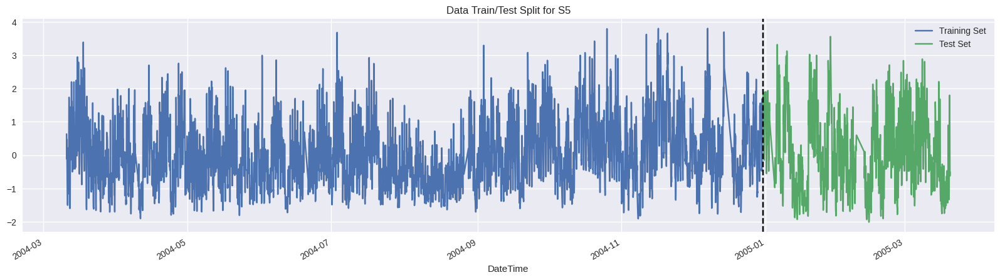

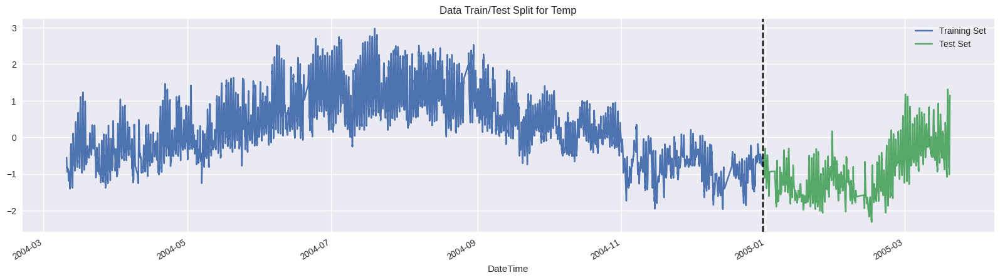

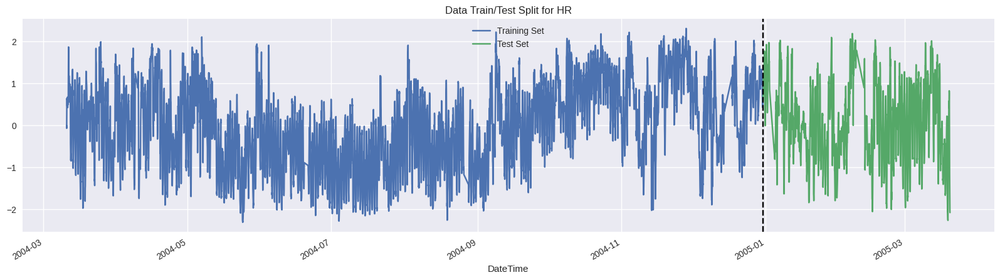

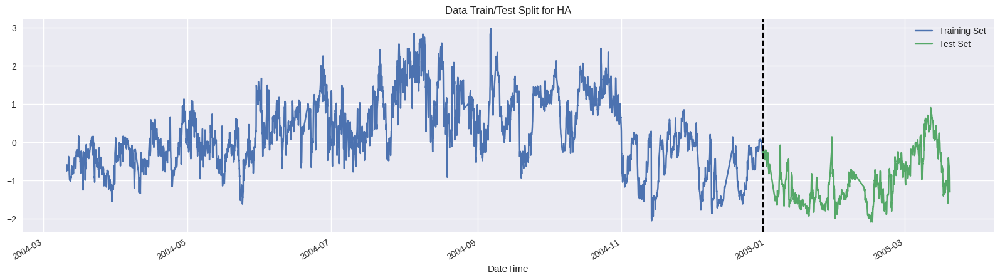

In [ ]:
for feature in features:
  fig, ax = plt.subplots(figsize=(20, 5))
  train[feature].plot(ax=ax, label='Training Set', title=f'Data Train/Test Split for {feature}')
  test[feature].plot(ax=ax, label='Test Set')
  ax.axvline('2004-12-31', color='black', ls='--')
  ax.legend(['Training Set', 'Test Set'])
  plt.show()

#Analysis of the Pollutant: CO

We will begin by analyzing the models with the usual Train/Test split.

In [ ]:
# Seleccion de Variables y Variable Objetivo
FEATURES = ['S1', 'C6H6', 'NOx', 'S3', 'NO2', 'S4',
            'S5', 'Temp', 'HR','HA',  'year', 'month',
            'day', 'weekday', 'hour','weekday_sin',
            'weekday_cos', 'hour_sin', 'hour_cos']
TARGET = 'CO'

# Subdivision del dataset
X = aire[FEATURES]
y = aire[TARGET]

In [ ]:
# Division los datos en train y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Entrenar los distintos modelos
models = {
    'Regresión Lineal': lr,
    'Ridge': ridge,
    'Lasso': lasso,
    'Random Forest': rf,
    'Gradient Boosting': gb,
    'XGBoost': xgb,
    'LightGBM': lgb
}

# Almacenar resultados en un diccionario
results = {
    'Modelo': [],
    'R²': [],
    'MAE': [],
    'RMSE': []
}

# Entrenamos y evaluamos cada modelo
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Calcular métricas
    mae,rmse,r2 = evaluate_model(y_test, y_pred)

    # Almacenar los resultados
    results['Modelo'].append(model_name)
    results['R²'].append(r2)
    results['MAE'].append(mae)
    results['RMSE'].append(rmse)

# Convertir el diccionario a un DataFrame
df_results = pd.DataFrame(results)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2683
[LightGBM] [Info] Number of data points in the train set: 6900, number of used features: 19
[LightGBM] [Info] Start training from score 0.005124


In [ ]:
df_results = df_results.sort_values(by='RMSE')
df_results

,Modelo,R²,MAE,RMSE
6,LightGBM,0.958372,0.126429,0.195563
5,XGBoost,0.956849,0.129266,0.199109
3,Random Forest,0.942904,0.138903,0.229032
4,Gradient Boosting,0.940187,0.152612,0.234419
0,Regresión Lineal,0.927015,0.165031,0.258947
1,Ridge,0.927008,0.165023,0.258960
2,Lasso,0.920508,0.169412,0.270244


Visualicemos estos resultados

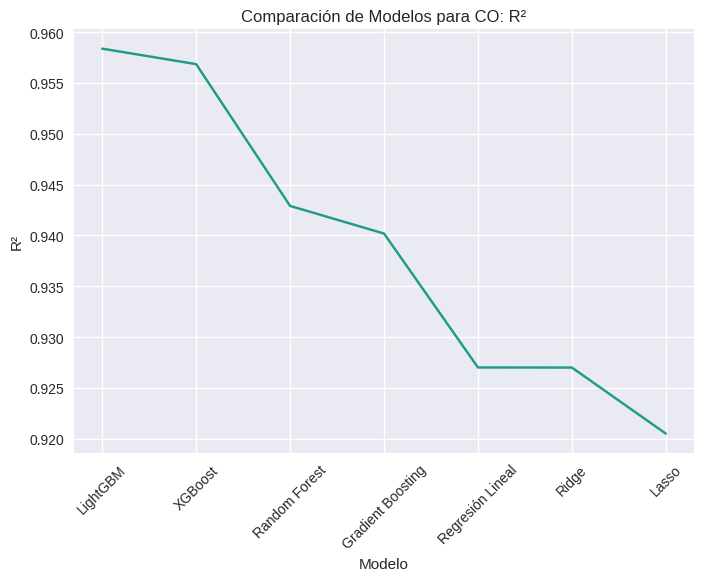

In [ ]:
sns.lineplot(x='Modelo',data=df_results,y='R²',color=color_pal[5])
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xticks(rotation=45)
plt.xlabel('Modelo')
plt.ylabel('R²')
plt.title(f'Comparación de Modelos para {TARGET}: R²')
plt.show()

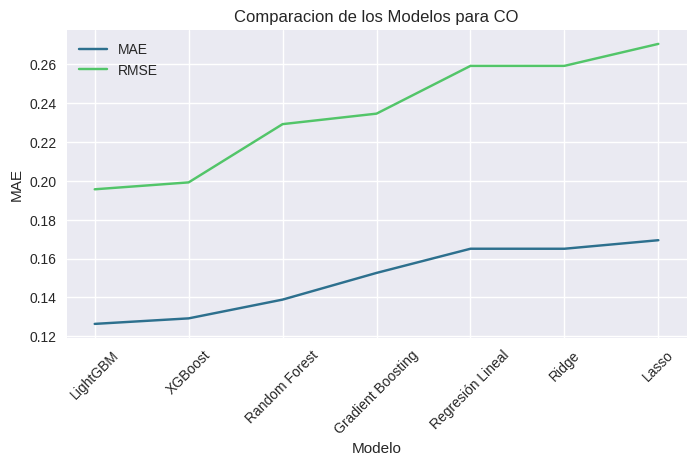

In [ ]:
fig,ax= plt.subplots(figsize=(8, 4))

ax1=sns.lineplot(x='Modelo',data=df_results,y='MAE',color=color_pal[3],label='MAE')
ax2=sns.lineplot(x='Modelo',data=df_results,y='RMSE',color=color_pal[7],label='RMSE')

plt.title(f'Comparacion de los Modelos para {TARGET}')
plt.xticks(rotation=45)
plt.gca().spines[['top', 'right']].set_visible(False)
plt.show()

##Optimization of the Best Models:

Let's perform hyperparameter tuning for the following models. We select `LightGBM`, `XGBoost`, and `Random Forest`, using RMSE as the metric.


### LightGBM

In [ ]:
lgb = LGBMRegressor(random_state=42)
parametros =  {
    'num_leaves': [31, 63],
    'max_depth': [-1, 3, 5], #el -1 es para establecer que no hay limite en la profundidad
    'learning_rate': [0.01, 0.1],
    'n_estimators': [100, 200],
    'subsample': [0.5, 0.8]
}
grid_search = GridSearchCV(estimator=lgb, param_grid=parametros, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Mejores Parámetros:", best_params)
print("Mejor Precisión:", best_score)

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

(Note: 1 minute of execution)

In [ ]:
#Entrenamos el modelo
modelo = LGBMRegressor(learning_rate=0.1, max_depth=-1, n_estimators=200,
                     subsample=0.5,num_leaves=31,random_state=42)

modelo.fit(X_train, y_train)
y_pred_lgb = modelo.predict(X_test)

#Evaluamos
mae,rmse,r2 = evaluate_model(y_test,y_pred_lgb)
print(f'Las metricas para esta optimizacion son:\nR2 = {r2} \nMAE = {mae} \nRMSE = {rmse}')

# Agregamos estos resultados
results = ['LightGBM_Hiper', r2, mae, rmse]
df_results.loc[len(df_results)] = results

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.017303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2683
[LightGBM] [Info] Number of data points in the train set: 6900, number of used features: 19
[LightGBM] [Info] Start training from score 0.005124
Las metricas para esta optimizacion son:
R2 = 0.9628639835528751 
MAE = 0.11967829139649722 
RMSE = 0.18471076138881132


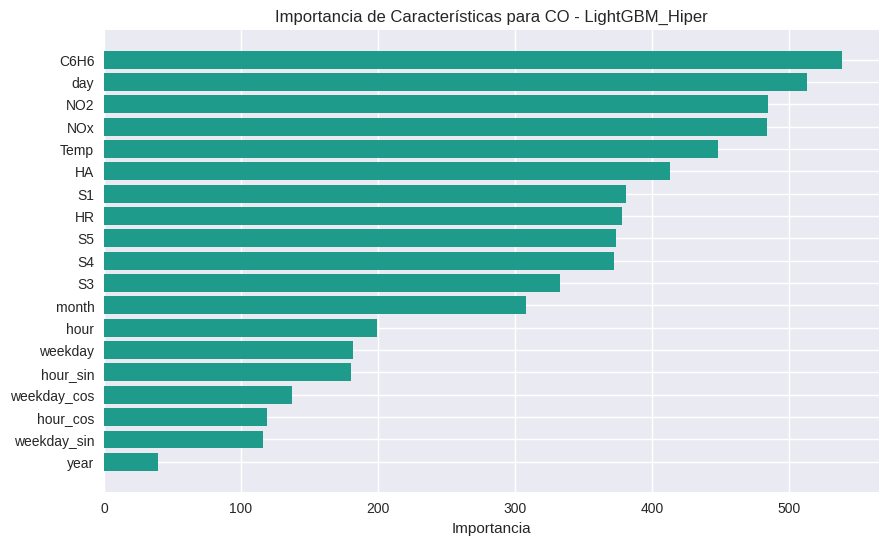

In [ ]:
# Obtener la importancia de las características
importancias = modelo.feature_importances_

# Crear un DataFrame para las importancias
df_importancias = pd.DataFrame({
    'Característica': FEATURES,
    'Importancia': importancias
})

# Ordenar el DataFrame por importancia
df_importancias = df_importancias.sort_values(by='Importancia', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
plt.barh(df_importancias['Característica'], df_importancias['Importancia'], color=color_pal[5])
plt.xlabel('Importancia')
plt.title(f'Importancia de Características para {TARGET} - LightGBM_Hiper')
plt.gca().invert_yaxis()  # Invertir el eje Y para que la característica más importante quede arriba
plt.show()

###XGBoost

In [ ]:
xgb = XGBRegressor(random_state=42)
parametros = {
    'n_estimators': [100,200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],

}

grid_search = GridSearchCV(estimator=xgb, param_grid=parametros, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Mejores Parámetros:", best_params)
print("Mejor Precisión:", best_score)

Mejores Parámetros: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}
Mejor Precisión: 0.9612287885128122


(Note: 1 minute of execution)

In [ ]:
#Entrenamos el modelo
modelo = XGBRegressor(learning_rate=0.1, max_depth=5, n_estimators=200, subsample=0.8)

modelo.fit(X_train, y_train)
y_pred_xgb = modelo.predict(X_test)

#Evaluamos
mae,rmse,r2 = evaluate_model(y_test,y_pred_xgb)
print(f'Las metricas para esta optimizacion son:\nR2 = {r2} \nMAE = {mae} \nRMSE = {rmse}')

# Agregamos estos resultados
results = ['XGBoost_Hiper', r2,mae,rmse]
df_results.loc[len(df_results)] = results

Las metricas para esta optimizacion son:
R2 = 0.9627845543539213 
MAE = 0.1231874005812814 
RMSE = 0.18490819224595367


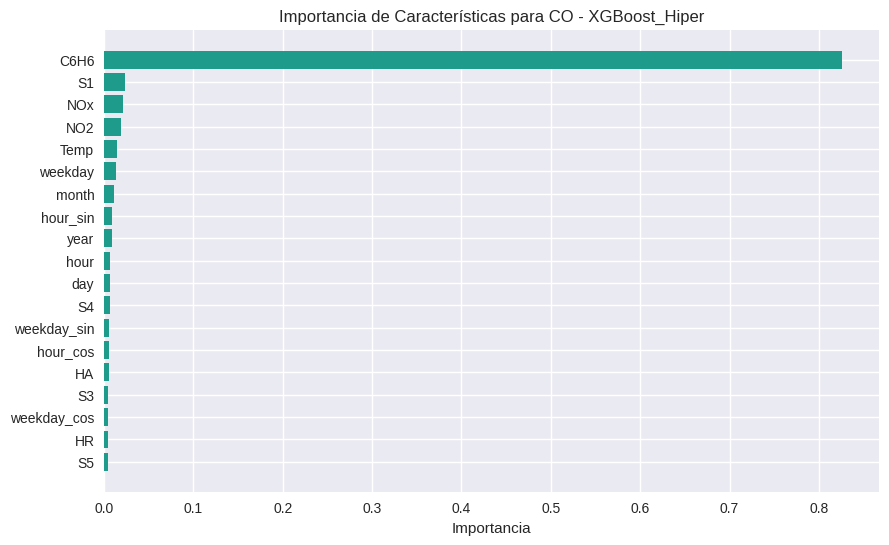

In [ ]:
# Obtener la importancia de las características
importancias = modelo.feature_importances_

# Crear un DataFrame para las importancias
df_importancias = pd.DataFrame({
    'Característica': FEATURES,
    'Importancia': importancias
})

# Ordenar el DataFrame por importancia
df_importancias = df_importancias.sort_values(by='Importancia', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
plt.barh(df_importancias['Característica'], df_importancias['Importancia'], color=color_pal[5])
plt.xlabel('Importancia')
plt.title(f'Importancia de Características para {TARGET} - XGBoost_Hiper')
plt.gca().invert_yaxis()  # Invertir el eje Y para que la característica más importante quede arriba
plt.show()

###Modelo Random Forest


In [ ]:
rf = RandomForestRegressor(random_state=42)
parametros =  {

    'n_estimators': [100, 200],
    'max_depth': [ 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],


}
grid_search = GridSearchCV(estimator=rf, param_grid=parametros, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("Mejores Parámetros:", best_params)
print("Mejor Precisión:", best_score)

Mejores Parámetros: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Mejor Precisión: 0.9436792786530575


(Note: 15 minute of execution)

In [ ]:
#Entrenamos el modelo
modelo = RandomForestRegressor(max_depth=20,min_samples_leaf=1,min_samples_split=2,n_estimators=200,random_state=42)

modelo.fit(X_train, y_train)
y_pred_rf = modelo.predict(X_test)

#Evaluamos
mae,rmse,r2= evaluate_model(y_test,y_pred_rf)
print(f'Las metricas para esta optimizacion son:\nR2 = {r2} \nMAE = {mae} \nRMSE = {rmse}')

# Agregamos estos resultados
results = ['RandomForest_Hiper', r2, mae, rmse]
df_results.loc[len(df_results)] = results

Las metricas para esta optimizacion son:
R2 = 0.9424597964556469 
MAE = 0.13870728099884164 
RMSE = 0.2299218460115065


(Note: 23 seconds of execution)

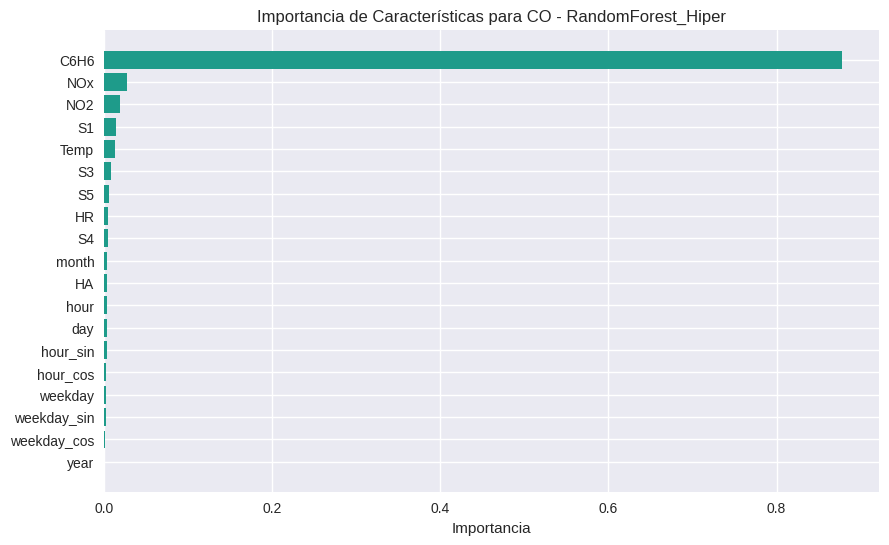

In [ ]:
# Obtener la importancia de las características
importancias = modelo.feature_importances_

# Crear un DataFrame para las importancias
df_importancias = pd.DataFrame({
    'Característica': FEATURES,
    'Importancia': importancias
})

# Ordenar el DataFrame por importancia
df_importancias = df_importancias.sort_values(by='Importancia', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
plt.barh(df_importancias['Característica'], df_importancias['Importancia'], color=color_pal[5])
plt.xlabel('Importancia')
plt.title(f'Importancia de Características para {TARGET} - RandomForest_Hiper')
plt.gca().invert_yaxis()  # Invertir el eje Y para que la característica más importante quede arriba
plt.show()

Let’s compare these improvements with the previous results.

In [ ]:
df_results = df_results.sort_values(by='RMSE')
df_results

,Modelo,R²,MAE,RMSE
7,LightGBM_Hiper,0.962864,0.119678,0.184711
8,XGBoost_Hiper,0.962785,0.123187,0.184908
6,LightGBM,0.958372,0.126429,0.195563
5,XGBoost,0.956849,0.129266,0.199109
3,Random Forest,0.942904,0.138903,0.229032
9,RandomForest_Hiper,0.942460,0.138707,0.229922
4,Gradient Boosting,0.940187,0.152612,0.234419
0,Regresión Lineal,0.927015,0.165031,0.258947
1,Ridge,0.927008,0.165023,0.258960
2,Lasso,0.920508,0.169412,0.270244


 Therefore, throughout this analysis we find that the best model obtained is:

> `LGBMRegressor(learning_rate=0.1, max_depth=-1, n_estimators=200, subsample=0.5, num_leaves=31, random_state=42)`
>
 Let’s see how the predictions for this model and the other two are visualized and behave.


###Predictions:

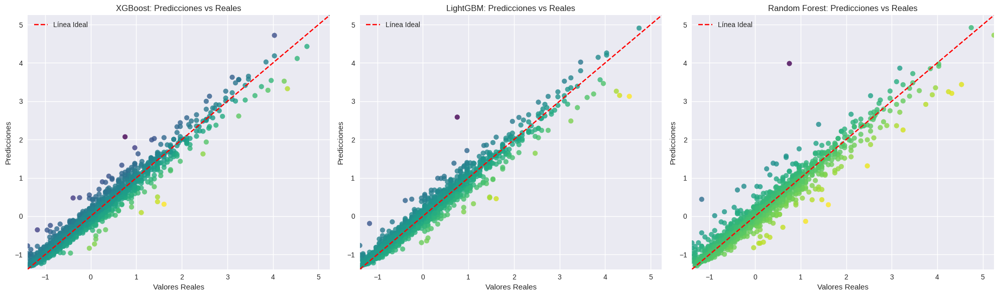

In [ ]:
# Graficar las predicciones y_test valores reales
plt.figure(figsize=(20, 6))

# Gráfico para XGBoost
plt.subplot(1, 3, 1)

errors = y_test - y_pred_xgb # Calcular el error
norm = plt.Normalize(errors.min(), errors.max()) # Crear un mapa de colores basado en el error
colors = plt.cm.viridis(norm(errors))
colors = sns.color_palette('viridis', as_cmap=True)(norm(errors))

scatter = plt.scatter(y_test, y_pred_xgb, color=colors, alpha=0.8)

#cbar = plt.colorbar(scatter)# Añadir una barra de color
#cbar.set_label('Error (Valores Reales - Predicciones)', fontsize=12)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Línea Ideal')  # Línea de referencia
plt.title('XGBoost: Predicciones vs Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)

# Gráfico para LightGBM
plt.subplot(1, 3, 2)

errors = y_test - y_pred_lgb # Calcular el error
norm = plt.Normalize(errors.min(), errors.max()) # Crear un mapa de colores basado en el error
#colors = plt.cm.viridis(norm(errors))
colors = sns.color_palette('viridis', as_cmap=True)(norm(errors))

scatter = plt.scatter(y_test, y_pred_lgb, color=colors, alpha=0.8)

#cbar = plt.colorbar(scatter)# Añadir una barra de color
#cbar.set_label('Error (Valores Reales - Predicciones)', fontsize=12)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Línea Ideal')  # Línea de referencia
plt.title('LightGBM: Predicciones vs Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)

# Gráfico para Random Forest
plt.subplot(1, 3, 3)

errors = y_test - y_pred_rf # Calcular el error
norm = plt.Normalize(errors.min(), errors.max()) # Crear un mapa de colores basado en el error
#colors = plt.cm.viridis(norm(errors))
colors = sns.color_palette('viridis', as_cmap=True)(norm(errors))

scatter = plt.scatter(y_test, y_pred_rf, color=colors, alpha=0.8)

#cbar = plt.colorbar(scatter)# Añadir una barra de color
#cbar.set_label('Error (Valores Reales - Predicciones)', fontsize=12)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Línea Ideal')  # Línea de referencia
plt.title('Random Forest: Predicciones vs Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

The model that best fits the dotted line (ideal situation) is the one that makes the best predictions. For example, we see that at the highest values (top right), XGBoost is the one that best fits the data to the ideal line. But for the low and medium values, among the three models evaluated, the one that fits the predictions best is LightGBM.

##Time Series Analysis Appendix

In [ ]:
X_train = train[FEATURES]
y_train = train[TARGET]

X_test = test[FEATURES]
y_test = test[TARGET]

In [ ]:
reg = XGBRegressor(base_score=0.5, booster='gbtree',
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

[0]	validation_0-rmse:1.10262	validation_1-rmse:1.12996
[100]	validation_0-rmse:0.49241	validation_1-rmse:0.58965
[200]	validation_0-rmse:0.29399	validation_1-rmse:0.43777
[300]	validation_0-rmse:0.23798	validation_1-rmse:0.41219
[385]	validation_0-rmse:0.22031	validation_1-rmse:0.41400


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, objective='reg:linear', ...)

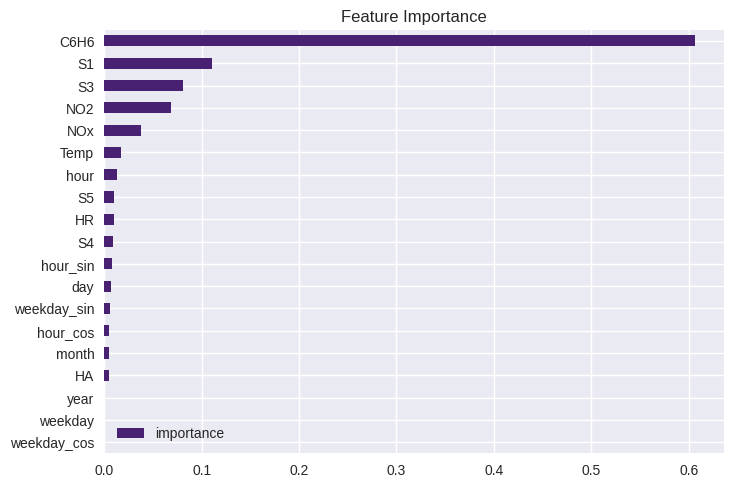

In [ ]:
fi = pd.DataFrame(data=reg.feature_importances_,
             index=reg.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance',color=color_pal[0])
plt.show()

> We see that the variable with the greatest importance for predicting this pollutant matches the previously mentioned methods, `C6H6`. However, let us remember that in this case we are working with a different Train/Test set.


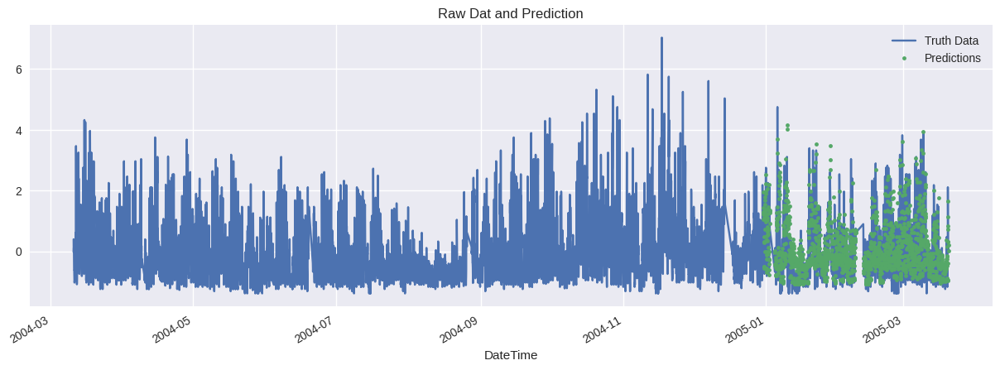

In [ ]:
PREDICTION = 'Prediction_CO'
test[PREDICTION] = reg.predict(X_test)
df_model = df_model.merge(test[[PREDICTION]], how='left', left_index=True, right_index=True)
ax = df_model[[TARGET]].plot(figsize=(15, 5))
df_model[PREDICTION].plot(ax=ax, style='.')
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Raw Dat and Prediction')
plt.show()

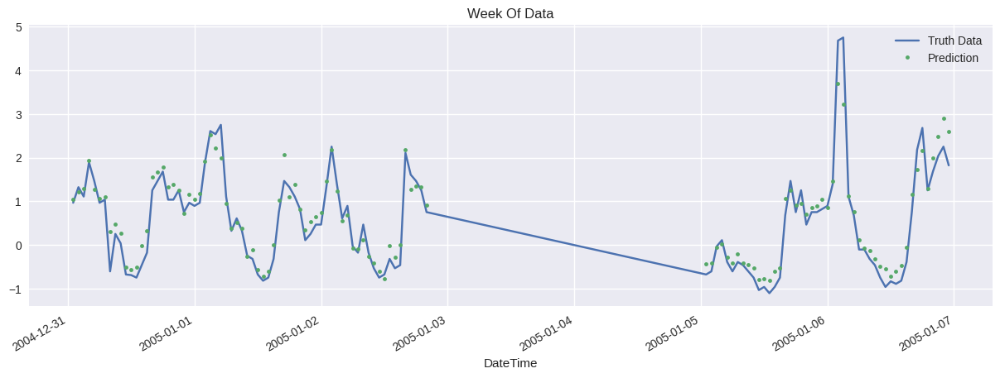

In [ ]:
ax = df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-01-07')][TARGET] \
    .plot(figsize=(15, 5), title='Week Of Data')
df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-01-07')][PREDICTION] \
    .plot(style='.')
plt.legend(['Truth Data','Prediction'])
plt.show()

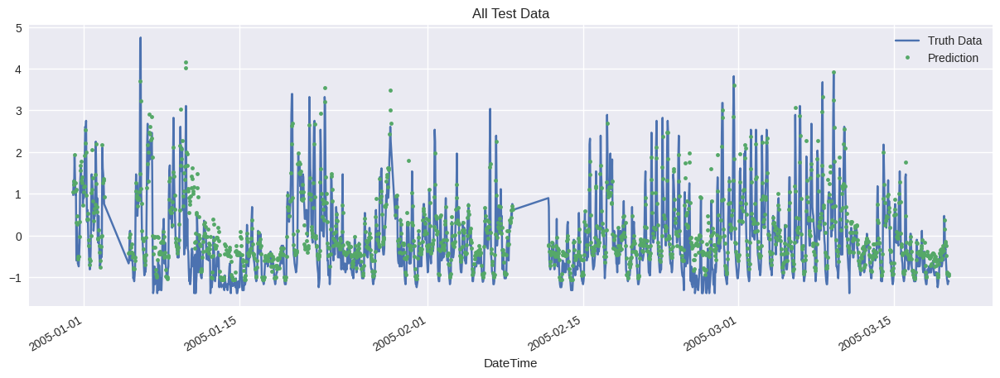

In [ ]:
ax = df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-03-20')][TARGET] \
    .plot(figsize=(15, 5), title='All Test Data')
df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-03-20')][PREDICTION] \
    .plot(style='.')
plt.legend(['Truth Data','Prediction'])
plt.show()

When observing the graphs, the predictions show errors but maintain the distribution of the real data, detecting the peaks and valleys of the values.

In [ ]:
mae,rmse,r2 = evaluate_model(test[TARGET], test[PREDICTION])

print(f"Evaluación del modelo con el target: {TARGET}:")
print(f"R2 Score: {r2:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print("\n")

Evaluación del modelo con el target: CO:
R2 Score: 0.8174
Mean Absolute Error (MAE): 0.2906
Root Mean Squared Error (RMSE): 0.4110




Compared to the previous methods, we observe a clear loss of accuracy in the predictions. However, to make a fair comparison, we should use the same Train/Test set. Even so, this allows us to analyze the behavior of this method from a different perspective.

In [ ]:
test['error'] = np.abs(test[TARGET] - test[PREDICTION])
test['date'] = test.index.date
test.groupby(['date'])['error'].mean().sort_values(ascending=False).head(10)

,error
date,
2005-01-10,1.612149
2005-02-26,0.755363
2005-02-11,0.745679
2005-02-24,0.740614
2005-02-25,0.717847
2005-01-07,0.563295
2005-01-11,0.520823
2005-01-14,0.500400
2005-01-28,0.492971



**Conclusions for CO:**

1. After training the proposed models, we obtained results indicating that the models that performed best with our data were tree-based models, among which `LightGBM` achieved the best result.

2. In the predictions vs. actual values plot, most points cluster near the ideal line, suggesting that the LightGBM model makes quite accurate predictions for most cases.

3. The presence of points with significant errors in the upper right area may indicate that the model struggles to predict correctly in higher ranges of the target variable. This is an area for model improvement.

4. When looking for the most important features considered by the model, we found that all models agree that Benzene (`C6H6`) is the most influential feature in predicting Carbon Monoxide (`CO`).

5. The fact that the model performs exceptionally well on training data (very low error and high R²) but shows relatively less effective performance on test data suggests it might be overfitting.

6. The `LightGBM` model better captures the relationships between the variables and this pollutant. The difference observed with the time series model seems to indicate that the CO concentration is not explained by its previous concentrations.





#Analysis of the Pollutant: C6H6.

We will start by analyzing the models with the usual Train/Test split.

In [ ]:
# Seleccion de Variables y Variable Objetivo
FEATURES = ['S1','CO', 'NOx', 'S3', 'NO2', 'S4',
            'S5', 'Temp', 'HR','HA',  'year', 'month',
            'day', 'weekday', 'hour','weekday_sin',
            'weekday_cos', 'hour_sin', 'hour_cos']
TARGET = 'C6H6'

# Subdivision del dataset
X = aire[FEATURES]
y = aire[TARGET]

In [ ]:
# Division los datos en train y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Entrenar los distintos modelos
models = {
    'Regresión Lineal': lr,
    'Ridge': ridge,
    'Lasso': lasso,
    'Random Forest': rf,
    'Gradient Boosting': gb,
    'XGBoost': xgb,
    'LightGBM': lgb
}

# Almacenar resultados en un diccionario
results = {
    'Modelo': [],
    'R²': [],
    'MAE': [],
    'RMSE': []
}

# Entrenamos y evaluamos cada modelo
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Calcular métricas
    mae,rmse,r2 = evaluate_model(y_test, y_pred)

    # Almacenar los resultados
    results['Modelo'].append(model_name)
    results['R²'].append(r2)
    results['MAE'].append(mae)
    results['RMSE'].append(rmse)

# Convertir el diccionario a un DataFrame
df_results = pd.DataFrame(results)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2659
[LightGBM] [Info] Number of data points in the train set: 6900, number of used features: 19
[LightGBM] [Info] Start training from score 0.006640


In [ ]:
df_results = df_results.sort_values(by='RMSE')
df_results

,Modelo,R²,MAE,RMSE
5,XGBoost,0.984796,0.079770,0.120225
6,LightGBM,0.983697,0.081462,0.124494
3,Random Forest,0.977920,0.093791,0.144884
4,Gradient Boosting,0.973718,0.107504,0.158071
0,Regresión Lineal,0.967470,0.117093,0.175858
1,Ridge,0.967467,0.117022,0.175867
2,Lasso,0.953711,0.144987,0.209777


Let’s visualize these results.

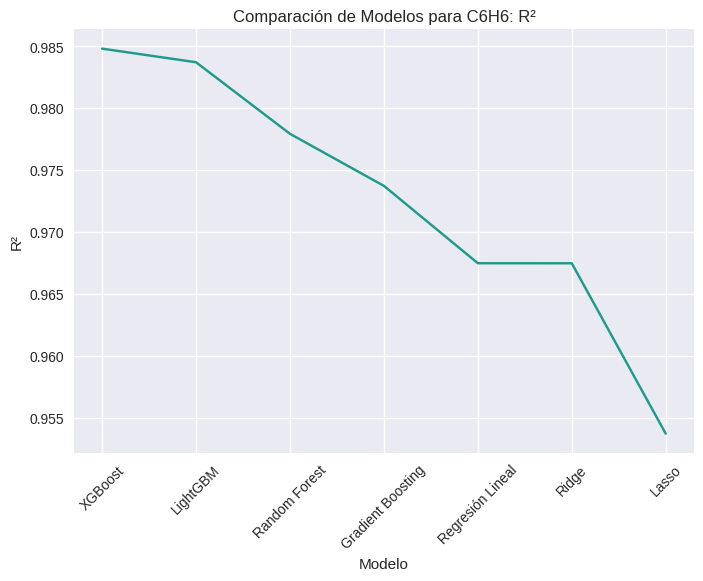

In [ ]:
sns.lineplot(x='Modelo',data=df_results,y='R²',color=color_pal[5])
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xticks(rotation=45)
plt.xlabel('Modelo')
plt.ylabel('R²')
plt.title(f'Comparación de Modelos para {TARGET}: R²')
plt.show()

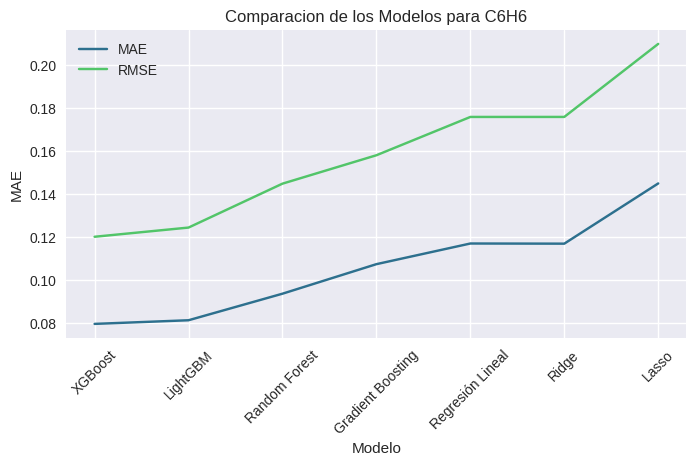

In [ ]:
fig,ax= plt.subplots(figsize=(8, 4))

ax1=sns.lineplot(x='Modelo',data=df_results,y='MAE',color=color_pal[3],label='MAE')
ax2=sns.lineplot(x='Modelo',data=df_results,y='RMSE',color=color_pal[7],label='RMSE')

plt.title(f'Comparacion de los Modelos para {TARGET}')
plt.xticks(rotation=45)
plt.gca().spines[['top', 'right']].set_visible(False)
plt.show()

##Optimization of the Best Models

Let's perform hyperparameter tuning for the following models. We select LightGBM, XGBoost, and Random Forest, using RMSE as the metric. For this pollutant, the XGBoost model initially showed the best performance.

###XGBoost

In [ ]:
xgb = XGBRegressor(random_state=42)
parametros = {
    'n_estimators': [100,200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],

}

grid_search = GridSearchCV(estimator=xgb, param_grid=parametros, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Mejores Parámetros:", best_params)
print("Mejor Precisión:", best_score)

Mejores Parámetros: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}
Mejor Precisión: 0.9794559951348749


(Note: 1 minutes of execution)

In [ ]:
#Entrenamos el modelo
modelo = XGBRegressor(learning_rate=0.1, max_depth=5, n_estimators=200, subsample=0.8)

modelo.fit(X_train, y_train)
y_pred_xgb = modelo.predict(X_test)

#Evaluamos
mae,rmse,r2 = evaluate_model(y_test,y_pred_xgb)
print(f'Las metricas para esta optimizacion son:\nR2 = {r2} \nMAE = {mae} \nRMSE = {rmse}')

# Agregamos estos resultados
results = ['XGBoost_Hiper', r2,mae,rmse]
df_results.loc[len(df_results)] = results

Las metricas para esta optimizacion son:
R2 = 0.9876459220665159 
MAE = 0.0747133862468074 
RMSE = 0.10837398848236782


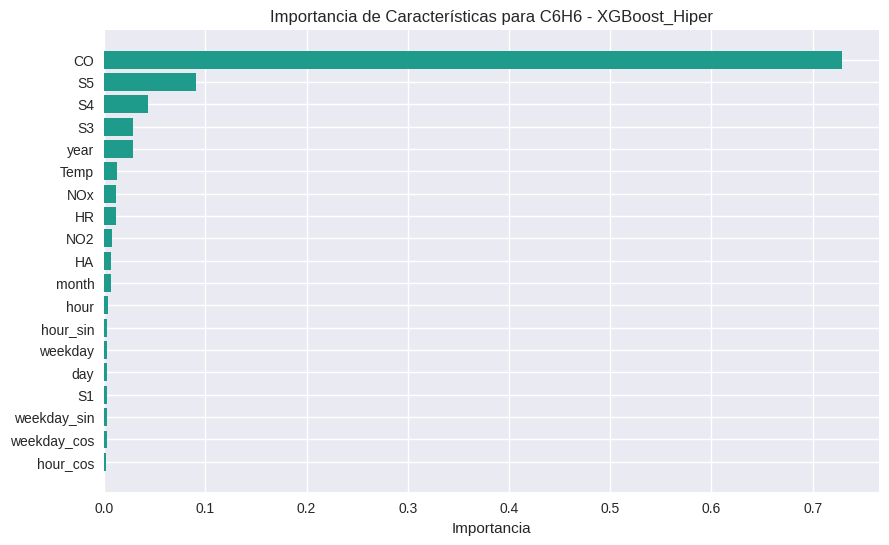

In [ ]:
# Obtener la importancia de las características
importancias = modelo.feature_importances_

# Crear un DataFrame para las importancias
df_importancias = pd.DataFrame({
    'Característica': FEATURES,
    'Importancia': importancias
})

# Ordenar el DataFrame por importancia
df_importancias = df_importancias.sort_values(by='Importancia', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
plt.barh(df_importancias['Característica'], df_importancias['Importancia'], color=color_pal[5])
plt.xlabel('Importancia')
plt.title(f'Importancia de Características para {TARGET} - XGBoost_Hiper')
plt.gca().invert_yaxis()  # Invertir el eje Y para que la característica más importante quede arriba
plt.show()

### LightGBM

In [ ]:
lgb = LGBMRegressor(random_state=42)
parametros =  {
    'num_leaves': [31, 63],
    'max_depth': [-1, 3, 5], #el -1 es para establecer que no hay limite en la profundidad
    'learning_rate': [0.01, 0.1],
    'n_estimators': [100, 200],
    'subsample': [0.5, 0.8]
}
grid_search = GridSearchCV(estimator=lgb, param_grid=parametros, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Mejores Parámetros:", best_params)
print("Mejor Precisión:", best_score)

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

(Note: 1.3 minutes of execution)

In [ ]:
#Entrenamos el modelo
modelo = LGBMRegressor(learning_rate=0.1, max_depth=-1, n_estimators=200,
                     subsample=0.5,num_leaves=31,random_state=42)

modelo.fit(X_train, y_train)
y_pred_lgb = modelo.predict(X_test)

#Evaluamos
mae,rmse,r2 = evaluate_model(y_test,y_pred_lgb)
print(f'Las metricas para esta optimizacion son:\nR2 = {r2} \nMAE = {mae} \nRMSE = {rmse}')

# Agregamos estos resultados
results = ['LightGBM_Hiper', r2, mae, rmse]
df_results.loc[len(df_results)] = results

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2659
[LightGBM] [Info] Number of data points in the train set: 6900, number of used features: 19
[LightGBM] [Info] Start training from score 0.006640
Las metricas para esta optimizacion son:
R2 = 0.9869239294392134 
MAE = 0.07290612859520008 
RMSE = 0.1114958021464432


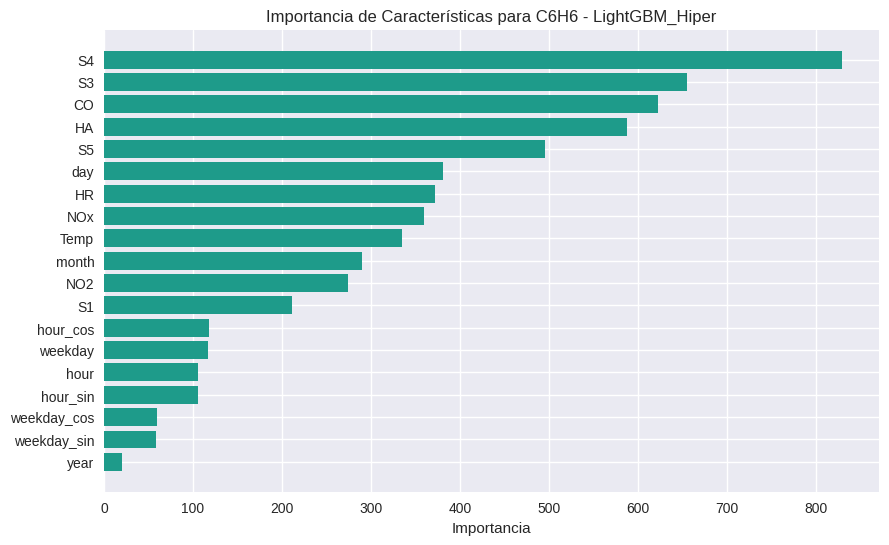

In [ ]:
# Obtener la importancia de las características
importancias = modelo.feature_importances_

# Crear un DataFrame para las importancias
df_importancias = pd.DataFrame({
    'Característica': FEATURES,
    'Importancia': importancias
})

# Ordenar el DataFrame por importancia
df_importancias = df_importancias.sort_values(by='Importancia', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
plt.barh(df_importancias['Característica'], df_importancias['Importancia'], color=color_pal[5])
plt.xlabel('Importancia')
plt.title(f'Importancia de Características para {TARGET} - LightGBM_Hiper')
plt.gca().invert_yaxis()  # Invertir el eje Y para que la característica más importante quede arriba
plt.show()

###Modelo Random Forest


In [ ]:
rf = RandomForestRegressor(random_state=42)
parametros =  {

    'n_estimators': [100, 200],
    'max_depth': [ 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],


}
grid_search = GridSearchCV(estimator=rf, param_grid=parametros, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("Mejores Parámetros:", best_params)
print("Mejor Precisión:", best_score)

Mejores Parámetros: {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Mejor Precisión: 0.9692742027022238


(Note: 12 minutes of execution)

In [ ]:
#Entrenamos el modelo
modelo = RandomForestRegressor(max_depth=20,min_samples_leaf=1,min_samples_split=2,n_estimators=200,random_state=42)

modelo.fit(X_train, y_train)
y_pred_rf = modelo.predict(X_test)

#Evaluamos
mae,rmse,r2= evaluate_model(y_test,y_pred_rf)
print(f'Las metricas para esta optimizacion son:\nR2 = {r2} \nMAE = {mae} \nRMSE = {rmse}')

# Agregamos estos resultados
results = ['RandomForest_Hiper', r2, mae, rmse]
df_results.loc[len(df_results)] = results

Las metricas para esta optimizacion son:
R2 = 0.978933686669513 
MAE = 0.09401980745412364 
RMSE = 0.14151880684014684


(Note: 23 seconds of execution)

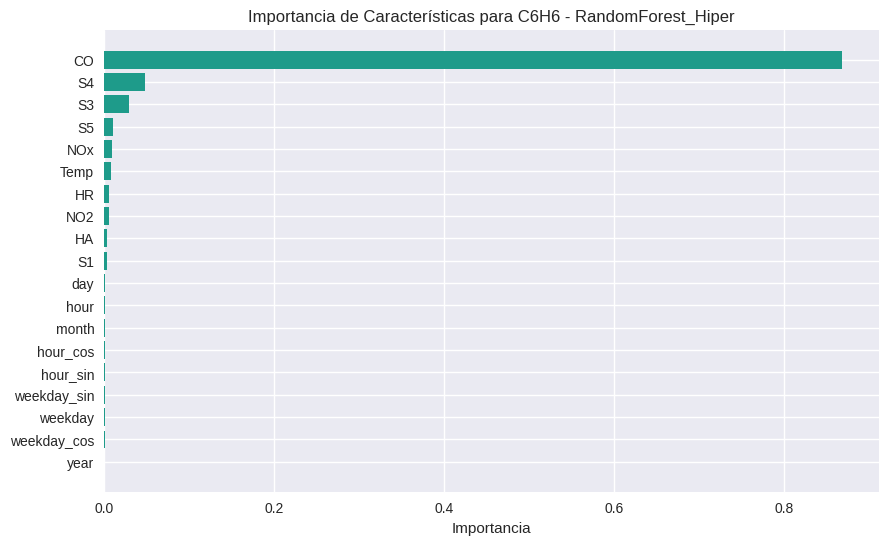

In [ ]:
# Obtener la importancia de las características
importancias = modelo.feature_importances_

# Crear un DataFrame para las importancias
df_importancias = pd.DataFrame({
    'Característica': FEATURES,
    'Importancia': importancias
})

# Ordenar el DataFrame por importancia
df_importancias = df_importancias.sort_values(by='Importancia', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
plt.barh(df_importancias['Característica'], df_importancias['Importancia'], color=color_pal[5])
plt.xlabel('Importancia')
plt.title(f'Importancia de Características para {TARGET} - RandomForest_Hiper')
plt.gca().invert_yaxis()  # Invertir el eje Y para que la característica más importante quede arriba
plt.show()

Let’s compare these improvements with the previous results.

In [ ]:
df_results = df_results.sort_values(by='RMSE')
df_results

,Modelo,R²,MAE,RMSE
7,XGBoost_Hiper,0.987646,0.074713,0.108374
8,LightGBM_Hiper,0.986924,0.072906,0.111496
5,XGBoost,0.984796,0.079770,0.120225
6,LightGBM,0.983697,0.081462,0.124494
9,RandomForest_Hiper,0.978934,0.094020,0.141519
3,Random Forest,0.977920,0.093791,0.144884
4,Gradient Boosting,0.973718,0.107504,0.158071
0,Regresión Lineal,0.967470,0.117093,0.175858
1,Ridge,0.967467,0.117022,0.175867
2,Lasso,0.953711,0.144987,0.209777


Therefore, throughout this analysis, the best model obtained is:

`XGBoost_Hyper(learning_rate=0.1, max_depth=5, n_estimators=200, subsample=0.8, random_state=42)`

We can see how the predictions for this model and the other two are visualized and behave.

###Predictions

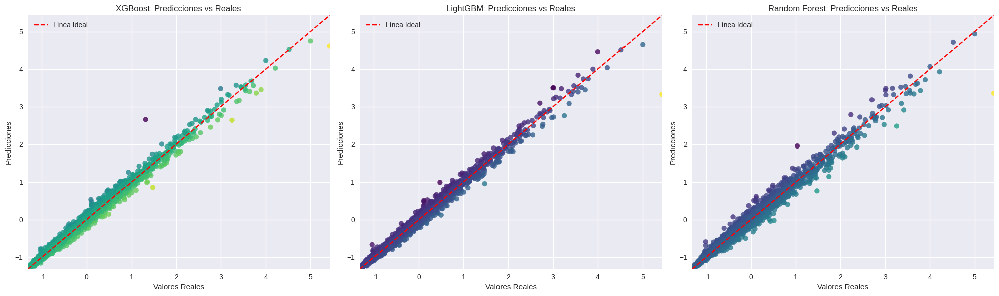

In [ ]:
# Graficar las predicciones y_test valores reales
plt.figure(figsize=(20, 6))

# Gráfico para XGBoost
plt.subplot(1, 3, 1)

errors = y_test - y_pred_xgb # Calcular el error
norm = plt.Normalize(errors.min(), errors.max()) # Crear un mapa de colores basado en el error
colors = plt.cm.viridis(norm(errors))

scatter = plt.scatter(y_test, y_pred_xgb, color=colors, alpha=0.8)

#cbar = plt.colorbar(scatter)# Añadir una barra de color
#cbar.set_label('Error (Valores Reales - Predicciones)', fontsize=12)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Línea Ideal')  # Línea de referencia
plt.title('XGBoost: Predicciones vs Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)

# Gráfico para LightGBM
plt.subplot(1, 3, 2)

errors = y_test - y_pred_lgb # Calcular el error
norm = plt.Normalize(errors.min(), errors.max()) # Crear un mapa de colores basado en el error
colors = plt.cm.viridis(norm(errors))

scatter = plt.scatter(y_test, y_pred_lgb, color=colors, alpha=0.8)

#cbar = plt.colorbar(scatter)# Añadir una barra de color
#cbar.set_label('Error (Valores Reales - Predicciones)', fontsize=12)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Línea Ideal')  # Línea de referencia
plt.title('LightGBM: Predicciones vs Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)

# Gráfico para Random Forest
plt.subplot(1, 3, 3)

errors = y_test - y_pred_rf # Calcular el error
norm = plt.Normalize(errors.min(), errors.max()) # Crear un mapa de colores basado en el error
colors = plt.cm.viridis(norm(errors))

scatter = plt.scatter(y_test, y_pred_rf, color=colors, alpha=0.8)

#cbar = plt.colorbar(scatter)# Añadir una barra de color
#cbar.set_label('Error (Valores Reales - Predicciones)', fontsize=12)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Línea Ideal')  # Línea de referencia
plt.title('Random Forest: Predicciones vs Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##Time Series Analysis Appendix

In [ ]:
X_train = train[FEATURES]
y_train = train[TARGET]

X_test = test[FEATURES]
y_test = test[TARGET]

In [ ]:
reg = XGBRegressor(base_score=0.5, booster='gbtree',
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

[0]	validation_0-rmse:1.09267	validation_1-rmse:1.16603
[100]	validation_0-rmse:0.48668	validation_1-rmse:0.56192
[200]	validation_0-rmse:0.27590	validation_1-rmse:0.35807
[300]	validation_0-rmse:0.20513	validation_1-rmse:0.28958
[400]	validation_0-rmse:0.17898	validation_1-rmse:0.28619
[425]	validation_0-rmse:0.17482	validation_1-rmse:0.29627


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, objective='reg:linear', ...)

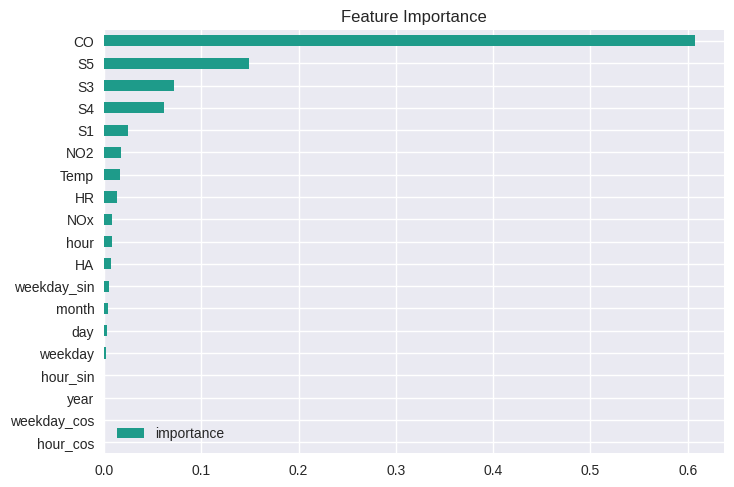

In [ ]:
fi = pd.DataFrame(data=reg.feature_importances_,
             index=reg.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance',color=color_pal[5])
plt.show()

Just like with the previous pollutant, we see that the variable with the greatest importance for predicting this pollutant matches the previous methods for `C6H6`.

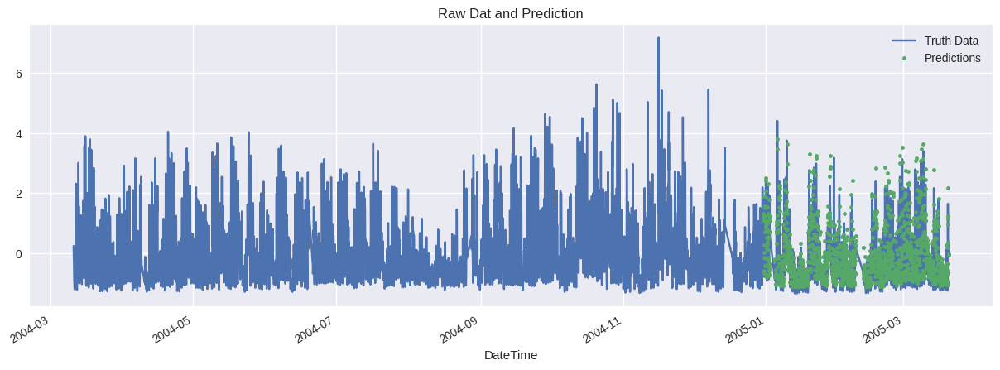

In [ ]:
PREDICTION = 'Prediction_C6H6'
test[PREDICTION] = reg.predict(X_test)
df_model = df_model.merge(test[[PREDICTION]], how='left', left_index=True, right_index=True)
ax = df_model[[TARGET]].plot(figsize=(15, 5))
df_model[PREDICTION].plot(ax=ax, style='.')
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Raw Dat and Prediction')
plt.show()

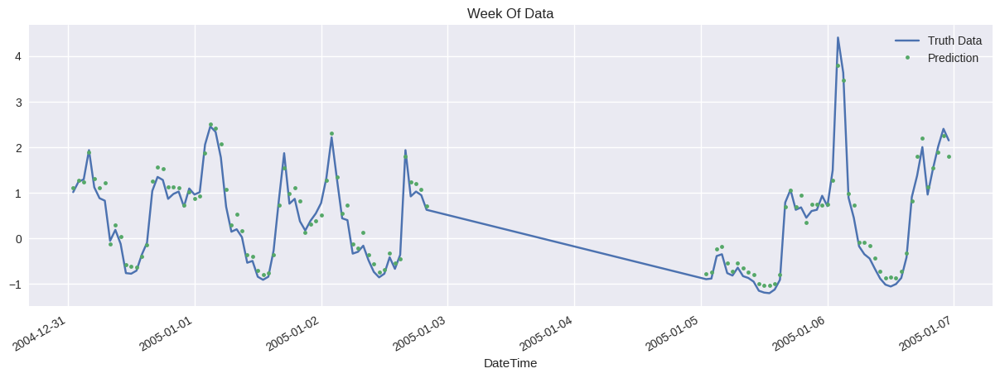

In [ ]:
ax = df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-01-07')][TARGET] \
    .plot(figsize=(15, 5), title='Week Of Data')
df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-01-07')][PREDICTION] \
    .plot(style='.')
plt.legend(['Truth Data','Prediction'])
plt.show()

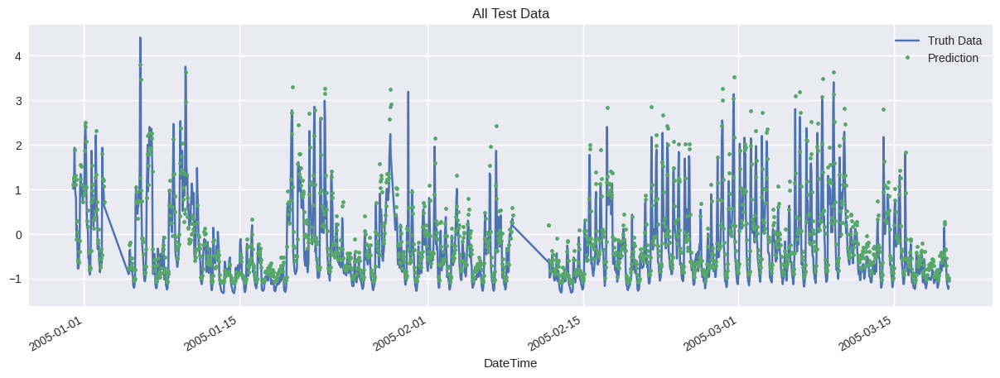

In [ ]:
ax = df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-03-20')][TARGET] \
    .plot(figsize=(15, 5), title='All Test Data')
df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-03-20')][PREDICTION] \
    .plot(style='.')
plt.legend(['Truth Data','Prediction'])
plt.show()

In this case, the distribution of the real data is also maintained, detecting the peaks and valleys of values, but with some errors.

In [ ]:
mae,rmse,r2 = evaluate_model(test[TARGET], test[PREDICTION])

print(f"Evaluación del modelo con el target: {TARGET}:")
print(f"R2 Score: {r2:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print("\n")

Evaluación del modelo con el target: C6H6:
R2 Score: 0.9023
Mean Absolute Error (MAE): 0.2213
Root Mean Squared Error (RMSE): 0.2795




Recalling the previous analysis for the pollutant 'CO', which achieved:
CO.

In [ ]:
# Crear una tabla para una mejor visualización de los resultados
table = PrettyTable()
table.field_names = ["Contaminante", "R2", "MAE", "RMSE"]

# Agregar filas a la tabla
table.add_row(["CO",0.8174,0.2906,0.4110])
table.add_row(["C6H6",0.9023,0.2213,0.2795])

print(table)

+--------------+--------+--------+--------+
| Contaminante |   R2   |  MAE   |  RMSE  |
+--------------+--------+--------+--------+
|      CO      | 0.8174 | 0.2906 | 0.411  |
|     C6H6     | 0.9023 | 0.2213 | 0.2795 |
+--------------+--------+--------+--------+


We can observe a significant improvement of the method for predicting this pollutant, 'C6H6'.

However, we still have a loss of accuracy in the predictions when compared to the other methods and analyses.

In [ ]:
test['error'] = np.abs(test[TARGET] - test[PREDICTION])
test['date'] = test.index.date
test.groupby(['date'])['error'].mean().sort_values(ascending=False).head(10)

,error
date,
2005-02-11,0.571672
2005-01-10,0.528494
2005-01-28,0.445253
2005-03-07,0.393442
2005-01-20,0.362745
2005-01-27,0.360435
2005-01-21,0.360143
2005-02-16,0.350074
2005-03-09,0.348979


##Conclusions for C6H6 (XGBoost)

1. The consistency between the performance metrics on the training set and the test set suggests that the XGBoost model has been well trained.

2. There does not appear to be significant overfitting, as there is no large difference between the training and test metrics.

3. The obtained metrics are relatively good, since both MAE and RMSE are low, and R² is high. This indicates an effective model for predicting C6H6.

4. In all the implemented models, including the time series model, there is a clear influence of C6H6 concentration on this pollutant.

5. Environmental variables have very little influence on benzene concentration. Although each model captures the relationships between pollutants slightly differently, they all agree that benzene is the most influential.



#Pollutant Analysis: NO2.

We will begin by analyzing the models using the usual Train/Test split.

In [ ]:
# Seleccion de Variables y Variable Objetivo
FEATURES = ['S1','CO', 'NOx', 'S3','C6H6' , 'S4',
            'S5', 'Temp', 'HR','HA',  'year', 'month',
            'day', 'weekday', 'hour','weekday_sin',
            'weekday_cos', 'hour_sin', 'hour_cos']
TARGET = 'NO2'

# Subdivision del dataset
X = aire[FEATURES]
y = aire[TARGET]

In [ ]:
# Division los datos en train y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Entrenar los distintos modelos
models = {
    'Regresión Lineal': lr,
    'Ridge': ridge,
    'Lasso': lasso,
    'Random Forest': rf,
    'Gradient Boosting': gb,
    'XGBoost': xgb,
    'LightGBM': lgb
}

# Almacenar resultados en un diccionario
results = {
    'Modelo': [],
    'R²': [],
    'MAE': [],
    'RMSE': []
}

# Entrenamos y evaluamos cada modelo
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Calcular métricas
    mae,rmse,r2 = evaluate_model(y_test, y_pred)

    # Almacenar los resultados
    results['Modelo'].append(model_name)
    results['R²'].append(r2)
    results['MAE'].append(mae)
    results['RMSE'].append(rmse)

# Convertir el diccionario a un DataFrame
df_results = pd.DataFrame(results)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2659
[LightGBM] [Info] Number of data points in the train set: 6900, number of used features: 19
[LightGBM] [Info] Start training from score 0.003657


In [ ]:
df_results = df_results.sort_values(by='RMSE')
df_results

,Modelo,R²,MAE,RMSE
6,LightGBM,0.938716,0.166631,0.239627
5,XGBoost,0.935581,0.168888,0.245680
3,Random Forest,0.929829,0.174969,0.256413
4,Gradient Boosting,0.905664,0.211376,0.297305
0,Regresión Lineal,0.799205,0.320400,0.433750
1,Ridge,0.799189,0.320411,0.433767
2,Lasso,0.790968,0.326194,0.442557


Let’s visualize these results.

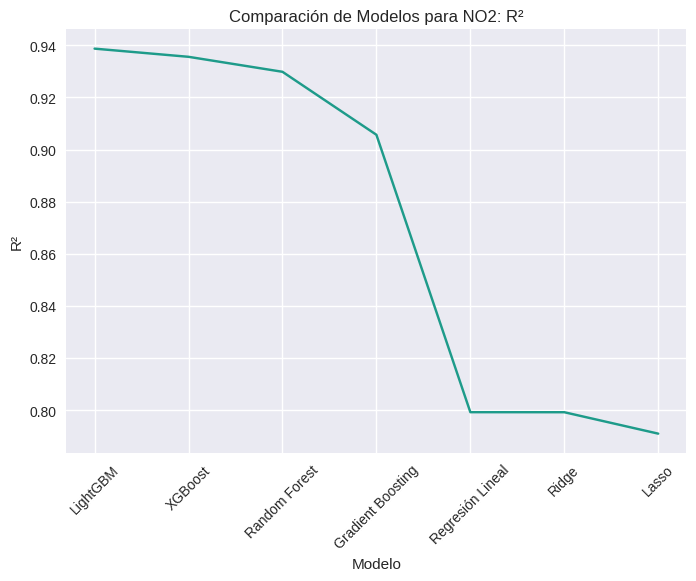

In [ ]:
sns.lineplot(x='Modelo',data=df_results,y='R²',color=color_pal[5])
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xticks(rotation=45)
plt.xlabel('Modelo')
plt.ylabel('R²')
plt.title(f'Comparación de Modelos para {TARGET}: R²')
plt.show()

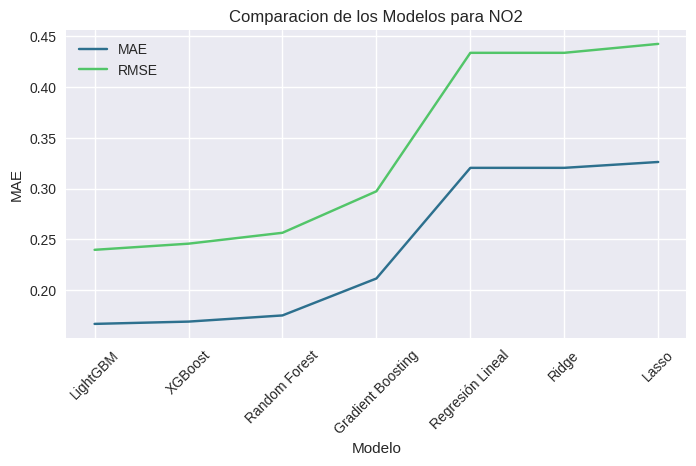

In [ ]:
fig,ax= plt.subplots(figsize=(8, 4))

ax1=sns.lineplot(x='Modelo',data=df_results,y='MAE',color=color_pal[3],label='MAE')
ax2=sns.lineplot(x='Modelo',data=df_results,y='RMSE',color=color_pal[7],label='RMSE')

plt.title(f'Comparacion de los Modelos para {TARGET}')
plt.xticks(rotation=45)
plt.gca().spines[['top', 'right']].set_visible(False)
plt.show()

##Optimization of the Best Models:

Let’s perform hyperparameter tuning for the following models. We select `LightGBM`, `XGBoost`, and `Random Forest`, using RMSE as the metric. For this pollutant, the XGBoost model initially showed the best performance.

###XGBoost

In [ ]:
xgb = XGBRegressor(random_state=42)
parametros = {
    'n_estimators': [100,200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],

}

grid_search = GridSearchCV(estimator=xgb, param_grid=parametros, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Mejores Parámetros:", best_params)
print("Mejor Precisión:", best_score)

Mejores Parámetros: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}
Mejor Precisión: 0.948420066260525


(Note: 1 minute of execution)

In [ ]:
#Entrenamos el modelo
modelo = XGBRegressor(learning_rate=0.1, max_depth=5, n_estimators=200, subsample=0.8)

modelo.fit(X_train, y_train)
y_pred_xgb = modelo.predict(X_test)

#Evaluamos
mae,rmse,r2 = evaluate_model(y_test,y_pred_xgb)
print(f'Las metricas para esta optimizacion son:\nR2 = {r2} \nMAE = {mae} \nRMSE = {rmse}')

# Agregamos estos resultados
results = ['XGBoost_Hiper', r2,mae,rmse]
df_results.loc[len(df_results)] = results

Las metricas para esta optimizacion son:
R2 = 0.9422630607753819 
MAE = 0.16183036050492608 
RMSE = 0.23258927459989587


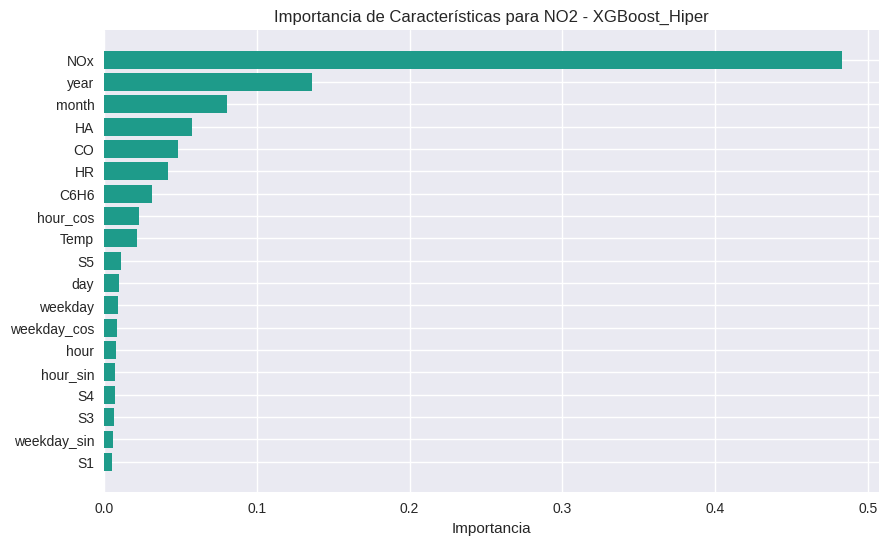

In [ ]:
# Obtener la importancia de las características
importancias = modelo.feature_importances_

# Crear un DataFrame para las importancias
df_importancias = pd.DataFrame({
    'Característica': FEATURES,
    'Importancia': importancias
})

# Ordenar el DataFrame por importancia
df_importancias = df_importancias.sort_values(by='Importancia', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
plt.barh(df_importancias['Característica'], df_importancias['Importancia'], color=color_pal[5])
plt.xlabel('Importancia')
plt.title(f'Importancia de Características para {TARGET} - XGBoost_Hiper')
plt.gca().invert_yaxis()  # Invertir el eje Y para que la característica más importante quede arriba
plt.show()

### LightGBM

In [ ]:
lgb = LGBMRegressor(random_state=42)
parametros =  {
    'num_leaves': [31, 63],
    'max_depth': [-1, 3, 5], #el -1 es para establecer que no hay limite en la profundidad
    'learning_rate': [0.01, 0.1],
    'n_estimators': [100, 200],
    'subsample': [0.5, 0.8]
}
grid_search = GridSearchCV(estimator=lgb, param_grid=parametros, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Mejores Parámetros:", best_params)
print("Mejor Precisión:", best_score)

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2653
[LightGBM] [Info] Number of data points in the train set: 5520, number of used features: 19
[LightGBM] [Info] Start training from score 0.006460
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

(Note: 1.3 minute of execution)

In [ ]:
#Entrenamos el modelo
modelo = LGBMRegressor(learning_rate=0.1, max_depth=-1, n_estimators=200,
                     subsample=0.5,num_leaves=31,random_state=42)

modelo.fit(X_train, y_train)
y_pred_lgb = modelo.predict(X_test)

#Evaluamos
mae,rmse,r2 = evaluate_model(y_test,y_pred_lgb)
print(f'Las metricas para esta optimizacion son:\nR2 = {r2} \nMAE = {mae} \nRMSE = {rmse}')

# Agregamos estos resultados
results = ['LightGBM_Hiper', r2, mae, rmse]
df_results.loc[len(df_results)] = results

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2659
[LightGBM] [Info] Number of data points in the train set: 6900, number of used features: 19
[LightGBM] [Info] Start training from score 0.003657
Las metricas para esta optimizacion son:
R2 = 0.9454690488924189 
MAE = 0.15437366603287497 
RMSE = 0.22603950205336984


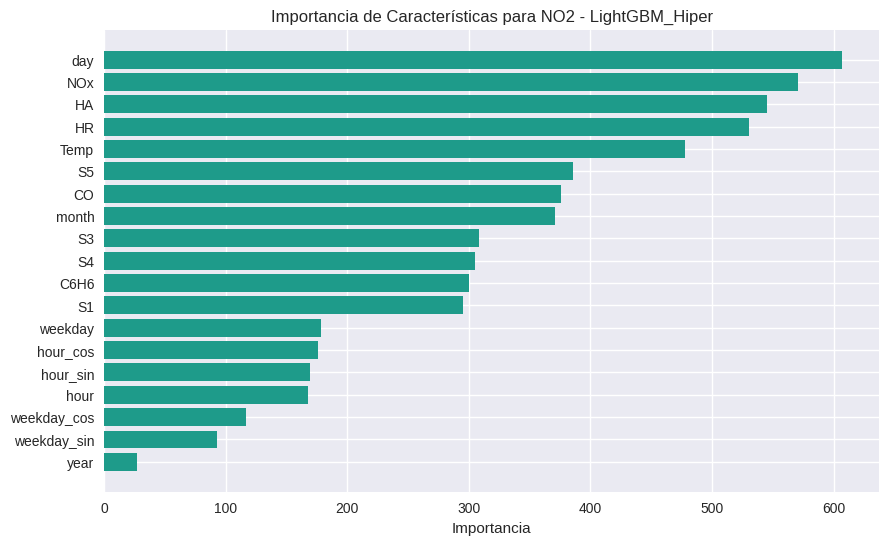

In [ ]:
# Obtener la importancia de las características
importancias = modelo.feature_importances_

# Crear un DataFrame para las importancias
df_importancias = pd.DataFrame({
    'Característica': FEATURES,
    'Importancia': importancias
})

# Ordenar el DataFrame por importancia
df_importancias = df_importancias.sort_values(by='Importancia', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
plt.barh(df_importancias['Característica'], df_importancias['Importancia'], color=color_pal[5])
plt.xlabel('Importancia')
plt.title(f'Importancia de Características para {TARGET} - LightGBM_Hiper')
plt.gca().invert_yaxis()  # Invertir el eje Y para que la característica más importante quede arriba
plt.show()

###Modelo Random Forest


In [ ]:
rf = RandomForestRegressor(random_state=42)
parametros =  {

    'n_estimators': [100, 200],
    'max_depth': [ 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],


}
grid_search = GridSearchCV(estimator=rf, param_grid=parametros, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("Mejores Parámetros:", best_params)
print("Mejor Precisión:", best_score)

Mejores Parámetros: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Mejor Precisión: 0.9322511463165206


(Note: 12 minutes of execution)

In [ ]:
#Entrenamos el modelo
modelo = RandomForestRegressor(max_depth=20,min_samples_leaf=1,min_samples_split=2,n_estimators=200,random_state=42)

modelo.fit(X_train, y_train)
y_pred_rf = modelo.predict(X_test)

#Evaluamos
mae,rmse,r2= evaluate_model(y_test,y_pred_rf)
print(f'Las metricas para esta optimizacion son:\nR2 = {r2} \nMAE = {mae} \nRMSE = {rmse}')

# Agregamos estos resultados
results = ['RandomForest_Hiper', r2, mae, rmse]
df_results.loc[len(df_results)] = results

Las metricas para esta optimizacion son:
R2 = 0.9301552753610529 
MAE = 0.1744556457615231 
RMSE = 0.255817122982725


(Note: 23 seconds of execution)

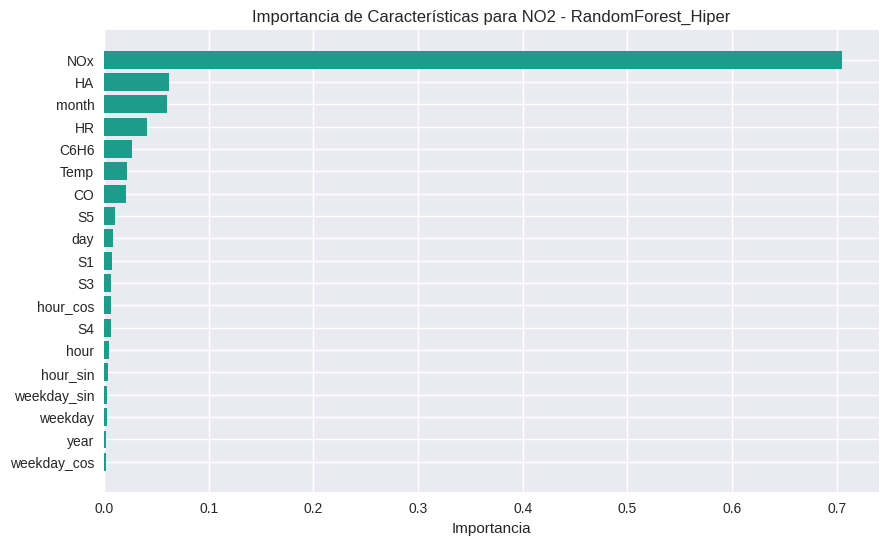

In [ ]:
# Obtener la importancia de las características
importancias = modelo.feature_importances_

# Crear un DataFrame para las importancias
df_importancias = pd.DataFrame({
    'Característica': FEATURES,
    'Importancia': importancias
})

# Ordenar el DataFrame por importancia
df_importancias = df_importancias.sort_values(by='Importancia', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
plt.barh(df_importancias['Característica'], df_importancias['Importancia'], color=color_pal[5])
plt.xlabel('Importancia')
plt.title(f'Importancia de Características para {TARGET} - RandomForest_Hiper')
plt.gca().invert_yaxis()  # Invertir el eje Y para que la característica más importante quede arriba
plt.show()

et’s compare these improvements with what we had before

In [ ]:
df_results = df_results.sort_values(by='RMSE')
df_results

,Modelo,R²,MAE,RMSE
8,LightGBM_Hiper,0.945469,0.154374,0.226040
7,XGBoost_Hiper,0.942263,0.161830,0.232589
6,LightGBM,0.938716,0.166631,0.239627
5,XGBoost,0.935581,0.168888,0.245680
9,RandomForest_Hiper,0.930155,0.174456,0.255817
3,Random Forest,0.929829,0.174969,0.256413
4,Gradient Boosting,0.905664,0.211376,0.297305
0,Regresión Lineal,0.799205,0.320400,0.433750
1,Ridge,0.799189,0.320411,0.433767
2,Lasso,0.790968,0.326194,0.442557


Therefore, throughout this analysis, the best model obtained is:

`XGBoost_Hyper(learning_rate=0.1, max_depth=5, n_estimators=200, subsample=0.8, random_state=42)`

We can see how the predictions for this model and the other two are visualized and behave.

###Predictions

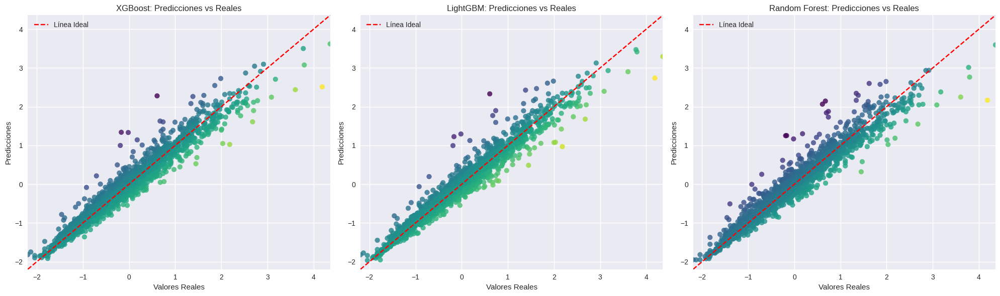

In [ ]:
# Graficar las predicciones y_test valores reales
plt.figure(figsize=(20, 6))

# Gráfico para XGBoost
plt.subplot(1, 3, 1)

errors = y_test - y_pred_xgb # Calcular el error
norm = plt.Normalize(errors.min(), errors.max()) # Crear un mapa de colores basado en el error
colors = plt.cm.viridis(norm(errors))

scatter = plt.scatter(y_test, y_pred_xgb, color=colors, alpha=0.8)

#cbar = plt.colorbar(scatter)# Añadir una barra de color
#cbar.set_label('Error (Valores Reales - Predicciones)', fontsize=12)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Línea Ideal')  # Línea de referencia
plt.title('XGBoost: Predicciones vs Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)

# Gráfico para LightGBM
plt.subplot(1, 3, 2)

errors = y_test - y_pred_lgb # Calcular el error
norm = plt.Normalize(errors.min(), errors.max()) # Crear un mapa de colores basado en el error
colors = plt.cm.viridis(norm(errors))

scatter = plt.scatter(y_test, y_pred_lgb, color=colors, alpha=0.8)

#cbar = plt.colorbar(scatter)# Añadir una barra de color
#cbar.set_label('Error (Valores Reales - Predicciones)', fontsize=12)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Línea Ideal')  # Línea de referencia
plt.title('LightGBM: Predicciones vs Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)

# Gráfico para Random Forest
plt.subplot(1, 3, 3)

errors = y_test - y_pred_rf # Calcular el error
norm = plt.Normalize(errors.min(), errors.max()) # Crear un mapa de colores basado en el error
colors = plt.cm.viridis(norm(errors))

scatter = plt.scatter(y_test, y_pred_rf, color=colors, alpha=0.8)

#cbar = plt.colorbar(scatter)# Añadir una barra de color
#cbar.set_label('Error (Valores Reales - Predicciones)', fontsize=12)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Línea Ideal')  # Línea de referencia
plt.title('Random Forest: Predicciones vs Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##Time Series Analysis Appendix.

In [ ]:
X_train = train[FEATURES]
y_train = train[TARGET]

X_test = test[FEATURES]
y_test = test[TARGET]

In [ ]:
reg = XGBRegressor(base_score=0.5, booster='gbtree',
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

[0]	validation_0-rmse:1.10447	validation_1-rmse:1.13187
[100]	validation_0-rmse:0.56199	validation_1-rmse:0.99490
[200]	validation_0-rmse:0.37844	validation_1-rmse:0.94174
[300]	validation_0-rmse:0.31335	validation_1-rmse:0.91279
[400]	validation_0-rmse:0.28554	validation_1-rmse:0.89153
[500]	validation_0-rmse:0.27205	validation_1-rmse:0.88509
[600]	validation_0-rmse:0.26297	validation_1-rmse:0.87275
[700]	validation_0-rmse:0.25630	validation_1-rmse:0.86196
[800]	validation_0-rmse:0.25146	validation_1-rmse:0.85232
[900]	validation_0-rmse:0.24649	validation_1-rmse:0.84259
[999]	validation_0-rmse:0.24154	validation_1-rmse:0.83304


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, objective='reg:linear', ...)

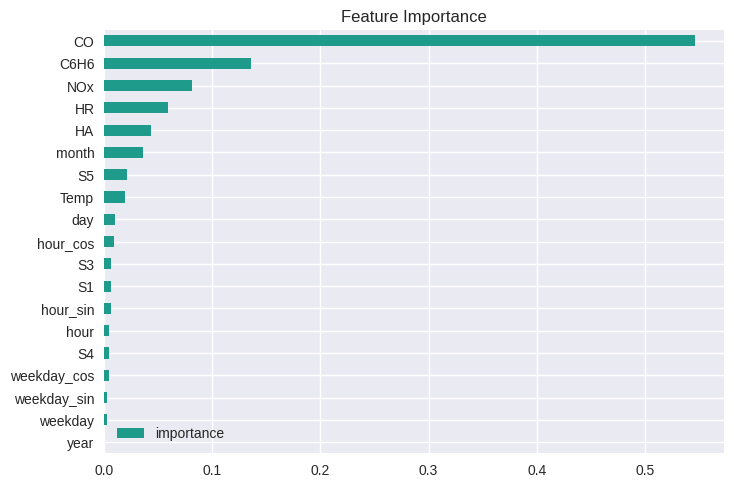

In [ ]:
fi = pd.DataFrame(data=reg.feature_importances_,
             index=reg.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance',color=color_pal[5])
plt.show()

Unlike the two previous pollutants, this is the first pollutant where the variable importance differs depending on whether the problem is framed as a time series or not.

In the previous analysis, we saw that the most influential variable for predicting `'NO2'` was `'NOx'`. However, in this analysis, `'CO'` was identified as an important variable, which is noteworthy.  

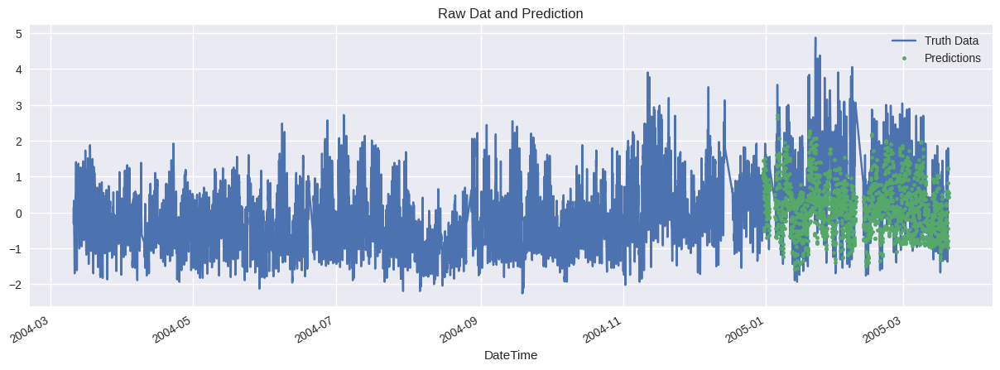

In [ ]:
PREDICTION = 'Prediction_NO2'
test[PREDICTION] = reg.predict(X_test)
df_model = df_model.merge(test[[PREDICTION]], how='left', left_index=True, right_index=True)
ax = df_model[[TARGET]].plot(figsize=(15, 5))
df_model[PREDICTION].plot(ax=ax, style='.')
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Raw Dat and Prediction')
plt.show()

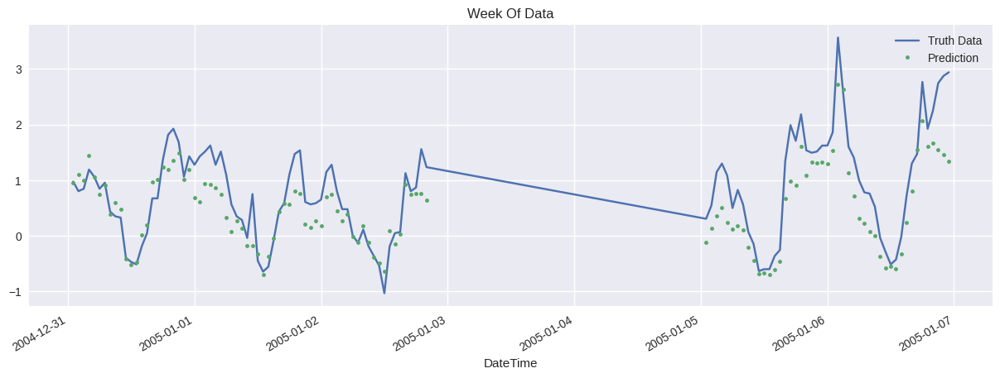

In [ ]:
ax = df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-01-07')][TARGET] \
    .plot(figsize=(15, 5), title='Week Of Data')
df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-01-07')][PREDICTION] \
    .plot(style='.')
plt.legend(['Truth Data','Prediction'])
plt.show()

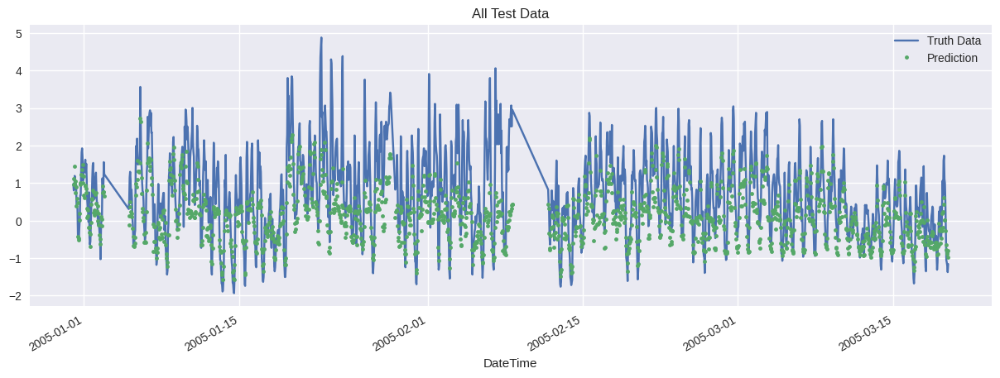

In [ ]:
ax = df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-03-20')][TARGET] \
    .plot(figsize=(15, 5), title='All Test Data')
df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-03-20')][PREDICTION] \
    .plot(style='.')
plt.legend(['Truth Data','Prediction'])
plt.show()

The predictions have more difficulty capturing the maximum peaks of the data but manage to predict the minimum and medium values. Therefore, the performance is much lower compared to the previous pollutants.

In [ ]:
mae,rmse,r2 = evaluate_model(test[TARGET], test[PREDICTION])

print(f"Evaluación del modelo con el target: {TARGET}:")
print(f"R2 Score: {r2:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print("\n")

Evaluación del modelo con el target: NO2:
R2 Score: 0.4431
Mean Absolute Error (MAE): 0.6424
Root Mean Squared Error (RMSE): 0.8330




In [ ]:
# Crear una tabla para una mejor visualización de los resultados
table = PrettyTable()
table.field_names = ["Contaminante", "R2", "MAE", "RMSE"]

# Agregar filas a la tabla
table.add_row(["CO",0.8174,0.2906,0.4110])
table.add_row(["C6H6",0.9023,0.2213,0.2795])
table.add_row(["NO2",0.4431,0.6424,0.8330])

print(table)

+--------------+--------+--------+--------+
| Contaminante |   R2   |  MAE   |  RMSE  |
+--------------+--------+--------+--------+
|      CO      | 0.8174 | 0.2906 | 0.411  |
|     C6H6     | 0.9023 | 0.2213 | 0.2795 |
|     NO2      | 0.4431 | 0.6424 | 0.833  |
+--------------+--------+--------+--------+


Comparatively, there is a significant drop in performance for predicting the target variable `'NO2'`.

In [ ]:
test['error'] = np.abs(test[TARGET] - test[PREDICTION])
test['date'] = test.index.date
test.groupby(['date'])['error'].mean().sort_values(ascending=False).head(10)

,error
date,
2005-02-08,1.867335
2005-02-07,1.613039
2005-01-28,1.464885
2005-01-10,1.389889
2005-02-06,1.309755
2005-01-22,1.251122
2005-01-23,1.248526
2005-02-01,1.161827
2005-02-04,1.091392



## Conclusions for NO2:

1. The R² on the training set (0.9953) is extremely high, indicating that the model explains almost all the variability of the training data. However, the R² on the test set (0.9539), although still high, is significantly lower. This reinforces the idea that the model is not generalizing well.

2. Despite possible overfitting, performance on the test and cross-validation sets remains quite good, with relatively low MAE and RMSE and a high R². This indicates that although the model could improve, it is still capable of making generally accurate predictions.

3. There is a strong interaction of this pollutant with `NOx`, which may correspond to a chemical process between these types of compounds.

4. The time series analysis reinforces the result that the pollutant is not influenced by its past concentration values.

5. The concentration of this pollutant has little influence from environmental variables. The best model obtained shows a weak influence from the environmental variables HA and HR (see XGBoost\_Hyper graph).


#Pollutant Analysis: NOx.

We will begin by analyzing the models using the usual Train/Test split.

In [ ]:
# Seleccion de Variables y Variable Objetivo
FEATURES = ['S1','CO', 'NO2', 'S3','C6H6' , 'S4',
            'S5', 'Temp', 'HR','HA',  'year', 'month',
            'day', 'weekday', 'hour','weekday_sin',
            'weekday_cos', 'hour_sin', 'hour_cos']
TARGET = 'NOx'

# Subdivision del dataset
X = aire[FEATURES]
y = aire[TARGET]

In [ ]:
# Division los datos en train y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Entrenar los distintos modelos
models = {
    'Regresión Lineal': lr,
    'Ridge': ridge,
    'Lasso': lasso,
    'Random Forest': rf,
    'Gradient Boosting': gb,
    'XGBoost': xgb,
    'LightGBM': lgb
}

# Almacenar resultados en un diccionario
results = {
    'Modelo': [],
    'R²': [],
    'MAE': [],
    'RMSE': []
}

# Entrenamos y evaluamos cada modelo
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Calcular métricas
    mae,rmse,r2 = evaluate_model(y_test, y_pred)

    # Almacenar los resultados
    results['Modelo'].append(model_name)
    results['R²'].append(r2)
    results['MAE'].append(mae)
    results['RMSE'].append(rmse)

# Convertir el diccionario a un DataFrame
df_results = pd.DataFrame(results)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001433 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2659
[LightGBM] [Info] Number of data points in the train set: 6900, number of used features: 19
[LightGBM] [Info] Start training from score 0.008577


In [ ]:
df_results = df_results.sort_values(by='RMSE')
df_results

,Modelo,R²,MAE,RMSE
6,LightGBM,0.959090,0.120779,0.189952
5,XGBoost,0.953383,0.121774,0.202770
3,Random Forest,0.952251,0.123394,0.205217
4,Gradient Boosting,0.942870,0.143449,0.224471
0,Regresión Lineal,0.870400,0.245789,0.338090
1,Ridge,0.870367,0.245787,0.338132
2,Lasso,0.864378,0.246390,0.345855


Let’s visualize these results.

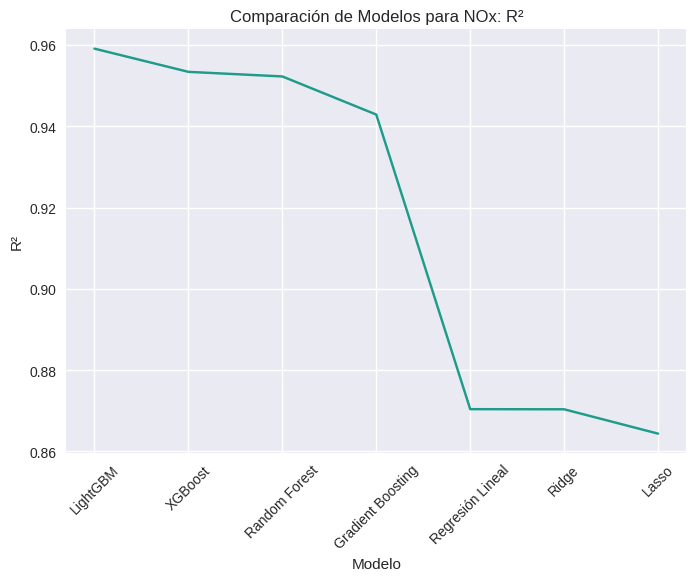

In [ ]:
sns.lineplot(x='Modelo',data=df_results,y='R²',color=color_pal[5])
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xticks(rotation=45)
plt.xlabel('Modelo')
plt.ylabel('R²')
plt.title(f'Comparación de Modelos para {TARGET}: R²')
plt.show()

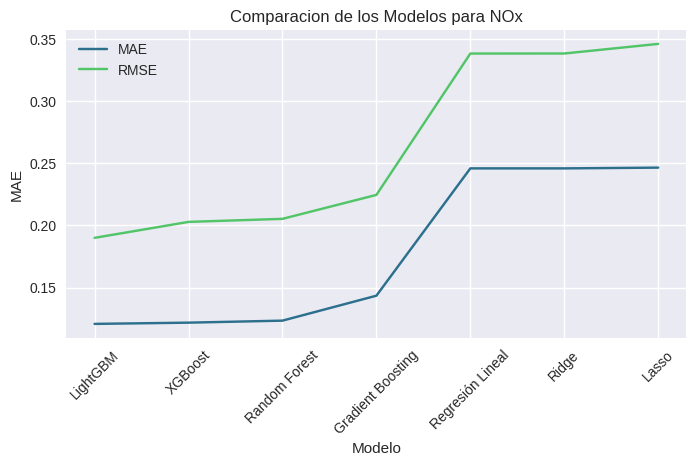

In [ ]:
fig,ax= plt.subplots(figsize=(8, 4))

ax1=sns.lineplot(x='Modelo',data=df_results,y='MAE',color=color_pal[3],label='MAE')
ax2=sns.lineplot(x='Modelo',data=df_results,y='RMSE',color=color_pal[7],label='RMSE')

plt.title(f'Comparacion de los Modelos para {TARGET}')
plt.xticks(rotation=45)
plt.gca().spines[['top', 'right']].set_visible(False)
plt.show()

##Optimization of the Best Models

Let’s perform hyperparameter tuning for the following models. We select LightGBM, XGBoost, and Random Forest, using RMSE as the metric. For this pollutant, the XGBoost model initially showed the best performance.

###XGBoost

In [ ]:
xgb = XGBRegressor(random_state=42)
parametros = {
    'n_estimators': [100,200],
    'learning_rate': [0.01, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],

}

grid_search = GridSearchCV(estimator=xgb, param_grid=parametros, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Mejores Parámetros:", best_params)
print("Mejor Precisión:", best_score)

Mejores Parámetros: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}
Mejor Precisión: 0.9632700079550769


(Note: 1 minute of execution)

In [ ]:
#Entrenamos el modelo
modelo = XGBRegressor(learning_rate=0.1, max_depth=5, n_estimators=200, subsample=0.8)

modelo.fit(X_train, y_train)
y_pred_xgb = modelo.predict(X_test)

#Evaluamos
mae,rmse,r2 = evaluate_model(y_test,y_pred_xgb)
print(f'Las metricas para esta optimizacion son:\nR2 = {r2} \nMAE = {mae} \nRMSE = {rmse}')

# Agregamos estos resultados
results = ['XGBoost_Hiper', r2,mae,rmse]
df_results.loc[len(df_results)] = results

Las metricas para esta optimizacion son:
R2 = 0.9600716039410596 
MAE = 0.11701594627654234 
RMSE = 0.18765936124336324


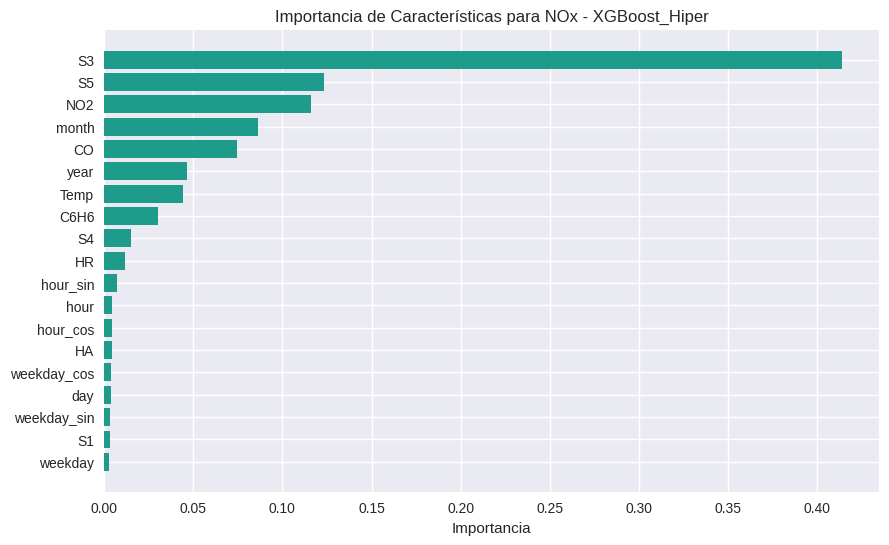

In [ ]:
# Obtener la importancia de las características
importancias = modelo.feature_importances_

# Crear un DataFrame para las importancias
df_importancias = pd.DataFrame({
    'Característica': FEATURES,
    'Importancia': importancias
})

# Ordenar el DataFrame por importancia
df_importancias = df_importancias.sort_values(by='Importancia', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
plt.barh(df_importancias['Característica'], df_importancias['Importancia'], color=color_pal[5])
plt.xlabel('Importancia')
plt.title(f'Importancia de Características para {TARGET} - XGBoost_Hiper')
plt.gca().invert_yaxis()  # Invertir el eje Y para que la característica más importante quede arriba
plt.show()

### LightGBM

In [ ]:
lgb = LGBMRegressor(random_state=42)
parametros =  {
    'num_leaves': [31, 63],
    'max_depth': [-1, 3, 5], #el -1 es para establecer que no hay limite en la profundidad
    'learning_rate': [0.01, 0.1],
    'n_estimators': [100, 200],
    'subsample': [0.5, 0.8]
}
grid_search = GridSearchCV(estimator=lgb, param_grid=parametros, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Mejores Parámetros:", best_params)
print("Mejor Precisión:", best_score)

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

(Note: 1.3 minutes of execution)

In [ ]:
#Entrenamos el modelo
modelo = LGBMRegressor(learning_rate=0.1, max_depth=-1, n_estimators=200,
                     subsample=0.5,num_leaves=31,random_state=42)

modelo.fit(X_train, y_train)
y_pred_lgb = modelo.predict(X_test)

#Evaluamos
mae,rmse,r2 = evaluate_model(y_test,y_pred_lgb)
print(f'Las metricas para esta optimizacion son:\nR2 = {r2} \nMAE = {mae} \nRMSE = {rmse}')

# Agregamos estos resultados
results = ['LightGBM_Hiper', r2, mae, rmse]
df_results.loc[len(df_results)] = results

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001565 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2659
[LightGBM] [Info] Number of data points in the train set: 6900, number of used features: 19
[LightGBM] [Info] Start training from score 0.008577
Las metricas para esta optimizacion son:
R2 = 0.9624078013030117 
MAE = 0.11337045001968966 
RMSE = 0.1820866748292281


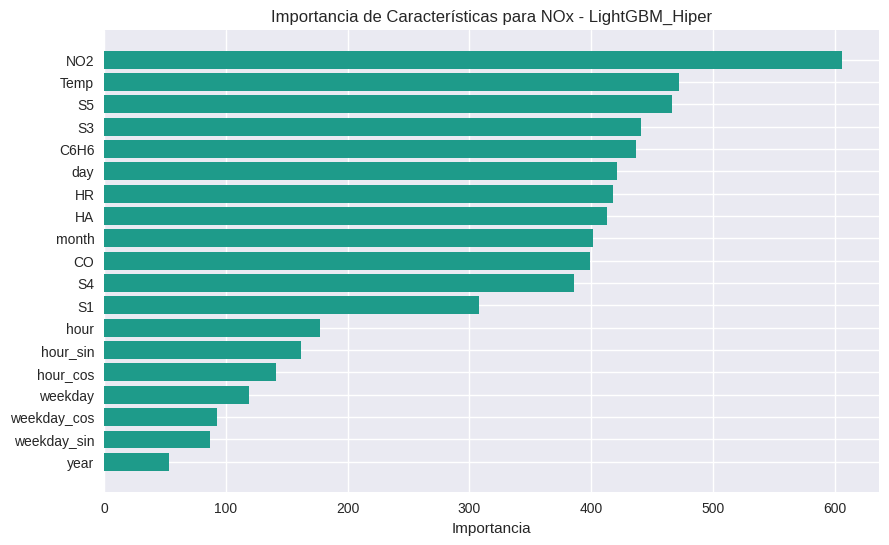

In [ ]:
# Obtener la importancia de las características
importancias = modelo.feature_importances_

# Crear un DataFrame para las importancias
df_importancias = pd.DataFrame({
    'Característica': FEATURES,
    'Importancia': importancias
})

# Ordenar el DataFrame por importancia
df_importancias = df_importancias.sort_values(by='Importancia', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
plt.barh(df_importancias['Característica'], df_importancias['Importancia'], color=color_pal[5])
plt.xlabel('Importancia')
plt.title(f'Importancia de Características para {TARGET} - LightGBM_Hiper')
plt.gca().invert_yaxis()  # Invertir el eje Y para que la característica más importante quede arriba
plt.show()

###Random Forest model.


In [ ]:
rf = RandomForestRegressor(random_state=42)
parametros =  {

    'n_estimators': [100, 200],
    'max_depth': [ 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],


}
grid_search = GridSearchCV(estimator=rf, param_grid=parametros, cv=5, scoring='r2')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("Mejores Parámetros:", best_params)
print("Mejor Precisión:", best_score)

Mejores Parámetros: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Mejor Precisión: 0.9540866267886429


(Note: 13 minutes of execution)

In [ ]:
#Entrenamos el modelo
modelo = RandomForestRegressor(max_depth=20,min_samples_leaf=1,min_samples_split=2,n_estimators=200,random_state=42)

modelo.fit(X_train, y_train)
y_pred_rf = modelo.predict(X_test)

#Evaluamos
mae,rmse,r2= evaluate_model(y_test,y_pred_rf)
print(f'Las metricas para esta optimizacion son:\nR2 = {r2} \nMAE = {mae} \nRMSE = {rmse}')

# Agregamos estos resultados
results = ['RandomForest_Hiper', r2, mae, rmse]
df_results.loc[len(df_results)] = results

Las metricas para esta optimizacion son:
R2 = 0.9524887046532887 
MAE = 0.12263474261200653 
RMSE = 0.20470466361865727


(Note: 19 seconds of execution)

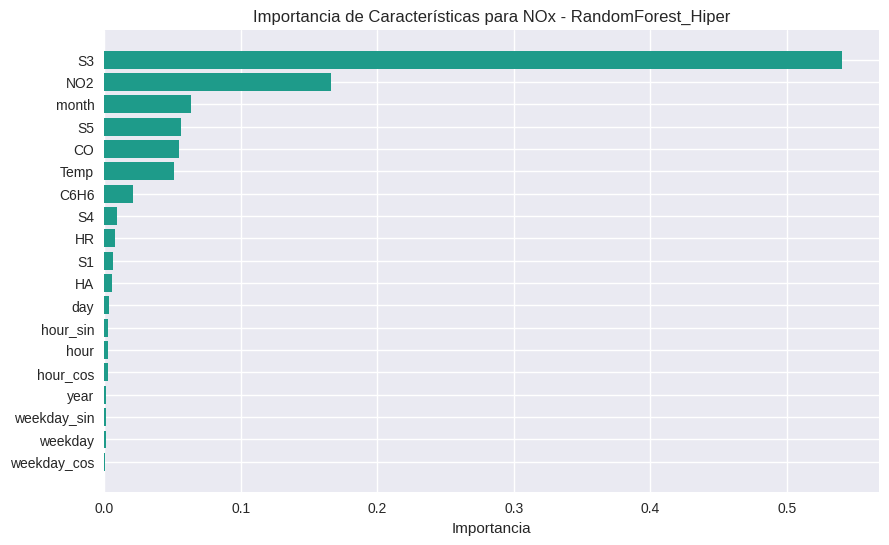

In [ ]:
# Obtener la importancia de las características
importancias = modelo.feature_importances_

# Crear un DataFrame para las importancias
df_importancias = pd.DataFrame({
    'Característica': FEATURES,
    'Importancia': importancias
})

# Ordenar el DataFrame por importancia
df_importancias = df_importancias.sort_values(by='Importancia', ascending=False)

# Graficar
plt.figure(figsize=(10, 6))
plt.barh(df_importancias['Característica'], df_importancias['Importancia'], color=color_pal[5])
plt.xlabel('Importancia')
plt.title(f'Importancia de Características para {TARGET} - RandomForest_Hiper')
plt.gca().invert_yaxis()  # Invertir el eje Y para que la característica más importante quede arriba
plt.show()

Let’s compare these improvements with what we had before.

In [ ]:
df_results = df_results.sort_values(by='RMSE')
df_results

,Modelo,R²,MAE,RMSE
8,LightGBM_Hiper,0.962408,0.113370,0.182087
7,XGBoost_Hiper,0.960072,0.117016,0.187659
6,LightGBM,0.959090,0.120779,0.189952
5,XGBoost,0.953383,0.121774,0.202770
9,RandomForest_Hiper,0.952489,0.122635,0.204705
3,Random Forest,0.951623,0.124225,0.206561
4,Gradient Boosting,0.942987,0.143306,0.224242
0,Regresión Lineal,0.870400,0.245789,0.338090
1,Ridge,0.870367,0.245787,0.338132
2,Lasso,0.864378,0.246390,0.345855


 Therefore, throughout this analysis, the best model obtained is:

`XGBoost_Hyper(learning_rate=0.1, max_depth=5, n_estimators=200, subsample=0.8, random_state=42)`

We can see how the predictions for this model and the other two are visualized and behave.

###Predictions

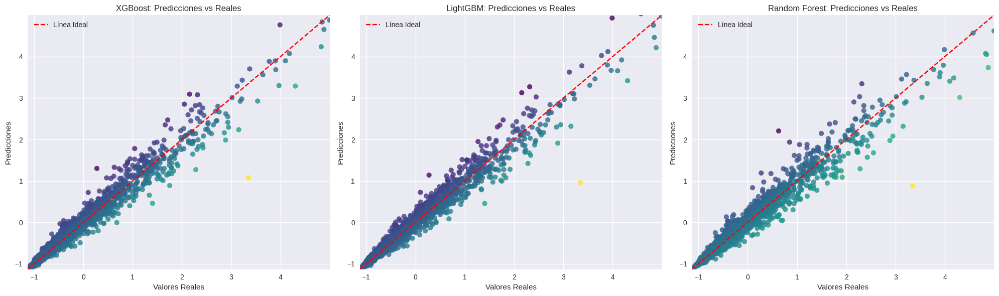

In [ ]:
# Graficar las predicciones y_test valores reales
plt.figure(figsize=(20, 6))

# Gráfico para XGBoost
plt.subplot(1, 3, 1)

errors = y_test - y_pred_xgb # Calcular el error
norm = plt.Normalize(errors.min(), errors.max()) # Crear un mapa de colores basado en el error
colors = plt.cm.viridis(norm(errors))

scatter = plt.scatter(y_test, y_pred_xgb, color=colors, alpha=0.8)

#cbar = plt.colorbar(scatter)# Añadir una barra de color
#cbar.set_label('Error (Valores Reales - Predicciones)', fontsize=12)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Línea Ideal')  # Línea de referencia
plt.title('XGBoost: Predicciones vs Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)

# Gráfico para LightGBM
plt.subplot(1, 3, 2)

errors = y_test - y_pred_lgb # Calcular el error
norm = plt.Normalize(errors.min(), errors.max()) # Crear un mapa de colores basado en el error
colors = plt.cm.viridis(norm(errors))

scatter = plt.scatter(y_test, y_pred_lgb, color=colors, alpha=0.8)

#cbar = plt.colorbar(scatter)# Añadir una barra de color
#cbar.set_label('Error (Valores Reales - Predicciones)', fontsize=12)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Línea Ideal')  # Línea de referencia
plt.title('LightGBM: Predicciones vs Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)

# Gráfico para Random Forest
plt.subplot(1, 3, 3)

errors = y_test - y_pred_rf # Calcular el error
norm = plt.Normalize(errors.min(), errors.max()) # Crear un mapa de colores basado en el error
colors = plt.cm.viridis(norm(errors))

scatter = plt.scatter(y_test, y_pred_rf, color=colors, alpha=0.8)

#cbar = plt.colorbar(scatter)# Añadir una barra de color
#cbar.set_label('Error (Valores Reales - Predicciones)', fontsize=12)

plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', label='Línea Ideal')  # Línea de referencia
plt.title('Random Forest: Predicciones vs Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

##Time Series Analysis Appendix

In [ ]:
X_train = train[FEATURES]
y_train = train[TARGET]

X_test = test[FEATURES]
y_test = test[TARGET]

In [ ]:
reg = XGBRegressor(base_score=0.5, booster='gbtree',
                       n_estimators=1000,
                       early_stopping_rounds=50,
                       objective='reg:linear',
                       max_depth=3,
                       learning_rate=0.01)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        verbose=100)

[0]	validation_0-rmse:1.12360	validation_1-rmse:1.05191
[100]	validation_0-rmse:0.51255	validation_1-rmse:0.94270
[120]	validation_0-rmse:0.44972	validation_1-rmse:0.94803


XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1000, n_jobs=None,
             num_parallel_tree=None, objective='reg:linear', ...)

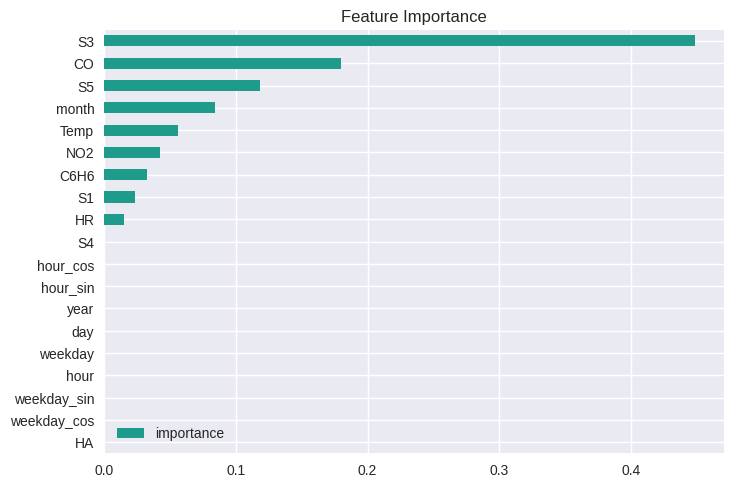

In [ ]:
fi = pd.DataFrame(data=reg.feature_importances_,
             index=reg.feature_names_in_,
             columns=['importance'])
fi.sort_values('importance').plot(kind='barh', title='Feature Importance',color=color_pal[5])
plt.show()

In this case, we have important variables that coincide in both analyses (time series and traditional train/test split) and others that appear only in one or the other.

The variables appearing in both are 'S3' and 'S5', but in the time series analysis the variable 'CO' again stands out, while in the traditional analysis 'NO2' is highlighted.

(Drawing a parallel with the relationships we obtained when the target was NO2)

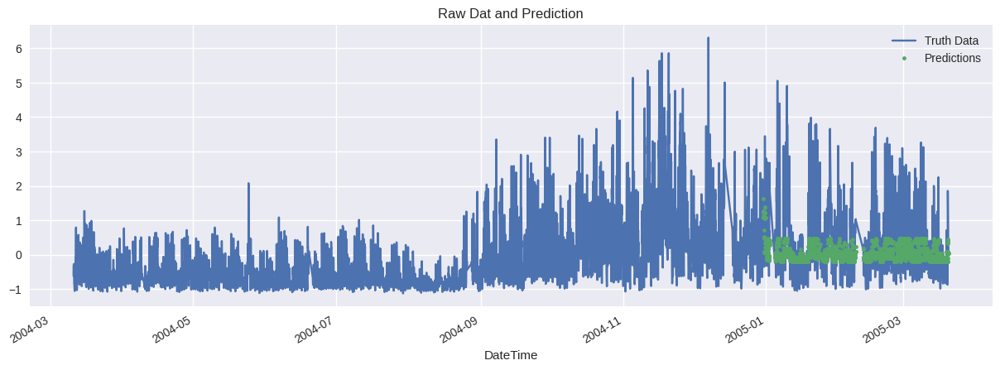

In [ ]:
PREDICTION = 'Prediction_NOx'
test[PREDICTION] = reg.predict(X_test)
df_model = df_model.merge(test[[PREDICTION]], how='left', left_index=True, right_index=True)
ax = df_model[[TARGET]].plot(figsize=(15, 5))
df_model[PREDICTION].plot(ax=ax, style='.')
plt.legend(['Truth Data', 'Predictions'])
ax.set_title('Raw Dat and Prediction')
plt.show()

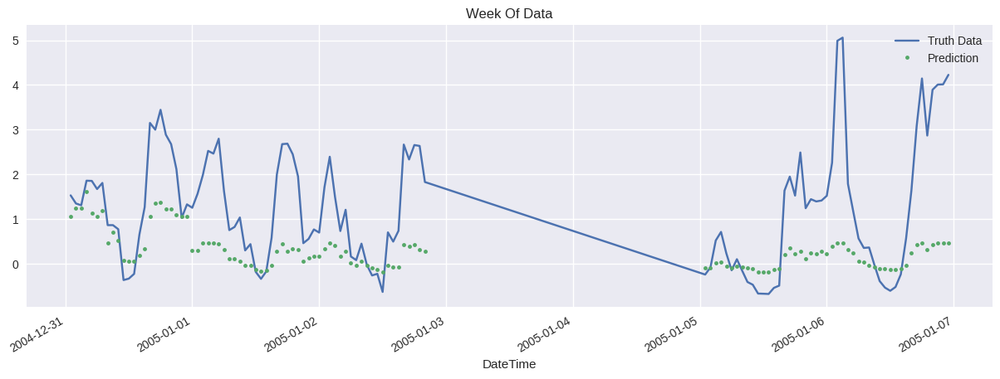

In [ ]:
ax = df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-01-07')][TARGET] \
    .plot(figsize=(15, 5), title='Week Of Data')
df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-01-07')][PREDICTION] \
    .plot(style='.')
plt.legend(['Truth Data','Prediction'])
plt.show()

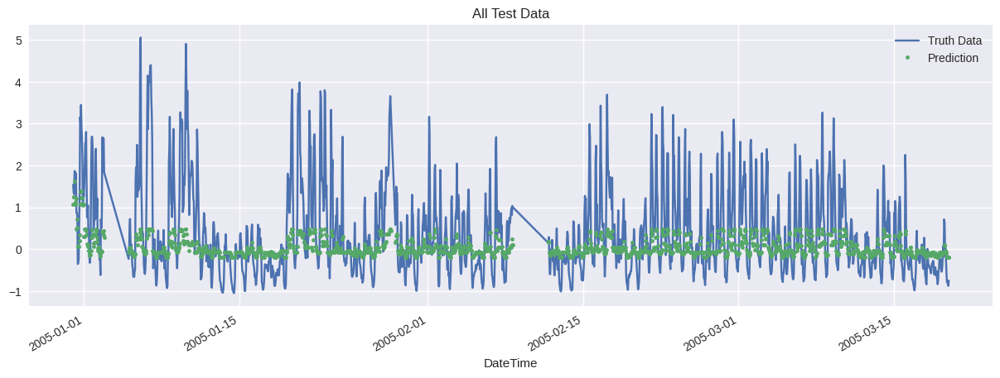

In [ ]:
ax = df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-03-20')][TARGET] \
    .plot(figsize=(15, 5), title='All Test Data')
df_model.loc[(df_model.index > '2004-12-31') & (df_model.index < '2005-03-20')][PREDICTION] \
    .plot(style='.')
plt.legend(['Truth Data','Prediction'])
plt.show()

The predictions for the variable 'NOx' drastically worsened. In this case, we lost any description of the data distribution, with predictions showing no peaks or valleys.

In [ ]:
mae,rmse,r2 = evaluate_model(test[TARGET], test[PREDICTION])

print(f"Evaluación del modelo con el target: {TARGET}:")
print(f"R2 Score: {r2:.4f}")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
print("\n")

Evaluación del modelo con el target: NOx:
R2 Score: 0.2038
Mean Absolute Error (MAE): 0.6411
Root Mean Squared Error (RMSE): 0.9374




In [ ]:
# Crear una tabla para una mejor visualización de los resultados
table = PrettyTable()
table.field_names = ["Contaminante", "R2", "MAE", "RMSE"]

# Agregar filas a la tabla
table.add_row(["CO",0.8174,0.2906,0.4110])
table.add_row(["C6H6",0.9023,0.2213,0.2795])
table.add_row(["NO2",0.4431,0.6424,0.8330])
table.add_row(["NOx",0.2038,0.6411,0.9374])

print(table)

+--------------+--------+--------+--------+
| Contaminante |   R2   |  MAE   |  RMSE  |
+--------------+--------+--------+--------+
|      CO      | 0.8174 | 0.2906 | 0.411  |
|     C6H6     | 0.9023 | 0.2213 | 0.2795 |
|     NO2      | 0.4431 | 0.6424 | 0.833  |
|     NOx      | 0.2038 | 0.6411 | 0.9374 |
+--------------+--------+--------+--------+


Indeed, the worst performance in this analysis was obtained in predicting the variable 'NOx'.

In [ ]:
test['error'] = np.abs(test[TARGET] - test[PREDICTION])
test['date'] = test.index.date
test.groupby(['date'])['error'].mean().sort_values(ascending=False).head(10)

,error
date,
2005-01-10,1.952880
2005-01-06,1.784383
2005-01-28,1.536996
2005-01-22,1.293392
2005-01-20,1.211801
2005-01-09,1.173212
2005-01-01,1.124931
2005-01-19,1.096705
2005-01-21,1.026708




## Conclusions for NOx:

1. The best model obtained with hyperparameter tuning was: XGBoost.

2. The metrics reflect that the model is relatively accurate, with mean errors and root mean squared errors reasonably low, which is positive for the application to NOx prediction.

3. The pollutant (excluding sensors) with the greatest influence on this prediction is NO2. There is also a minor influence of CO, and the temperature variable appears weakly (see XGBoost\_Hyper graph).

4. In this case, the time series analysis fails to capture the relationships for this pollutant.


# General Conclusions for the Machine Learning Models Applied to Each Pollutant:

1. For all the pollutants presented in this work, decision tree–type models obtained the best metrics. These models were consistently better at capturing the relationships in our dataset.

2. The models presented for each pollutant show great potential. There is some tendency to overfitting, which might be remedied by increasing the training data, as only one year of study data is available.

3. Environmental variables showed low impact on the concentrations of the measured pollutants. It is likely that pollutant levels are explained mainly by human activity (traffic, factories, etc.) in the studied city.

4. There are evident relationships between pollutant concentrations; it is suggested to consult a domain expert to determine if these interactions correspond to any known chemical processes.

5. Regarding time series analysis, the best metrics were obtained in the case of Benzene, which corresponds with the feature importance graphs found in the decision tree models, where some relationship with added time variables is observed.


In [ ]:
# Crear una tabla para una mejor visualización de los resultados
table = PrettyTable()
table.field_names = ["Contaminante","Modelo", "R2", "MAE", "RMSE"]

# Agregar filas a la tabla
table.add_row(["CO","LightGBM_Hiper",0.962864,0.119678,0.184711])
table.add_row(["C6H6","XGBoost_Hiper",0.987646,0.074713,0.108374])
table.add_row(["NO2","LightGBM_Hiper",0.945469,0.154374,0.226040])
table.add_row(["NOx","LightGBM_Hiper",0.962408,0.113370,0.182087])

print(table)

+--------------+----------------+----------+----------+----------+
| Contaminante |     Modelo     |    R2    |   MAE    |   RMSE   |
+--------------+----------------+----------+----------+----------+
|      CO      | LightGBM_Hiper | 0.962864 | 0.119678 | 0.184711 |
|     C6H6     | XGBoost_Hiper  | 0.987646 | 0.074713 | 0.108374 |
|     NO2      | LightGBM_Hiper | 0.945469 | 0.154374 | 0.22604  |
|     NOx      | LightGBM_Hiper | 0.962408 | 0.11337  | 0.182087 |
+--------------+----------------+----------+----------+----------+


#Appendix: Time Series Analysis: ARIMA – SARIMA



Initially, we performed a purely exploratory individual analysis of each variable to verify their seasonal and cyclical behaviors.

We present two models:

## **ARIMA vs. SARIMA:**

* **ARIMA** (AutoRegressive Integrated Moving Average) models time series without taking seasonality into account.
* **SARIMA** (Seasonal ARIMA) includes seasonal components, making it more suitable for series with patterns that repeat at specific intervals (such as annually or monthly).


In [ ]:
aire_copy.head()

,CO,S1,C6H6,S2,NOx,S3,NO2,S4,S5,Temp,...,HA,year,month,day,weekday,hour,weekday_sin,weekday_cos,hour_sin,hour_cos
DateTime,,,,,,,,,,,,,,,,,,,,,
2004-03-10 18:00:00,0.396575,1.208623,0.245478,0.403081,-0.304450,0.841239,0.134443,0.673910,0.633492,-0.553794,...,-0.669466,2004,3,10,2,18,0.974928,-0.222521,-1.000000,-1.836970e-16
2004-03-10 19:00:00,-0.031346,0.895190,-0.088681,0.063124,-0.621969,1.298453,-0.318299,0.290692,-0.114427,-0.587924,...,-0.749316,2004,3,10,2,19,0.974928,-0.222521,-0.965926,2.588190e-01
2004-03-10 20:00:00,0.111294,1.402214,-0.142147,0.003352,-0.480849,1.166714,0.156002,0.279167,0.143302,-0.747195,...,-0.688254,2004,3,10,2,20,0.974928,-0.222521,-0.866025,5.000000e-01
2004-03-10 21:00:00,0.111294,1.282372,-0.115414,0.036974,-0.274210,0.980728,0.328475,0.362726,0.469253,-0.849584,...,-0.598022,2004,3,10,2,21,0.974928,-0.222521,-0.707107,7.071068e-01
2004-03-10 22:00:00,-0.316627,0.803003,-0.476306,-0.381435,-0.480849,1.418569,0.199120,0.091880,0.234265,-0.826831,...,-0.592831,2004,3,10,2,22,0.974928,-0.222521,-0.500000,8.660254e-01


In [ ]:
#Variables
variables = ['CO', 'S1', 'C6H6', 'S2', 'NOx', 'S3', 'NO2', 'S4', 'S5', 'Temp', 'HR','HA']


In [ ]:
aire_copy = aire_copy[variables]
aire_copy.head()

,CO,S1,C6H6,S2,NOx,S3,NO2,S4,S5,Temp,HR,HA
DateTime,,,,,,,,,,,,
2004-03-10 18:00:00,0.396575,1.208623,0.245478,0.403081,-0.304450,0.841239,0.134443,0.673910,0.633492,-0.553794,0.000276,-0.669466
2004-03-10 19:00:00,-0.031346,0.895190,-0.088681,0.063124,-0.621969,1.298453,-0.318299,0.290692,-0.114427,-0.587924,-0.069415,-0.749316
2004-03-10 20:00:00,0.111294,1.402214,-0.142147,0.003352,-0.480849,1.166714,0.156002,0.279167,0.143302,-0.747195,0.296464,-0.688254
2004-03-10 21:00:00,0.111294,1.282372,-0.115414,0.036974,-0.274210,0.980728,0.328475,0.362726,0.469253,-0.849584,0.644920,-0.598022
2004-03-10 22:00:00,-0.316627,0.803003,-0.476306,-0.381435,-0.480849,1.418569,0.199120,0.091880,0.234265,-0.826831,0.621690,-0.592831


In [ ]:
#Función para ajustar ARIMA y SARIMA
def ajustar_modelos(data, var):
  series = data[var]

  #Ajustar ARIMA
  arima_model = ARIMA(series, order=(1,1,1))
  arima_result = arima_model.fit()
  print(f'Resultados ARIMA para {var}:')
  print(arima_result.summary())

  #Ajustar SARIMA con estacionalidad (s=12)
  sarima_model = SARIMAX(series, order=(1,1,1), seasonal_order=(1,1,1,12))
  sarima_result = sarima_model.fit()
  print(f'Resultados SARIMA para {var}:')
  print(sarima_result.summary())


  forecast = sarima_result.forecast(steps=12)
  plt.plot(series.index[-100:], series.values[-100:], label='Observado')
  plt.plot(pd.date_range(series.index[-1], periods=12, freq='H'), forecast, label='Predicción SARIMA')
  plt.title(f'Predicción SARIMA para {var}')
  plt.legend()
  plt.show()

Resultados ARIMA para CO:
                               SARIMAX Results                                
Dep. Variable:                     CO   No. Observations:                 8625
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -7292.409
Date:                Fri, 20 Sep 2024   AIC                          14590.818
Time:                        01:49:31   BIC                          14612.005
Sample:                             0   HQIC                         14598.043
                               - 8625                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1898      0.031     -6.174      0.000      -0.250      -0.130
ma.L1          0.4295      0.029     14.716      0.000       0.372       0.487
sigma2         0.3177     

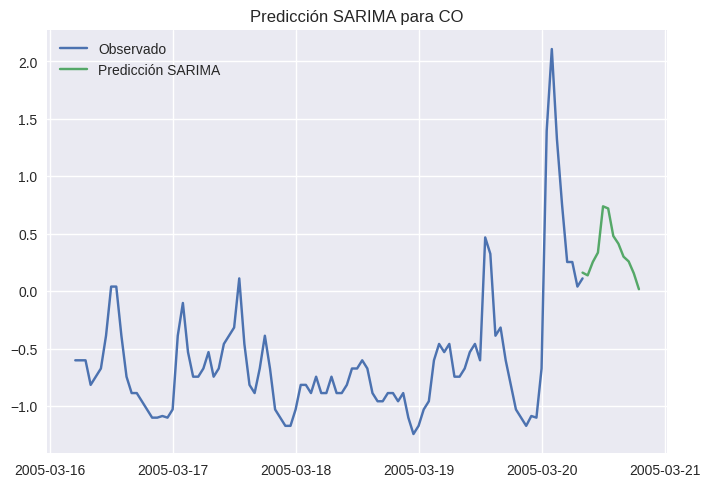

Resultados ARIMA para S1:
                               SARIMAX Results                                
Dep. Variable:                     S1   No. Observations:                 8625
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -5700.807
Date:                Fri, 20 Sep 2024   AIC                          11407.615
Time:                        01:49:48   BIC                          11428.802
Sample:                             0   HQIC                         11414.840
                               - 8625                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0838      0.033     -2.555      0.011      -0.148      -0.020
ma.L1          0.3514      0.032     11.100      0.000       0.289       0.413
sigma2         0.2196     

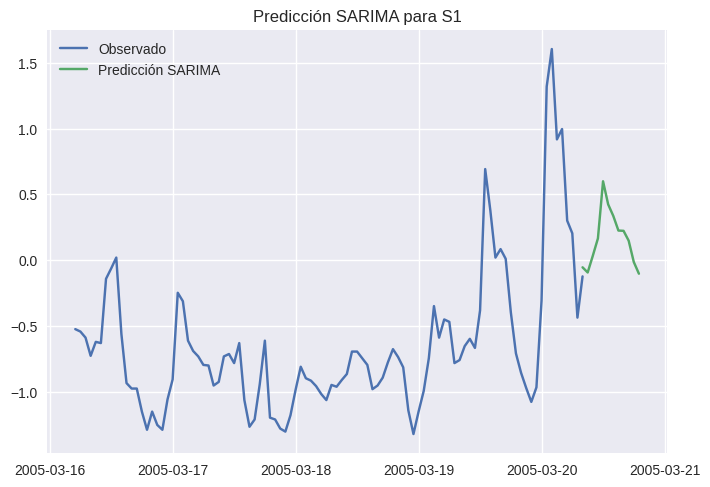

Resultados ARIMA para C6H6:
                               SARIMAX Results                                
Dep. Variable:                   C6H6   No. Observations:                 8625
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -7142.398
Date:                Fri, 20 Sep 2024   AIC                          14290.795
Time:                        01:50:08   BIC                          14311.982
Sample:                             0   HQIC                         14298.020
                               - 8625                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2038      0.028     -7.211      0.000      -0.259      -0.148
ma.L1          0.4414      0.028     16.046      0.000       0.387       0.495
sigma2         0.3068   

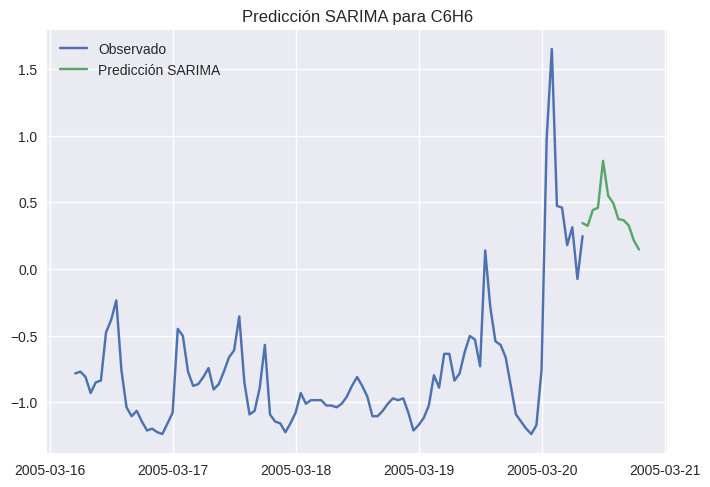

Resultados ARIMA para S2:
                               SARIMAX Results                                
Dep. Variable:                     S2   No. Observations:                 8625
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -6174.133
Date:                Fri, 20 Sep 2024   AIC                          12354.265
Time:                        01:50:26   BIC                          12375.452
Sample:                             0   HQIC                         12361.490
                               - 8625                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0399      0.028     -1.417      0.156      -0.095       0.015
ma.L1          0.3387      0.028     12.059      0.000       0.284       0.394
sigma2         0.2451     

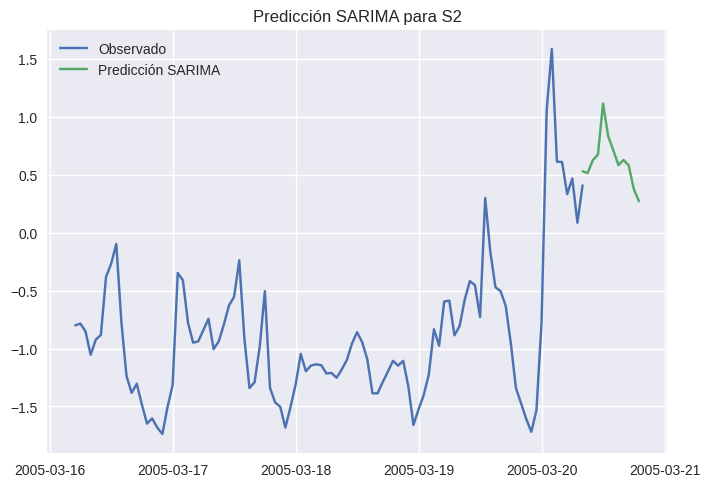

Resultados ARIMA para NOx:
                               SARIMAX Results                                
Dep. Variable:                    NOx   No. Observations:                 8625
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -5351.417
Date:                Fri, 20 Sep 2024   AIC                          10708.834
Time:                        01:50:42   BIC                          10730.021
Sample:                             0   HQIC                         10716.058
                               - 8625                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0628      0.038     -1.663      0.096      -0.137       0.011
ma.L1          0.2450      0.036      6.812      0.000       0.175       0.316
sigma2         0.2025    

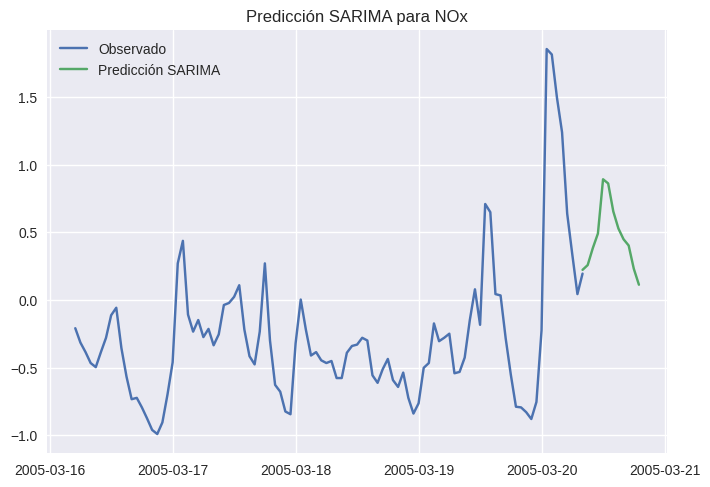

Resultados ARIMA para S3:
                               SARIMAX Results                                
Dep. Variable:                     S3   No. Observations:                 8625
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -4650.497
Date:                Fri, 20 Sep 2024   AIC                           9306.993
Time:                        01:50:59   BIC                           9328.180
Sample:                             0   HQIC                          9314.218
                               - 8625                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1263      0.026      4.788      0.000       0.075       0.178
ma.L1          0.1872      0.026      7.276      0.000       0.137       0.238
sigma2         0.1721     

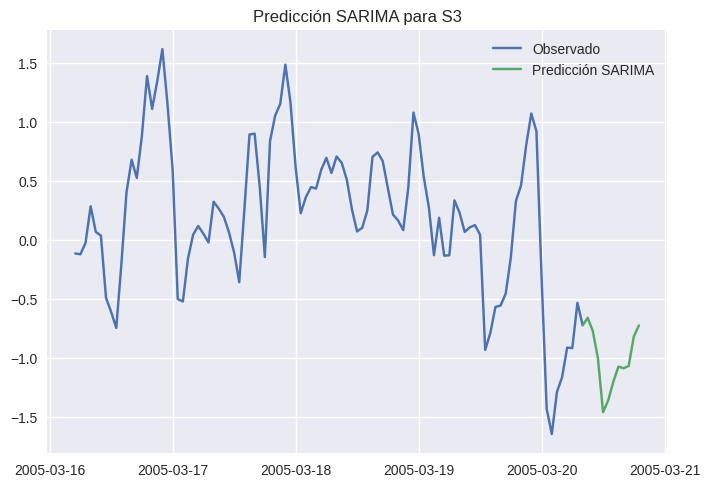

Resultados ARIMA para NO2:
                               SARIMAX Results                                
Dep. Variable:                    NO2   No. Observations:                 8625
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -5299.865
Date:                Fri, 20 Sep 2024   AIC                          10605.730
Time:                        01:51:14   BIC                          10626.917
Sample:                             0   HQIC                         10612.955
                               - 8625                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1618      0.046      3.524      0.000       0.072       0.252
ma.L1          0.0318      0.046      0.690      0.490      -0.058       0.122
sigma2         0.2001    

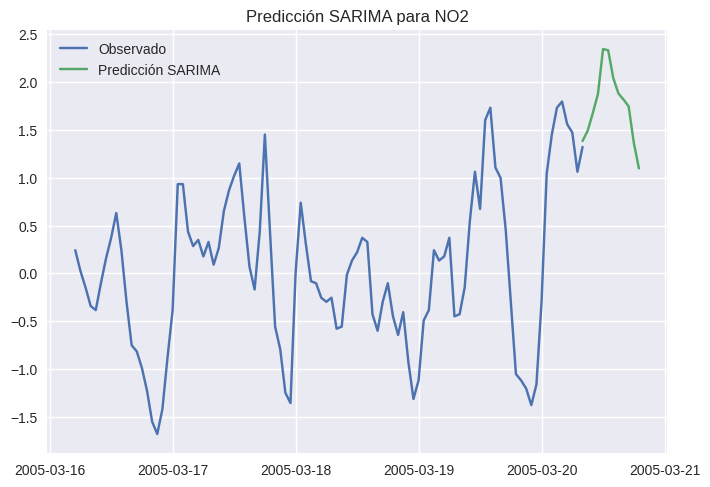

Resultados ARIMA para S4:
                               SARIMAX Results                                
Dep. Variable:                     S4   No. Observations:                 8625
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -4582.044
Date:                Fri, 20 Sep 2024   AIC                           9170.088
Time:                        01:51:35   BIC                           9191.275
Sample:                             0   HQIC                          9177.312
                               - 8625                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1942      0.031     -6.227      0.000      -0.255      -0.133
ma.L1          0.4268      0.031     13.927      0.000       0.367       0.487
sigma2         0.1694     

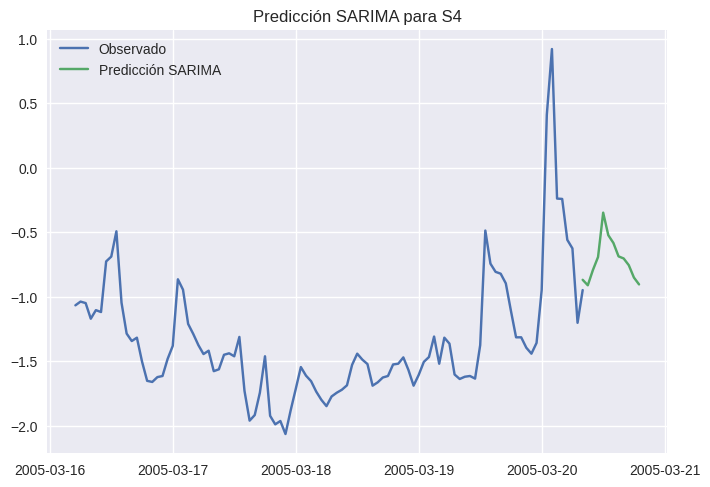

Resultados ARIMA para S5:
                               SARIMAX Results                                
Dep. Variable:                     S5   No. Observations:                 8625
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -5131.499
Date:                Fri, 20 Sep 2024   AIC                          10268.999
Time:                        01:51:52   BIC                          10290.185
Sample:                             0   HQIC                         10276.223
                               - 8625                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0538      0.032      1.686      0.092      -0.009       0.116
ma.L1          0.2438      0.031      7.779      0.000       0.182       0.305
sigma2         0.1925     

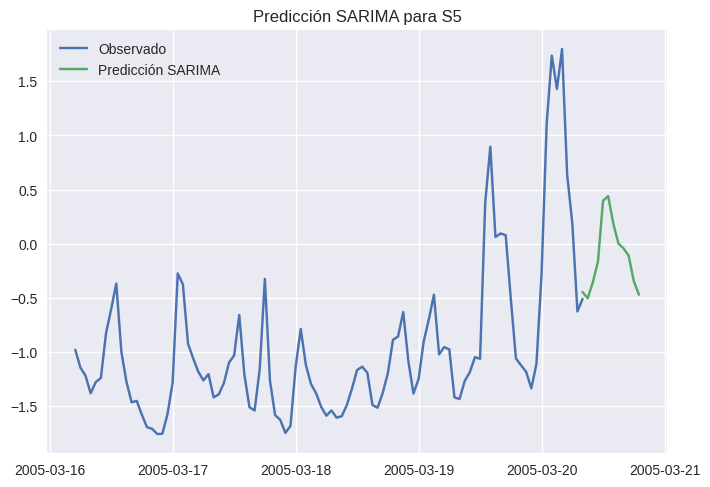

Resultados ARIMA para Temp:
                               SARIMAX Results                                
Dep. Variable:                   Temp   No. Observations:                 8625
Model:                 ARIMA(1, 1, 1)   Log Likelihood                4561.127
Date:                Fri, 20 Sep 2024   AIC                          -9116.255
Time:                        01:52:08   BIC                          -9095.068
Sample:                             0   HQIC                         -9109.030
                               - 8625                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6430      0.015     44.275      0.000       0.615       0.671
ma.L1         -0.1857      0.015    -12.397      0.000      -0.215      -0.156
sigma2         0.0203   

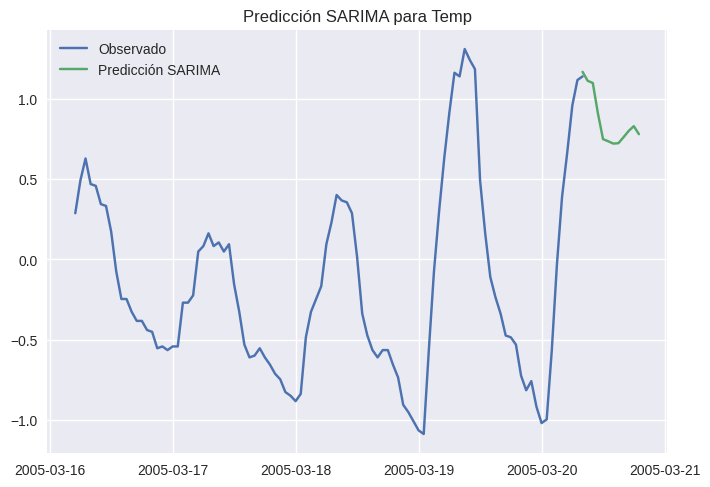

Resultados ARIMA para HR:
                               SARIMAX Results                                
Dep. Variable:                     HR   No. Observations:                 8625
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -462.811
Date:                Fri, 20 Sep 2024   AIC                            931.622
Time:                        01:52:39   BIC                            952.809
Sample:                             0   HQIC                           938.847
                               - 8625                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5050      0.021     23.965      0.000       0.464       0.546
ma.L1         -0.1517      0.022     -6.961      0.000      -0.194      -0.109
sigma2         0.0652     

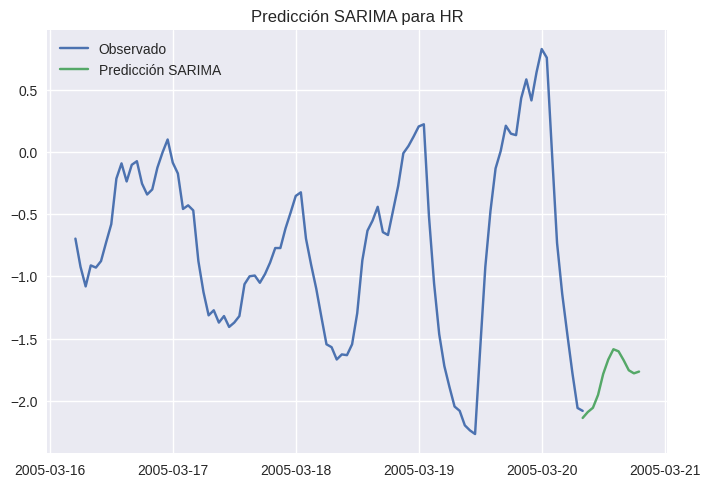

Resultados ARIMA para HA:
                               SARIMAX Results                                
Dep. Variable:                     HA   No. Observations:                 8625
Model:                 ARIMA(1, 1, 1)   Log Likelihood                6023.224
Date:                Fri, 20 Sep 2024   AIC                         -12040.447
Time:                        01:53:02   BIC                         -12019.260
Sample:                             0   HQIC                        -12033.222
                               - 8625                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0982      0.023     -4.309      0.000      -0.143      -0.054
ma.L1          0.3584      0.022     16.185      0.000       0.315       0.402
sigma2         0.0145   8.

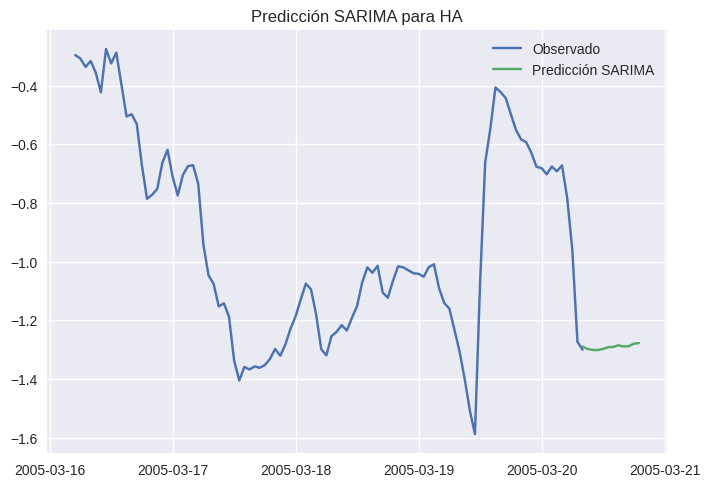

In [ ]:
for var in variables:
  ajustar_modelos(aire_copy, var)

**Interpretation of the Results:**

* **CO(GT):**

  * **ARIMA(1,1,1):** The AR(1) and MA(1) coefficients are significant, indicating that the data is well modeled by a simple ARIMA process. The AR coefficient (-0.1971) suggests that the series depends inversely on its previous value.
  * **SARIMA(1,1,1)(1,1,1,12):** The inclusion of seasonal terms (L12) improves the model. The negative value in AR.S.L12 (-0.2264) indicates a significant seasonal influence every 12 periods (months), which SARIMA captures better.

* **C6H6(GT):**

  * **ARIMA(1,1,1):** The model captures the general patterns well, with significant coefficients in both AR and MA. The model predicts with a slight inverse effect (AR of -0.2077).
  * **SARIMA:** The seasonal term (-0.2691) is even stronger in this case, implying that the variable has a significant seasonal component.

* **NOx(GT):**

  * **ARIMA:** The AR coefficient (-0.0722) is very low, indicating that past values do not have much influence on future values. MA(0.2580) is more significant, suggesting that recent past “shocks” (noise) are important.
  * **SARIMA:** Seasonality again plays a key role, with AR.S.L12 (-0.2005) indicating an annual cycle.

* **T (Temperature):**

  * **ARIMA(1,1,1):** The AR(0.6533) and MA(-0.1784) values are significant, with a strong relationship to the previous value, which is typical in temperature data.
  * **SARIMA:** The seasonal component is strong (-0.3322 in AR.S.L12), which makes sense as temperature follows seasonal patterns.

* **RH (Relative Humidity):**

  * **ARIMA:** The AR(0.4892) coefficient shows a strong dependence of humidity on past values, with an acceptable fit even without seasonality.
  * **SARIMA:** The seasonal component (-0.1789) indicates a clear seasonal pattern in humidity.

* **AH (Absolute Humidity):**

  * **ARIMA:** AR(-0.1065) and MA(0.3751) suggest a moderate dependence of absolute humidity on past values.
  * **SARIMA:** The seasonal component (-0.0249) is much weaker compared to other variables, which may indicate a lower seasonal influence.

**Conclusion:**

SARIMA outperforms ARIMA for all variables due to the strong presence of seasonality, especially in variables like CO(GT), C6H6(GT), NOx(GT), and T, where annual cycles play a key role.
SARIMA models capture annual cyclic patterns, which is crucial for improving time series predictions.
Temperature and humidity show strong seasonal patterns, while other variables such as AH present less pronounced seasonality.
This analysis suggests that seasonality (captured by SARIMA) is a key factor in predicting many of the variables in your dataset.


## VAR Model

Next, we propose a more complex model that combines all the variables with each other — a VAR (Vector Autoregressive) model.

When proposing a VAR (Vector Autoregressive) model, it is important to note that all variables in a VAR model are treated symmetrically, meaning there is no explicit distinction between dependent and independent variables. Each variable is explained by its own lags and the lags of the other variables included in the system.

In your case, if you are going to work with a VAR model for the environmental pollution and weather dataset, each variable will act as both dependent and independent. The relationships will be captured among all the variables simultaneously, allowing the model to account for their interdependence.


In [ ]:
aire_copy = aire_copy[~aire_copy.index.duplicated(keep='first')]
#preguntar porque se hizo esto

In [ ]:
model = VAR(aire_copy)

#Selección automática de lags basada en AIC
results = model.fit(ic='aic')
print(f"Lag seleccionado: {results.k_ar}")
print(results.summary())

Lag seleccionado: 26
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 20, Sep, 2024
Time:                     01:54:00
--------------------------------------------------------------------
No. of Equations:         12.0000    BIC:                   -42.3597
Nobs:                     8599.00    HQIC:                  -44.3915
Log likelihood:           52721.5    FPE:                1.83845e-20
AIC:                     -45.4432    Det(Omega_mle):     1.19708e-20
--------------------------------------------------------------------
Results for equation CO
              coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------
const           -0.000253         0.004500           -0.056           0.955
L1.CO            0.235752         0.028916            8.153           0.000
L1.S1            0.721150         0.043677           16.511   

In [ ]:
#Predicción de 10 pasos hacia adelante
lag_order = results.k_ar
forecast_input = aire_copy.values[-lag_order:]
forecast = results.forecast(y=forecast_input, steps=10)

forecast_df = pd.DataFrame(forecast, index=pd.date_range(start=df.index[-1], periods=10, freq='H'), columns=variables)
print(forecast_df)

                                     CO        S1      C6H6        S2  \
1970-01-01 00:00:00.000008990  0.457437  0.133749  0.450243  0.560416   
1970-01-01 01:00:00.000008990  0.656091  0.281997  0.560129  0.627263   
1970-01-01 02:00:00.000008990  1.040149  0.536117  0.912444  0.914193   
1970-01-01 03:00:00.000008990  1.168060  0.725776  1.018716  0.965077   
1970-01-01 04:00:00.000008990  1.308055  0.880164  1.042082  1.050684   
1970-01-01 05:00:00.000008990  0.739814  0.455390  0.283649  0.459269   
1970-01-01 06:00:00.000008990  0.029629  0.065422 -0.247075 -0.062439   
1970-01-01 07:00:00.000008990 -0.348080 -0.197692 -0.551230 -0.410042   
1970-01-01 08:00:00.000008990 -0.492428 -0.323992 -0.694024 -0.615919   
1970-01-01 09:00:00.000008990 -0.570561 -0.440980 -0.727102 -0.759531   

                                    NOx        S3       NO2        S4  \
1970-01-01 00:00:00.000008990  0.433680 -0.795752  1.499026 -0.750804   
1970-01-01 01:00:00.000008990  0.659343 -0.740916 

In [ ]:
matriz_coeficientes = results.params
matriz_pvalues = results.pvalues

nivel_significancia = 0.05

diccionario_coeficientes_significativos = {}

for var in matriz_coeficientes.columns:
  coeficientes = matriz_coeficientes[var]
  pvalues = matriz_pvalues[var]

#Filtro aquellos coeficientes que son estadísticamente significativos.
  coeficientes_significativos = coeficientes[pvalues < nivel_significancia]


  if not coeficientes_significativos.empty:
    diccionario_coeficientes_significativos[var] = coeficientes_significativos


for var, coeficientes in diccionario_coeficientes_significativos.items():
  print(f"Coeficientes significativos para {var}:")
  print(coeficientes)
  print("\n")

Coeficientes significativos para CO:
L1.CO      0.235752
L1.S1      0.721150
L1.C6H6   -0.237768
L1.S2      0.574840
L1.NOx     0.132102
             ...   
L24.S5    -0.097053
L25.S5     0.144018
L26.CO    -0.077914
L26.S3     0.062596
L26.S4     0.190379
Name: CO, Length: 63, dtype: float64


Coeficientes significativos para S1:
L1.CO     -0.296384
L1.S1      1.250247
L1.C6H6   -0.236353
L1.S2      0.322489
L1.NOx     0.080957
             ...   
L25.S3    -0.075356
L25.S5     0.152689
L26.S3     0.078651
L26.S4     0.121674
L26.S5    -0.071199
Name: S1, Length: 64, dtype: float64


Coeficientes significativos para C6H6:
L1.CO      -0.315415
L1.S1       0.642882
L1.C6H6     0.231800
L1.S2       0.582491
L1.NOx      0.146518
L1.S3       0.080565
L1.S5      -0.209595
L1.Temp    -0.408139
L1.HR      -0.240891
L1.HA      -0.166987
L2.CO       0.146370
L2.S1      -0.605619
L2.S3      -0.123608
L2.S4      -0.131700
L2.S5       0.245937
L2.Temp     0.446588
L2.HR       0.203879
L2.HA       

## VAR Model Analysis

**CO(GT)**

Carbon monoxide (CO) appears to depend significantly on its own past values (positive coefficient of 0.247 at L1), indicating a persistence component. Additionally, it is influenced by the concentration of C6H6(GT) (negative coefficient of -0.216 at L1), suggesting that when benzene levels increase, CO levels may decrease.

**C6H6(GT)**

Benzene seems to be influenced by several variables, but notably, temperature (T) has a significant negative coefficient (-0.246 at L1). This indicates that when temperature rises, benzene concentration decreases, which may be related to the volatilization or dispersion of benzene in the air.

**NOx(GT)**

Nitrogen oxides (NOx) show a strong dependence on their own past value (0.822 at L1) and also an interesting correlation with CO(GT) (-0.363 at L1). This indicates that as carbon monoxide levels decrease, NOx levels tend to increase, which may reflect some type of compensatory effect in air quality.

**T (Temperature)**

Temperature is significantly influenced by its own first lag (coefficient of 1.118), which is quite common in temperature time series. There is also a slight influence from C6H6(GT), with a positive coefficient (0.095 at L22), which could indicate some interaction between temperature and the dispersion of pollutants like benzene.

**RH (Relative Humidity)**

Relative humidity (RH) also shows a strong dependence on its own past value (coefficient of 1.101 at L1). However, its relationship with NOx(GT) is interesting, as it has a negative effect at lag 5 (-0.073 at L5), which could reflect how humidity influences the dispersion of pollutants.

**Summary**

There is substantial interaction between atmospheric pollutants and weather conditions. Carbon monoxide and benzene seem to play a key role in how other gases disperse or accumulate, and both temperature and humidity are important in the dynamics of these pollutants. It is a highly interconnected system, as expected.

This type of analysis is useful for predicting how air quality may vary depending on weather conditions and the concentration of different pollutants, which could have implications for environmental public policy.


## Granger Causality Test
The Granger causality test allows you to evaluate whether one variable can help predict another. This analysis indicates whether a variable is useful for forecasting the behavior of the others.

In [ ]:
def generar_funciones_impulso_respuesta(resultados_var, variables, periodos=10):
  irf = resultados_var.irf(periodos)

  for i, variable in enumerate(variables):
    plt.figure(figsize=(10, 6))
    for j in range(len(variables)):
      plt.plot(irf.irfs[:, i, j], label=f'Impacto en {variables[j]}')

    plt.title(f"Función de Impulso-Respuesta para {variable}")
    plt.xlabel("Periodos")
    plt.ylabel("Respuesta acumulada")
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

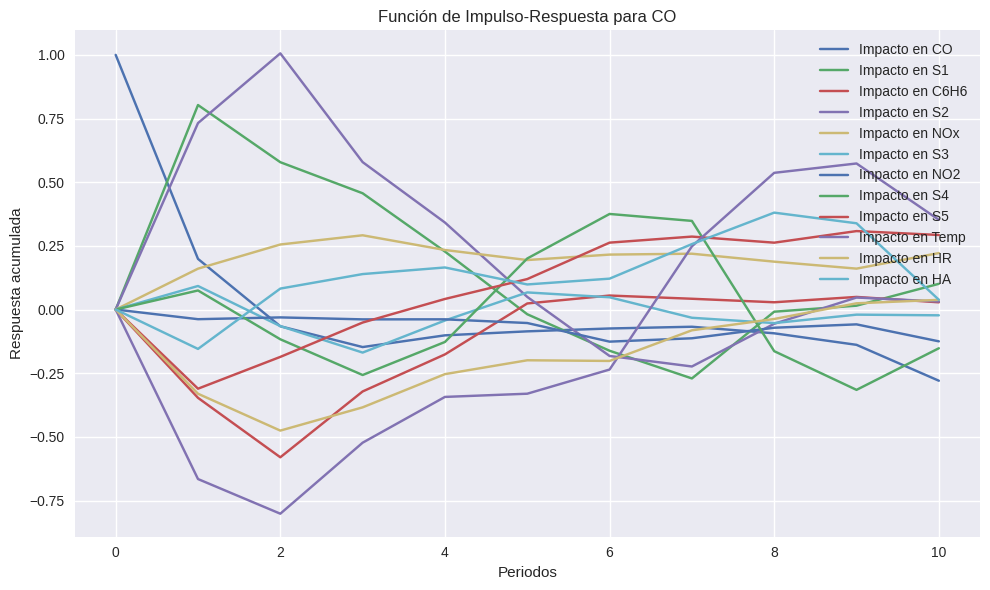

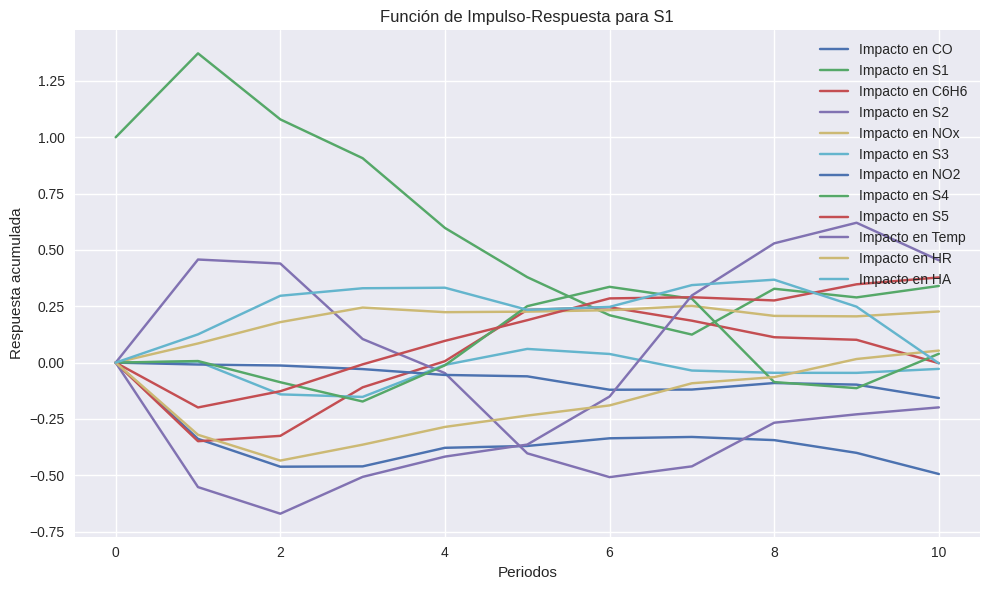

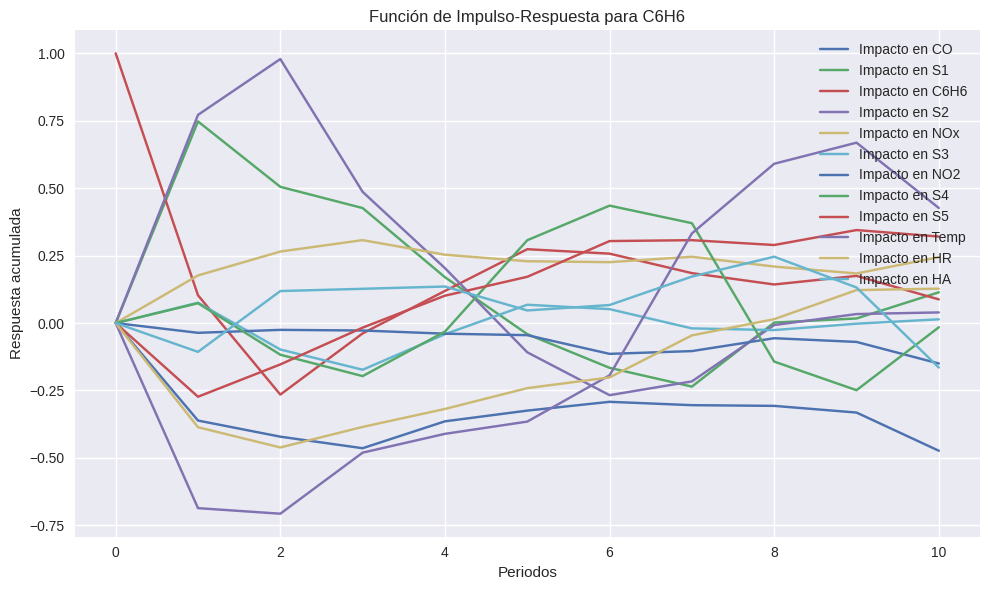

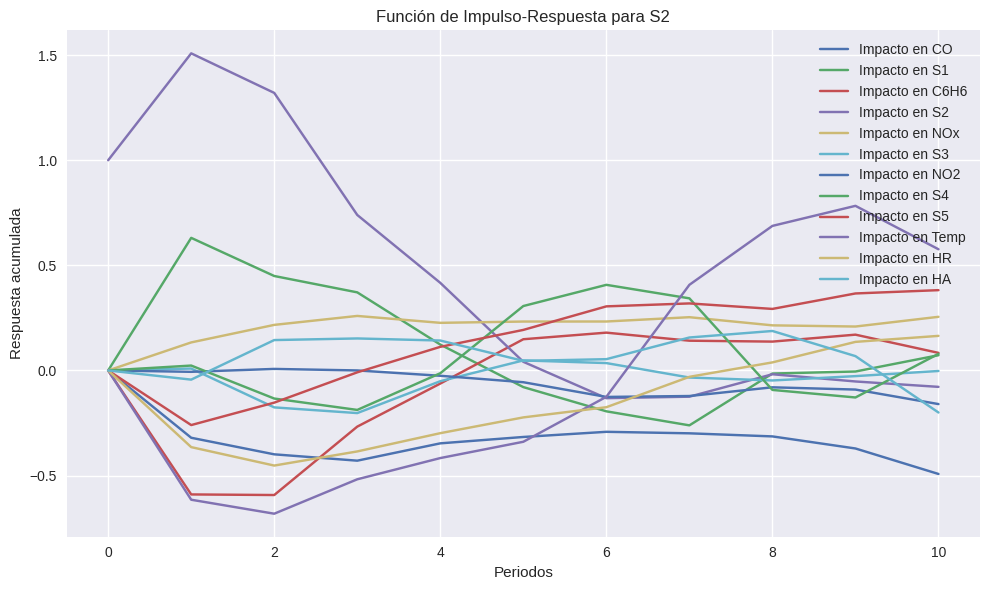

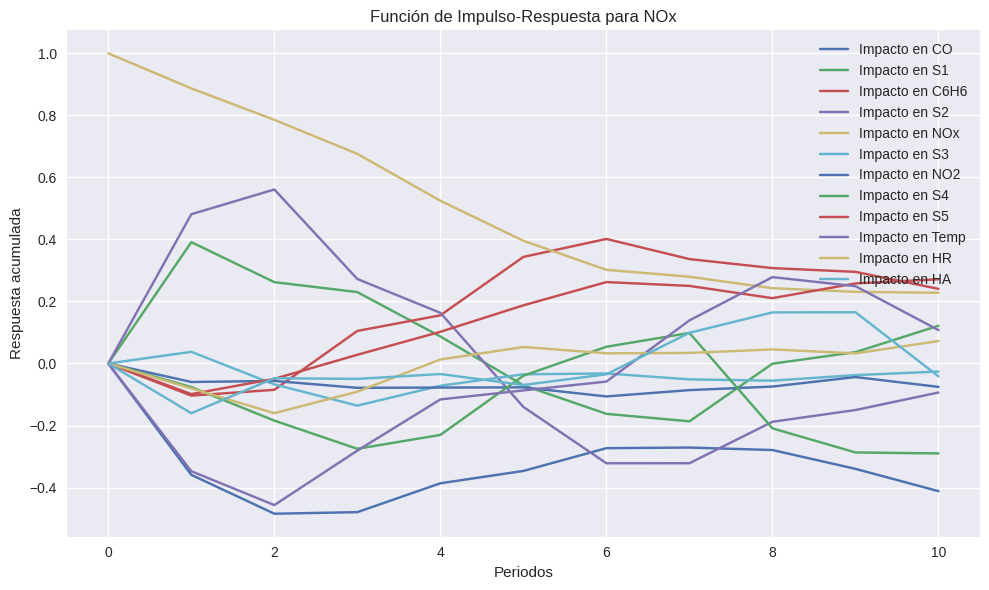

...

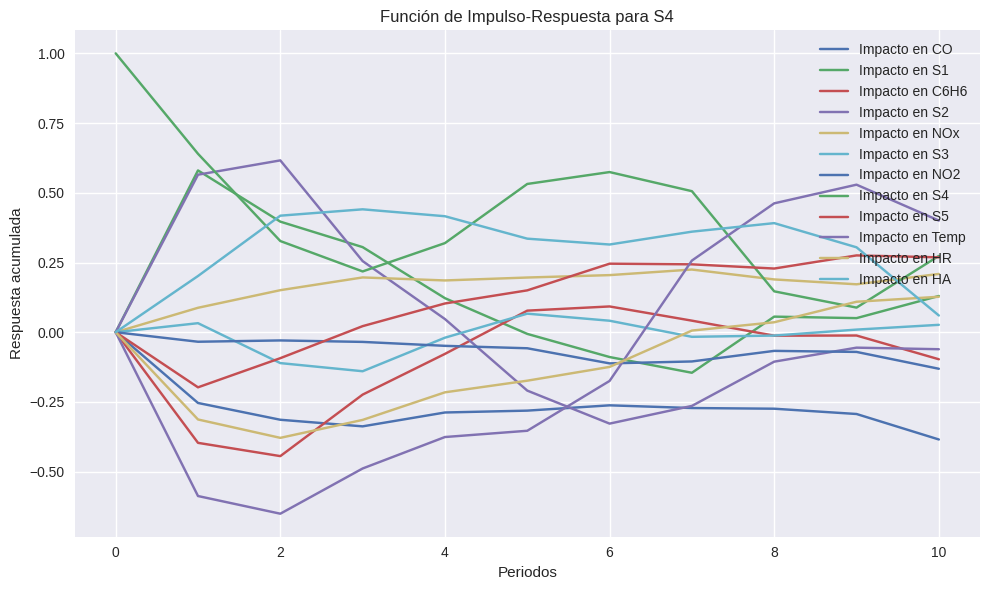

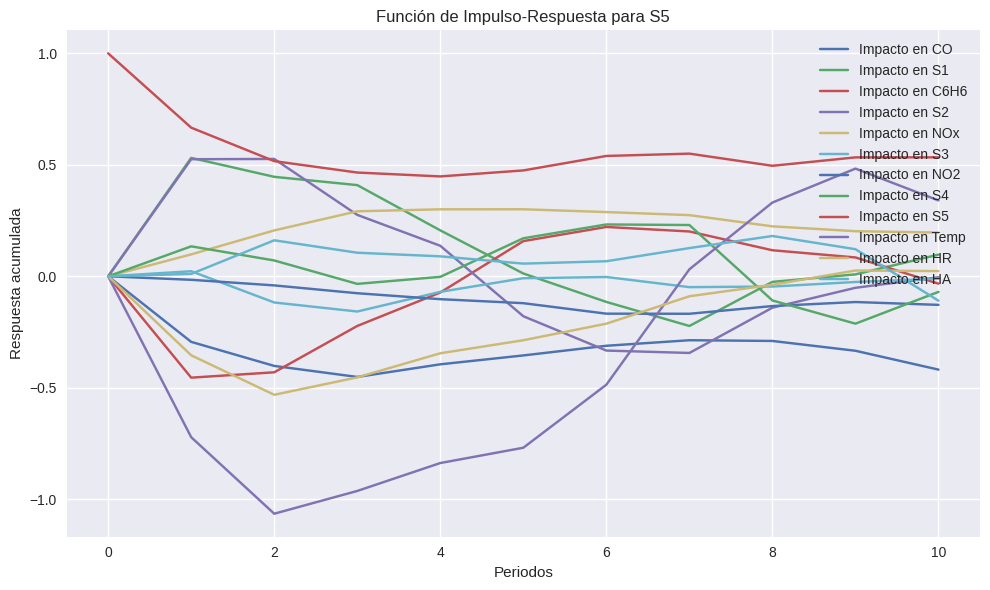

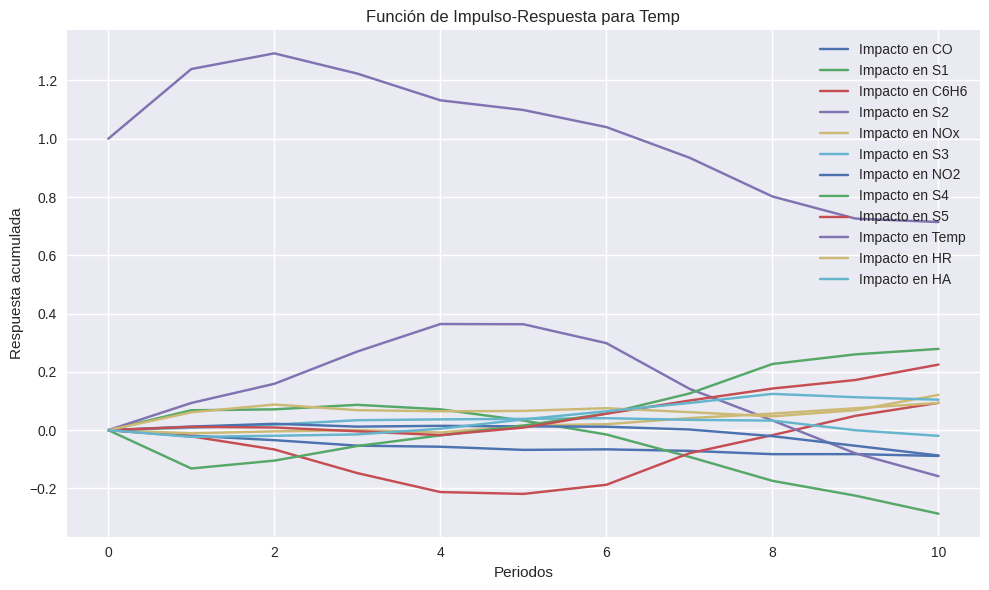

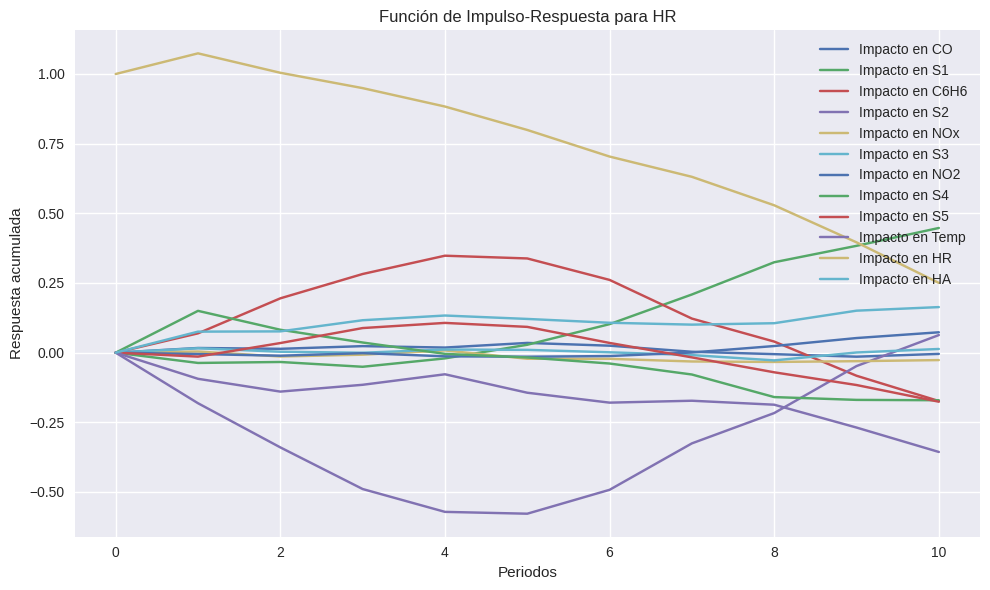

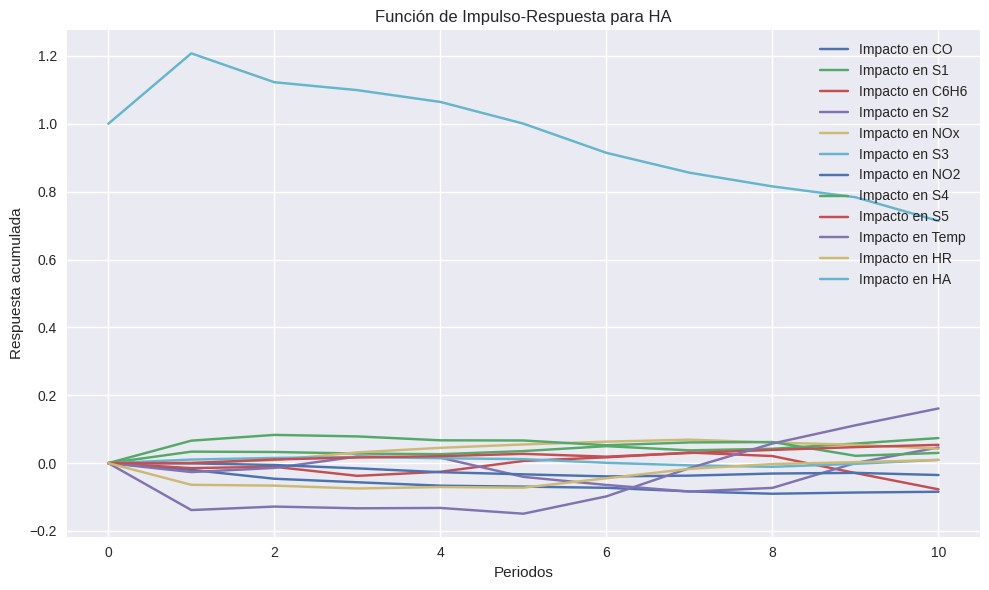

In [ ]:
model = VAR(aire_copy)
results = model.fit(maxlags=15, ic='aic')

generar_funciones_impulso_respuesta(results, variables, periodos=10)

## Conclusions from the Impulse Response Functions

1. **CO and its influence on other pollutants:**

Carbon monoxide (CO) has a strong impact on other pollutants, which makes sense because CO emissions are usually linked to traffic and fossil fuel combustion. Its effect on PT08.S1(CO) is particularly relevant since this sensor is specifically designed to measure CO directly, so that relationship is expected.
In addition, CO significantly affects NOx levels and PT08.S3(NOx) (which are measurements of nitrogen oxides). This could be related to traffic and fuel burning, as both gases typically occur together in urban areas.

2. **C6H6 (Benzene):**

Benzene (C6H6) is another pollutant that shows a notable impact on several other gases, such as CO and nitrogen oxides. This behavior could be linked to fuel combustion or industrial emissions. Moreover, benzene is also affected by variables such as temperature and relative humidity, suggesting that weather conditions may influence its concentration in the air.

3. **Nitrogen Oxides (NOx):**

Nitrogen oxides (NOx and NO2) also show complex relationships with other pollutants like CO and benzene. This makes sense since NOx are typical byproducts of internal combustion engines (such as in cars) and industrial processes.
An interesting finding is how NO2 (nitrogen dioxide) reacts to increases in CO, giving us clues about pollutant behavior during rush hours or in more industrial areas.

4. **Effect of Temperature and Humidity:**

Although temperature and relative humidity do not seem to have a very strong direct impact on most pollutants, we do see that temperature affects benzene—probably because heat facilitates its volatilization.
On the other hand, relative humidity is influenced by CO and benzene, which could be related to seasonal weather conditions.

**Overall Conclusion:**

In summary, air pollution in this city appears to be closely tied to traffic and industrial emissions, especially due to the interaction between CO, benzene, and nitrogen oxides. Temperature and humidity also play a role, albeit a subtler one.
